# SENTINEL AI INFERENCE PIPELINE

## Vehicle Detection + Tracking + ANPR

Pipeline:

Sentinel Stream
→ Decode
→ PTS
→ Frame Buffer
→ Frame Sampling
→ Preprocessing
→ Vehicle Detection
→ Tracking
→ Plate Detection
→ OCR
→ Plate Validation
→ JSON Result

Target:
Real-time CCTV AI inference using Google Colab GPU.

In [1]:
# ============================================================
# STEP 01 — ENVIRONMENT
# ============================================================

import sys
import os
import cv2
import re
import json
import time
import uuid
import subprocess
import requests
import numpy as np

from pathlib import Path
from collections import Counter, defaultdict
from datetime import datetime, timezone
from urllib.parse import urljoin

print("=" * 60)
print("SENTINEL AI ENVIRONMENT")
print("=" * 60)

print("Python:", sys.version)
print("OpenCV:", cv2.__version__)

try:
    import torch

    print("PyTorch:", torch.__version__)
    print("CUDA available:", torch.cuda.is_available())

    if torch.cuda.is_available():
        print(
            "GPU:",
            torch.cuda.get_device_name(0)
        )

except Exception as e:
    print("PyTorch check failed:", e)

print("=" * 60)

SENTINEL AI ENVIRONMENT
Python: 3.13.15 (main, Aug  6 2026, 11:06:23) [GCC 11.4.0]
OpenCV: 5.0.0
PyTorch: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


In [2]:
# ============================================================
# STEP 02 — INSTALL DEPENDENCIES
# ============================================================

!pip install -q ultralytics paddleocr paddlepaddle \
    pycryptodome huggingface_hub

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.7/80.7 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.5/66.5 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 48.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.8/146.8 kB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 76.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 69.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 759.5/759.5 kB 48.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.7/68.7 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.2/6

In [3]:
# ============================================================
# STEP 03 — CONFIGURATION
# ============================================================

DEVICE = 0

CAMERA_ID = "cam01"

YOLO_IMGSZ = 960
YOLO_CONF = 0.20
YOLO_IOU = 0.50

PLATE_CONF = 0.20
OCR_CONF = 0.85

TARGET_FPS = 5

FRAME_WIDTH = 1920
FRAME_HEIGHT = 1080

print("=" * 60)
print("CONFIGURATION")
print("=" * 60)

print("Camera:", CAMERA_ID)
print("YOLO image size:", YOLO_IMGSZ)
print("YOLO confidence:", YOLO_CONF)
print("Target inference FPS:", TARGET_FPS)
print("Device:", DEVICE)

CONFIGURATION
Camera: cam01
YOLO image size: 960
YOLO confidence: 0.2
Target inference FPS: 5
Device: 0


In [4]:
# ============================================================
# STEP 04 — SENTINEL SESSION
# ============================================================

SENTINEL_BASE_URL = "https://cctv.corp8.cloud"

session = requests.Session()

print("=" * 60)
print("SENTINEL SESSION READY")
print("=" * 60)

print("Base URL:", SENTINEL_BASE_URL)

SENTINEL SESSION READY
Base URL: https://cctv.corp8.cloud


In [5]:
# ============================================================
# STEP 05 — SENTINEL AUTHENTICATION
# ============================================================

from getpass import getpass

password = getpass(
    "Enter Sentinel password: "
)

login_url = (
    SENTINEL_BASE_URL
    + "/auth/login"
)

response = session.post(
    login_url,
    data={
        "password": password
    },
    timeout=20
)

print(
    "Login status:",
    response.status_code
)

print(
    "Final URL:",
    response.url
)

if response.status_code != 200:
    raise RuntimeError(
        "Sentinel authentication failed."
    )

print("✅ Sentinel session established.")

Enter Sentinel password: ··········
Login status: 200
Final URL: https://cctv.corp8.cloud/
✅ Sentinel session established.


In [6]:
# ============================================================
# STEP 06 — CAMERA CATALOGUE
# ============================================================

catalogue_url = (
    SENTINEL_BASE_URL
    + "/cameras.json"
)

response = session.get(
    catalogue_url,
    timeout=20
)

print(
    "Status:",
    response.status_code
)

print(
    "Content-Type:",
    response.headers.get("Content-Type")
)

if "application/json" not in response.headers.get(
    "Content-Type",
    ""
):
    raise RuntimeError(
        "Camera catalogue did not return JSON."
    )

cameras = response.json()

print(
    "Number of cameras:",
    len(cameras)
)

for camera in cameras:
    print(
        camera["id"],
        "|",
        camera["name"]
    )

Status: 200
Content-Type: application/json
Number of cameras: 30
cam01 | 01 Chiman bhai Bridge
cam02 | 02 Janpath
cam03 | 03 O.N.G.C. Office
cam04 | 04 Paldi Circle
cam05 | 05 Visat teen Rasta
cam06 | 06 Timbavadi gate-Junagadh
cam07 | 07 hero-showroom-gir-somnath
cam08 | 08 majewadi-gate-junagadh
cam09 | 09 new-bypass-near-by-circle-junagadh-2
cam10 | 10 char-chowk-road-2-junagadh
cam11 | 11 dolatpara-junagadh
cam12 | 12 Tri Mandir Adalaj Tollnaka
cam13 | 13 CN Vidhyalaya
cam14 | 14 Delight RLVD
cam15 | 15 Suvidha park
cam16 | 16 Visat P2
cam17 | 17 Rajkot Bus Port CCTV
cam18 | 18 Rajkot CCTV
cam19 | 19 KHAPARIA GRAM PANCHAYAT , TALUKA GANDEVI, DISTRICT NAVSARI
cam20 | 20 Mohanpura
cam21 | 23 Patan Dethali Char Rasta
cam22 | 28 BK Mervada tran Rasta
cam23 | 30 kheram
cam24 | 33 dehgam
cam25 | 34 dhanori
cam26 | 35 TANKAL
cam27 | 36 bilimora
cam28 | 37 bilimora
cam29 | 38 bilimora
cam30 | Gandhidham Rambaugh p2


In [7]:
# ============================================================
# STEP 07 — BUILD CAMERA STREAM MAP
# ============================================================

camera_map = {}

for camera in cameras:

    camera_id = camera["id"]

    camera_map[camera_id] = {
        "id": camera_id,
        "name": camera["name"],
        "hls_url": (
            f"{SENTINEL_BASE_URL}/"
            f"{camera_id}/index.m3u8"
        ),
        "rtsp_url": (
            "rtsp://103.250.160.189:8554/"
            f"stream/{camera_id}"
        )
    }

print("=" * 60)
print("CAMERA STREAM MAP")
print("=" * 60)

selected_camera = camera_map[CAMERA_ID]

print(
    json.dumps(
        selected_camera,
        indent=2
    )
)

CAMERA STREAM MAP
{
  "id": "cam01",
  "name": "01 Chiman bhai Bridge",
  "hls_url": "https://cctv.corp8.cloud/cam01/index.m3u8",
  "rtsp_url": "rtsp://103.250.160.189:8554/stream/cam01"
}


In [8]:
# ============================================================
# STEP 08 — HLS STREAM TEST
# ============================================================

TEST_HLS_URL = selected_camera["hls_url"]

response = session.get(
    TEST_HLS_URL,
    timeout=20
)

print(
    "Status:",
    response.status_code
)

print(
    "Content-Type:",
    response.headers.get("Content-Type")
)

if response.status_code != 200:
    raise RuntimeError(
        "HLS stream unavailable."
    )

playlist = response.text

print(
    "Playlist size:",
    len(playlist)
)

print(
    playlist[:1000]
)

Status: 200
Content-Type: application/vnd.apple.mpegurl
Playlist size: 216220
#EXTM3U
#EXT-X-VERSION:6
#EXT-X-TARGETDURATION:8
#EXT-X-MEDIA-SEQUENCE:0
#EXT-X-PLAYLIST-TYPE:VOD
#EXT-X-INDEPENDENT-SEGMENTS
#EXT-X-KEY:METHOD=AES-128,URI="/enc.key",IV=0x00000000000000000000000000000000
#EXTINF:7.920000,
seg00000.ts
#EXTINF:6.006000,
seg00001.ts
#EXTINF:6.004000,
seg00002.ts
#EXTINF:6.000000,
seg00003.ts
#EXTINF:6.003000,
seg00004.ts
#EXTINF:6.007000,
seg00005.ts
#EXTINF:6.010000,
seg00006.ts
#EXTINF:6.003000,
seg00007.ts
#EXTINF:6.007000,
seg00008.ts
#EXTINF:6.003000,
seg00009.ts
#EXTINF:6.000000,
seg00010.ts
#EXTINF:6.003000,
seg00011.ts
#EXTINF:6.007000,
seg00012.ts
#EXTINF:6.010000,
seg00013.ts
#EXTINF:6.007000,
seg00014.ts
#EXTINF:6.003000,
seg00015.ts
#EXTINF:6.010000,
seg00016.ts
#EXTINF:4.003000,
seg00017.ts
#EXTINF:6.004000,
seg00018.ts
#EXTINF:6.006000,
seg00019.ts
#EXTINF:5.987000,
seg00020.ts
#EXTINF:6.007000,
seg00021.ts
#EXTINF:6.003000,
seg00022.ts
#EXTINF:6.013000,
seg00023.

In [9]:
# ============================================================
# STEP 09 — HLS ENCRYPTION CHECK
# ============================================================

encrypted = (
    "#EXT-X-KEY" in playlist
)

print(
    "Encrypted HLS:",
    encrypted
)

if encrypted:
    print(
        "Encryption:",
        "AES-128"
    )

Encrypted HLS: True
Encryption: AES-128


In [10]:
# ============================================================
# STEP 10 — DOWNLOAD + DECRYPT HLS SEGMENT
# ============================================================

from Crypto.Cipher import AES

def download_hls_segment(
    session,
    playlist_url,
    segment_name
):

    key_url = urljoin(
        playlist_url,
        "/enc.key"
    )

    key_response = session.get(
        key_url,
        timeout=20
    )

    key_response.raise_for_status()

    key = key_response.content

    if len(key) != 16:
        raise ValueError(
            f"Invalid AES key length: {len(key)}"
        )

    segment_url = urljoin(
        playlist_url,
        segment_name
    )

    segment_response = session.get(
        segment_url,
        timeout=30
    )

    segment_response.raise_for_status()

    encrypted_segment = (
        segment_response.content
    )

    if len(encrypted_segment) % 16 != 0:
        raise ValueError(
            "Encrypted segment is not "
            "AES block aligned."
        )

    cipher = AES.new(
        key,
        AES.MODE_CBC,
        bytes(16)
    )

    decrypted = cipher.decrypt(
        encrypted_segment
    )

    return decrypted

In [11]:
# ============================================================
# STEP 11 — TEST DECRYPTION
# ============================================================

decrypted_segment = download_hls_segment(
    session,
    TEST_HLS_URL,
    "seg00000.ts"
)

print(
    "Decrypted segment:",
    len(decrypted_segment),
    "bytes"
)

print(
    "MPEG-TS sync:",
    hex(decrypted_segment[0])
)

if decrypted_segment[0] == 0x47:
    print(
        "✅ Segment pipeline working."
    )
else:
    raise RuntimeError(
        "Invalid MPEG-TS data."
    )

Decrypted segment: 268848 bytes
MPEG-TS sync: 0x47
✅ Segment pipeline working.


In [12]:
# ============================================================
# STEP 11 — MPEG-TS → VIDEO FRAMES
# ============================================================

def decode_mpegts_frames(
    mpegts_bytes,
    width=1920,
    height=1080,
    max_frames=None
):
    """
    Decode MPEG-TS bytes into BGR frames.

    Frames are yielded one at a time.
    The complete decoded video is NOT stored in RAM.
    """

    process = subprocess.Popen(
        [
            "ffmpeg",
            "-hide_banner",
            "-loglevel", "error",

            # Input
            "-f", "mpegts",
            "-i", "pipe:0",

            # Output
            "-f", "rawvideo",
            "-pix_fmt", "bgr24",
            "pipe:1"
        ],
        stdin=subprocess.PIPE,
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE
    )

    frame_size = width * height * 3
    count = 0

    try:
        process.stdin.write(mpegts_bytes)
        process.stdin.close()

        while True:

            raw_frame = process.stdout.read(
                frame_size
            )

            if len(raw_frame) != frame_size:
                break

            frame = np.frombuffer(
                raw_frame,
                dtype=np.uint8
            ).reshape(
                height,
                width,
                3
            )

            yield frame

            count += 1

            if (
                max_frames is not None
                and count >= max_frames
            ):
                break

    finally:

        if process.poll() is None:
            process.kill()

        process.wait()


print("✅ MPEG-TS frame decoder ready.")

✅ MPEG-TS frame decoder ready.


In [13]:
# ============================================================
# STEP 11B — DECODE TEST FRAMES
# ============================================================

test_frames = []

for frame in decode_mpegts_frames(
    decrypted_segment,
    width=FRAME_WIDTH,
    height=FRAME_HEIGHT,
    max_frames=3
):

    test_frames.append(frame)

    print(
        f"Frame {len(test_frames)}"
        f" | Shape: {frame.shape}"
        f" | dtype: {frame.dtype}"
    )

print()
print(
    "Total frames decoded:",
    len(test_frames)
)

Frame 1 | Shape: (1080, 1920, 3) | dtype: uint8
Frame 2 | Shape: (1080, 1920, 3) | dtype: uint8
Frame 3 | Shape: (1080, 1920, 3) | dtype: uint8

Total frames decoded: 3


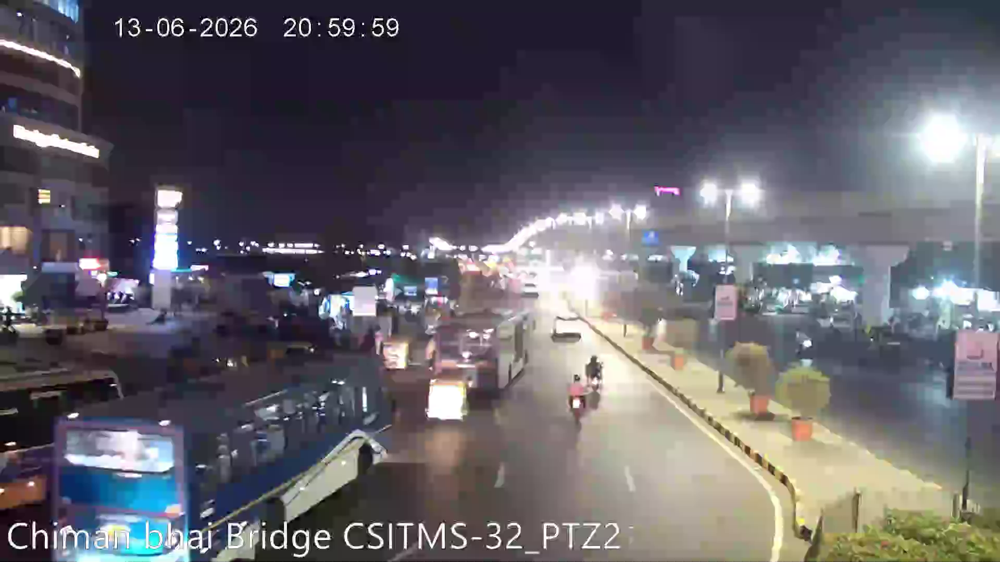

Sentinel frame: (1080, 1920, 3)


In [14]:
# ============================================================
# STEP 11C — DISPLAY SENTINEL FRAME
# ============================================================

from PIL import Image
from IPython.display import display

if not test_frames:
    raise RuntimeError(
        "No frames were decoded."
    )

sentinel_frame = test_frames[0]

display(
    Image.fromarray(
        cv2.cvtColor(
            sentinel_frame,
            cv2.COLOR_BGR2RGB
        )
    )
)

print(
    "Sentinel frame:",
    sentinel_frame.shape
)

In [15]:
# ============================================================
# STEP 12 — INSPECT VIDEO TIMING
# ============================================================

import json
import subprocess

probe_process = subprocess.run(
    [
        "ffprobe",
        "-v", "error",
        "-f", "mpegts",
        "-show_entries",
        "frame=pts,pts_time,best_effort_timestamp,"
        "best_effort_timestamp_time",
        "-of", "json",
        "pipe:0"
    ],
    input=decrypted_segment,
    stdout=subprocess.PIPE,
    stderr=subprocess.PIPE
)

print(
    "ffprobe return code:",
    probe_process.returncode
)

if probe_process.stderr:
    print(
        probe_process.stderr.decode(
            errors="ignore"
        )[:2000]
    )

timing_data = json.loads(
    probe_process.stdout.decode()
)

frames_with_pts = timing_data.get(
    "frames",
    []
)

print(
    "Frames with timing information:",
    len(frames_with_pts)
)

for item in frames_with_pts[:5]:

    print(
        json.dumps(
            item,
            indent=2
        )
    )

ffprobe return code: 0
Frames with timing information: 120
{
  "best_effort_timestamp": 126000,
  "best_effort_timestamp_time": "1.400000"
}
{
  "best_effort_timestamp": 126001,
  "best_effort_timestamp_time": "1.400011"
}
{
  "best_effort_timestamp": 133200,
  "best_effort_timestamp_time": "1.480000"
}
{
  "best_effort_timestamp": 136800,
  "best_effort_timestamp_time": "1.520000"
}
{
  "best_effort_timestamp": 144000,
  "best_effort_timestamp_time": "1.600000"
}


In [16]:
# ============================================================
# STEP 13A — EXTRACT PTS + FRAMES
# ============================================================

def extract_frames_with_pts(
    mpegts_bytes,
    width,
    height,
    max_frames=None
):
    """
    Decode MPEG-TS and return frames together
    with their video timestamps.

    Timing comes from FFmpeg PTS.
    """

    # --------------------------------------------------------
    # Get frame timestamps
    # --------------------------------------------------------

    probe = subprocess.run(
        [
            "ffprobe",
            "-v", "error",
            "-f", "mpegts",
            "-show_entries",
            "frame=best_effort_timestamp_time",
            "-of", "json",
            "pipe:0"
        ],
        input=mpegts_bytes,
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE
    )

    if probe.returncode != 0:
        raise RuntimeError(
            probe.stderr.decode(errors="ignore")
        )

    timing = json.loads(
        probe.stdout.decode()
    )

    pts_frames = timing.get(
        "frames",
        []
    )

    # --------------------------------------------------------
    # Decode video frames
    # --------------------------------------------------------

    frame_generator = decode_mpegts_frames(
        mpegts_bytes,
        width=width,
        height=height,
        max_frames=max_frames
    )

    output = []

    for frame_index, frame in enumerate(
        frame_generator
    ):

        if frame_index >= len(pts_frames):
            break

        pts_time = float(
            pts_frames[frame_index][
                "best_effort_timestamp_time"
            ]
        )

        pts_ms = int(
            round(pts_time * 1000)
        )

        output.append({
            "frame_index": frame_index,
            "frame": frame,
            "pts_ms": pts_ms
        })

    return output


print(
    "✅ PTS-aware frame extractor ready."
)

✅ PTS-aware frame extractor ready.


In [17]:
# ============================================================
# STEP 13B — TEST PTS-AWARE FRAMES
# ============================================================

timestamped_frames = extract_frames_with_pts(
    decrypted_segment,
    width=FRAME_WIDTH,
    height=FRAME_HEIGHT
)

print("=" * 60)
print("PTS-AWARE FRAME TEST")
print("=" * 60)

print(
    "Total frames:",
    len(timestamped_frames)
)

for item in timestamped_frames[:10]:

    print(
        f"Frame {item['frame_index']:03d}"
        f" | PTS: {item['pts_ms']} ms"
        f" | Shape: {item['frame'].shape}"
    )

PTS-AWARE FRAME TEST
Total frames: 120
Frame 000 | PTS: 1400 ms | Shape: (1080, 1920, 3)
Frame 001 | PTS: 1400 ms | Shape: (1080, 1920, 3)
Frame 002 | PTS: 1480 ms | Shape: (1080, 1920, 3)
Frame 003 | PTS: 1520 ms | Shape: (1080, 1920, 3)
Frame 004 | PTS: 1600 ms | Shape: (1080, 1920, 3)
Frame 005 | PTS: 1680 ms | Shape: (1080, 1920, 3)
Frame 006 | PTS: 1720 ms | Shape: (1080, 1920, 3)
Frame 007 | PTS: 1800 ms | Shape: (1080, 1920, 3)
Frame 008 | PTS: 1880 ms | Shape: (1080, 1920, 3)
Frame 009 | PTS: 1920 ms | Shape: (1080, 1920, 3)


In [18]:
# ============================================================
# STEP 13C — PTS-AWARE FRAME SAMPLER
# ============================================================

def sample_frames_by_pts(
    timestamped_frames,
    target_fps=5
):
    """
    Select frames according to video PTS.

    Does NOT assume a constant source FPS.
    """

    if not timestamped_frames:
        return []

    interval_ms = 1000.0 / target_fps

    selected = []

    next_target_pts = (
        timestamped_frames[0]["pts_ms"]
    )

    for item in timestamped_frames:

        pts_ms = item["pts_ms"]

        if pts_ms >= next_target_pts:

            selected.append(item)

            next_target_pts += interval_ms

    return selected


sampled_frames = sample_frames_by_pts(
    timestamped_frames,
    target_fps=TARGET_FPS
)

print("=" * 60)
print("FRAME SAMPLING")
print("=" * 60)

print(
    "Decoded frames:",
    len(timestamped_frames)
)

print(
    "Sampled frames:",
    len(sampled_frames)
)

if timestamped_frames:

    duration_ms = (
        timestamped_frames[-1]["pts_ms"]
        - timestamped_frames[0]["pts_ms"]
    )

    print(
        "Video duration:",
        round(duration_ms / 1000, 3),
        "seconds"
    )

    if duration_ms > 0:

        effective_fps = (
            len(sampled_frames)
            / (duration_ms / 1000)
        )

        print(
            "Approx sampled FPS:",
            round(effective_fps, 2)
        )

FRAME SAMPLING
Decoded frames: 120
Sampled frames: 40
Video duration: 7.88 seconds
Approx sampled FPS: 5.08


In [19]:
# ============================================================
# STEP 13D — VERIFY SAMPLE TIMESTAMPS
# ============================================================

print("=" * 60)
print("SELECTED FRAME TIMESTAMPS")
print("=" * 60)

for item in sampled_frames[:20]:

    print(
        f"Frame {item['frame_index']:03d}"
        f" | PTS = {item['pts_ms']} ms"
    )

SELECTED FRAME TIMESTAMPS
Frame 000 | PTS = 1400 ms
Frame 004 | PTS = 1600 ms
Frame 007 | PTS = 1800 ms
Frame 010 | PTS = 2000 ms
Frame 013 | PTS = 2200 ms
Frame 016 | PTS = 2400 ms
Frame 019 | PTS = 2600 ms
Frame 022 | PTS = 2800 ms
Frame 025 | PTS = 3000 ms
Frame 028 | PTS = 3200 ms
Frame 031 | PTS = 3400 ms
Frame 035 | PTS = 3676 ms
Frame 038 | PTS = 3876 ms
Frame 041 | PTS = 4076 ms
Frame 044 | PTS = 4276 ms
Frame 047 | PTS = 4476 ms
Frame 050 | PTS = 4676 ms
Frame 053 | PTS = 4880 ms
Frame 055 | PTS = 5000 ms
Frame 058 | PTS = 5200 ms


Frame index: 0 | PTS: 1400 ms


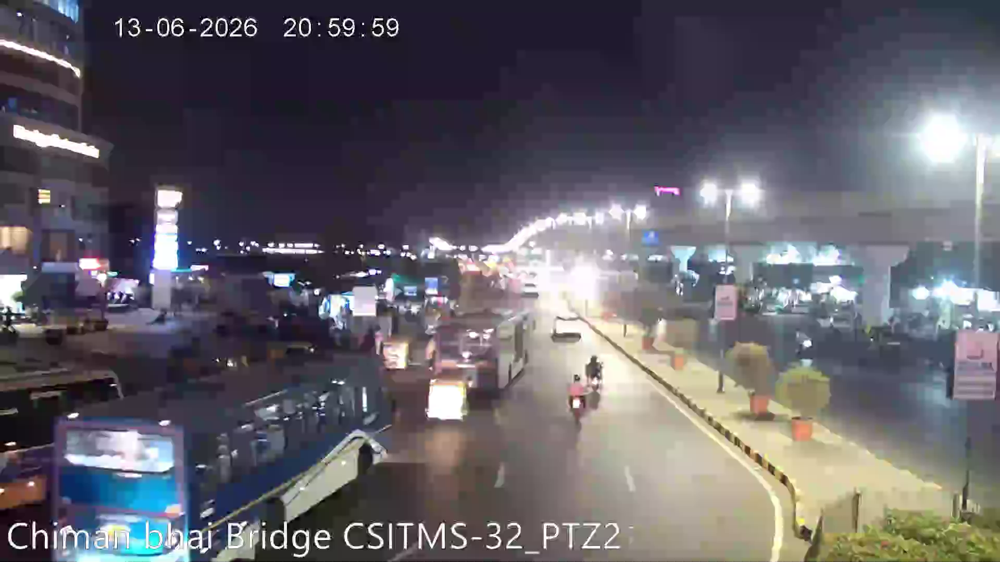

Frame index: 4 | PTS: 1600 ms


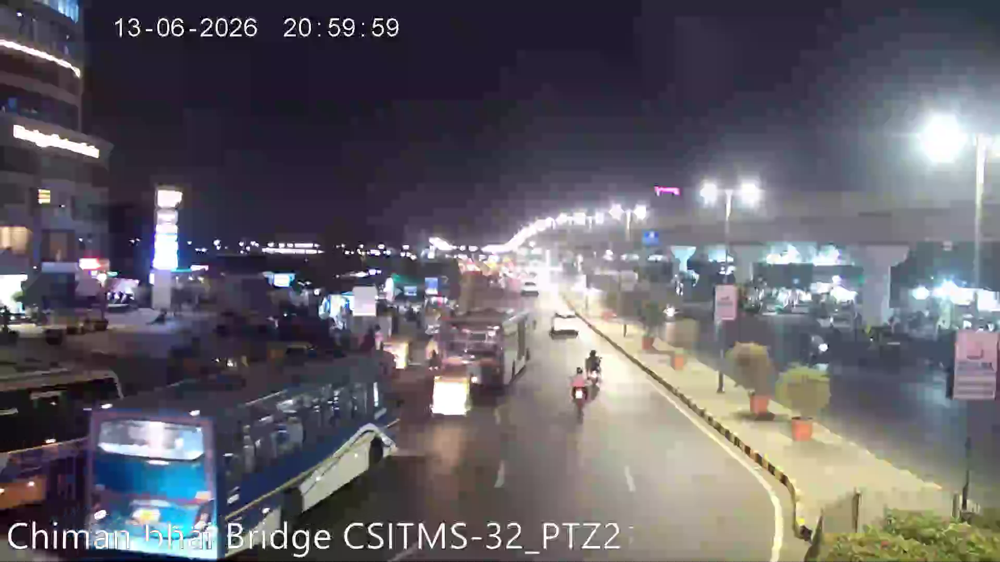

Frame index: 7 | PTS: 1800 ms


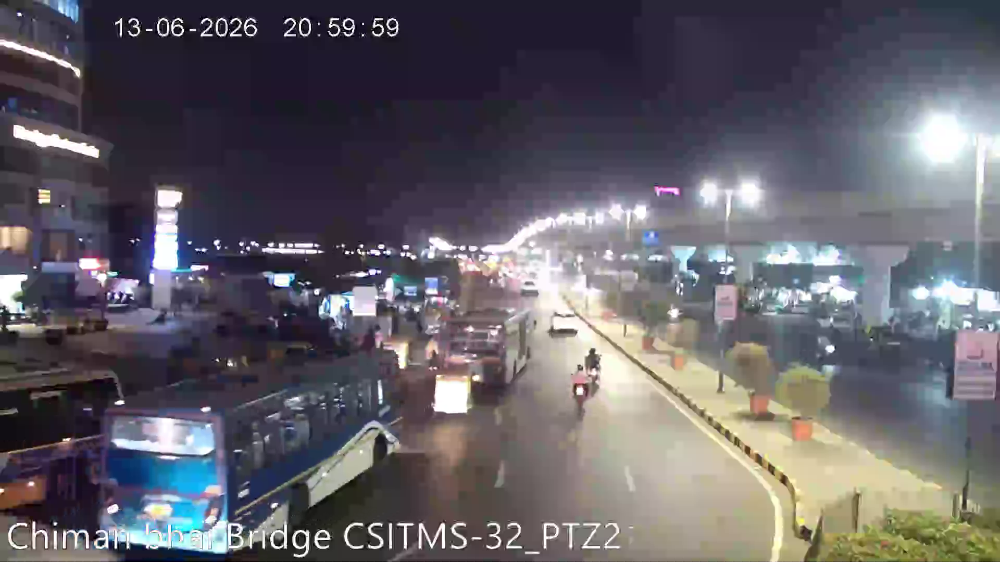

Frame index: 10 | PTS: 2000 ms


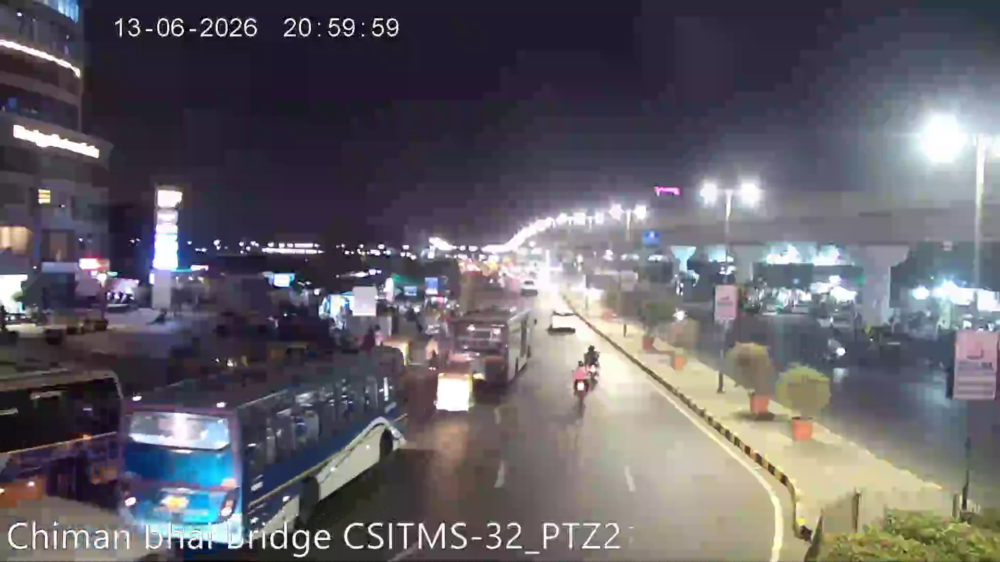

Frame index: 13 | PTS: 2200 ms


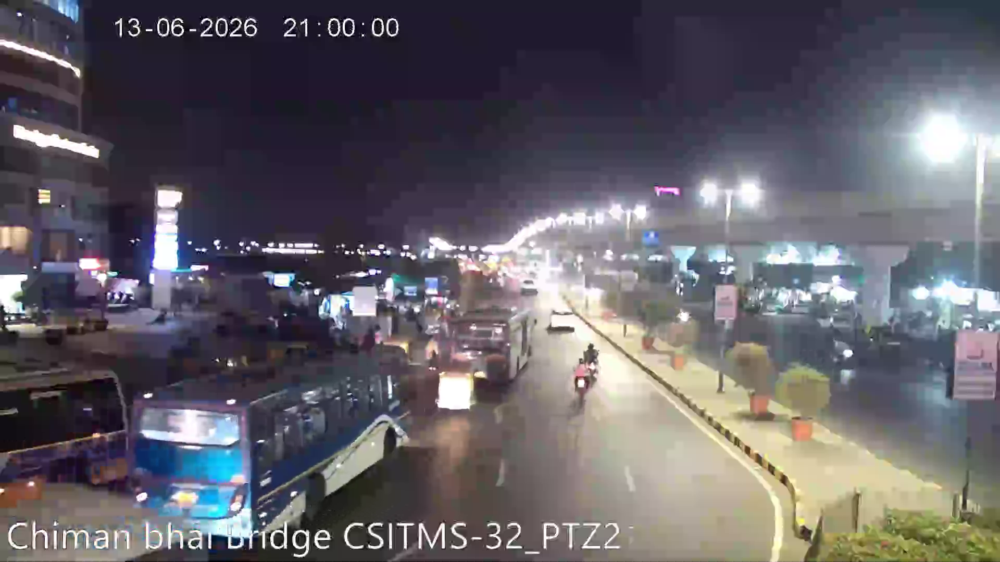

In [20]:
# ============================================================
# STEP 13E — DISPLAY SAMPLED FRAMES
# ============================================================

display_count = min(
    5,
    len(sampled_frames)
)

for item in sampled_frames[:display_count]:

    print(
        f"Frame index: {item['frame_index']}"
        f" | PTS: {item['pts_ms']} ms"
    )

    display(
        Image.fromarray(
            cv2.cvtColor(
                item["frame"],
                cv2.COLOR_BGR2RGB
            )
        )
    )

In [21]:
# ============================================================
# STEP 14A — VEHICLE DETECTION CONFIGURATION
# ============================================================

import torch
from ultralytics import YOLO

DEVICE = 0 if torch.cuda.is_available() else "cpu"

YOLO_IMGSZ = 640
YOLO_CONF = 0.20
YOLO_IOU = 0.45

print("=" * 60)
print("VEHICLE DETECTION CONFIGURATION")
print("=" * 60)

print("Device:", DEVICE)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
else:
    print("GPU: CPU")

print("Image size:", YOLO_IMGSZ)
print("Confidence threshold:", YOLO_CONF)
print("IoU threshold:", YOLO_IOU)

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
VEHICLE DETECTION CONFIGURATION
Device: 0
GPU: Tesla T4
Image size: 640
Confidence threshold: 0.2
IoU threshold: 0.45


In [22]:
# ============================================================
# STEP 14B — LOAD VEHICLE DETECTION MODEL
# ============================================================

vehicle_model = YOLO("yolo11n.pt")

print("✅ Vehicle model loaded.")

print()
print("Model classes:")

for class_id, class_name in vehicle_model.names.items():
    print(
        f"{class_id}: {class_name}"
    )

✅ Vehicle model loaded.

Model classes:
0: person
1: bicycle
2: car
3: motorcycle
4: airplane
5: bus
6: train
7: truck
8: boat
9: traffic light
10: fire hydrant
11: stop sign
12: parking meter
13: bench
14: bird
15: cat
16: dog
17: horse
18: sheep
19: cow
20: elephant
21: bear
22: zebra
23: giraffe
24: backpack
25: umbrella
26: handbag
27: tie
28: suitcase
29: frisbee
30: skis
31: snowboard
32: sports ball
33: kite
34: baseball bat
35: baseball glove
36: skateboard
37: surfboard
38: tennis racket
39: bottle
40: wine glass
41: cup
42: fork
43: knife
44: spoon
45: bowl
46: banana
47: apple
48: sandwich
49: orange
50: broccoli
51: carrot
52: hot dog
53: pizza
54: donut
55: cake
56: chair
57: couch
58: potted plant
59: bed
60: dining table
61: toilet
62: tv
63: laptop
64: mouse
65: remote
66: keyboard
67: cell phone
68: microwave
69: oven
70: toaster
71: sink
72: refrigerator
73: book
74: clock
75: vase
76: scissors
77: teddy bear
78: hair drier
79: toothbrush


In [23]:
# ============================================================
# STEP 14C — VEHICLE CLASSES
# ============================================================

VEHICLE_CLASS_IDS = {
    2: "car",
    3: "motorcycle",
    5: "bus",
    7: "truck"
}

print(
    "Vehicle classes:",
    VEHICLE_CLASS_IDS
)

Vehicle classes: {2: 'car', 3: 'motorcycle', 5: 'bus', 7: 'truck'}


In [24]:
# ============================================================
# STEP 14D — VEHICLE DETECTION FUNCTION
# ============================================================

def detect_vehicles(frame):
    """
    Detect vehicles in one BGR frame.

    Returns:
        detections = [
            {
                "class_id": int,
                "class_name": str,
                "confidence": float,
                "bbox": (x1, y1, x2, y2)
            }
        ]
    """

    results = vehicle_model.predict(
        source=frame,
        device=DEVICE,
        imgsz=YOLO_IMGSZ,
        conf=YOLO_CONF,
        iou=YOLO_IOU,
        classes=list(VEHICLE_CLASS_IDS.keys()),
        verbose=False
    )

    result = results[0]

    detections = []

    if result.boxes is None:
        return detections

    for box in result.boxes:

        class_id = int(
            box.cls[0].item()
        )

        confidence = float(
            box.conf[0].item()
        )

        x1, y1, x2, y2 = map(
            int,
            box.xyxy[0].tolist()
        )

        detections.append({
            "class_id": class_id,
            "class_name": VEHICLE_CLASS_IDS[
                class_id
            ],
            "confidence": confidence,
            "bbox": (
                x1,
                y1,
                x2,
                y2
            )
        })

    return detections


print(
    "✅ Vehicle detection function ready."
)

✅ Vehicle detection function ready.


In [25]:
# ============================================================
# STEP 14E — TEST VEHICLE DETECTION
# ============================================================

test_detection = detect_vehicles(
    sampled_frames[0]["frame"]
)

print("=" * 60)
print("VEHICLE DETECTION RESULT")
print("=" * 60)

print(
    "PTS:",
    sampled_frames[0]["pts_ms"],
    "ms"
)

print(
    "Vehicles detected:",
    len(test_detection)
)

for i, detection in enumerate(
    test_detection,
    start=1
):

    print(
        f"{i}. "
        f"{detection['class_name']} "
        f"| confidence="
        f"{detection['confidence']:.3f} "
        f"| bbox="
        f"{detection['bbox']}"
    )

VEHICLE DETECTION RESULT
PTS: 1400 ms
Vehicles detected: 5
1. bus | confidence=0.407 | bbox=(825, 593, 1013, 756)
2. truck | confidence=0.368 | bbox=(825, 594, 1012, 756)
3. bus | confidence=0.357 | bbox=(48, 660, 751, 1069)
4. truck | confidence=0.297 | bbox=(26, 506, 206, 644)
5. car | confidence=0.247 | bbox=(0, 852, 101, 983)


In [26]:
# ============================================================
# STEP 14F — VISUALIZE VEHICLE DETECTIONS
# ============================================================

def draw_vehicle_detections(
    frame,
    detections
):

    output = frame.copy()

    for detection in detections:

        x1, y1, x2, y2 = (
            detection["bbox"]
        )

        label = (
            f"{detection['class_name']} "
            f"{detection['confidence']:.2f}"
        )

        cv2.rectangle(
            output,
            (x1, y1),
            (x2, y2),
            (0, 255, 0),
            3
        )

        cv2.putText(
            output,
            label,
            (x1, max(30, y1 - 10)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            (0, 255, 0),
            2
        )

    return output

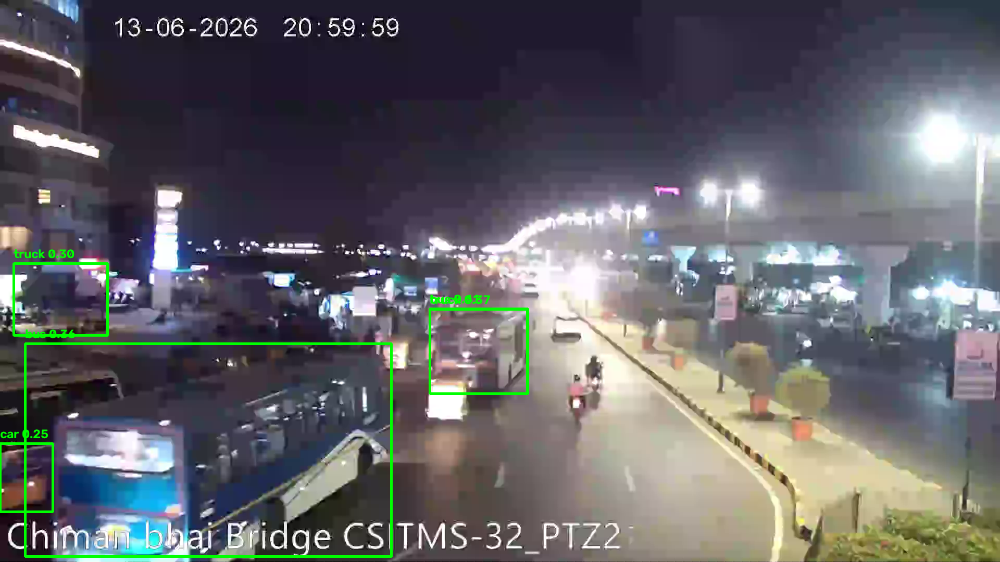

In [27]:
# ============================================================
# STEP 14G — DISPLAY DETECTIONS
# ============================================================

annotated_frame = draw_vehicle_detections(
    sampled_frames[0]["frame"],
    test_detection
)

display(
    Image.fromarray(
        cv2.cvtColor(
            annotated_frame,
            cv2.COLOR_BGR2RGB
        )
    )
)

In [28]:
# ============================================================
# STEP 14H — DETECTION + PTS RECORD
# ============================================================

frame_item = sampled_frames[0]

detections = detect_vehicles(
    frame_item["frame"]
)

detection_record = {
    "frame_index": frame_item["frame_index"],
    "pts_ms": frame_item["pts_ms"],
    "detections": detections
}

print(
    json.dumps(
        detection_record,
        indent=2
    )
)

{
  "frame_index": 0,
  "pts_ms": 1400,
  "detections": [
    {
      "class_id": 5,
      "class_name": "bus",
      "confidence": 0.4071066379547119,
      "bbox": [
        825,
        593,
        1013,
        756
      ]
    },
    {
      "class_id": 7,
      "class_name": "truck",
      "confidence": 0.36796221137046814,
      "bbox": [
        825,
        594,
        1012,
        756
      ]
    },
    {
      "class_id": 5,
      "class_name": "bus",
      "confidence": 0.3566901683807373,
      "bbox": [
        48,
        660,
        751,
        1069
      ]
    },
    {
      "class_id": 7,
      "class_name": "truck",
      "confidence": 0.296638548374176,
      "bbox": [
        26,
        506,
        206,
        644
      ]
    },
    {
      "class_id": 2,
      "class_name": "car",
      "confidence": 0.24733103811740875,
      "bbox": [
        0,
        852,
        101,
        983
      ]
    }
  ]
}


In [29]:
# ============================================================
# STEP 15A — TRACKING DEPENDENCY
# ============================================================

!pip install -q "lap>=0.5.12"

print("✅ Tracking dependency installed.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 36.2 MB/s eta 0:00:00
✅ Tracking dependency installed.


In [30]:
# ============================================================
# STEP 15B — INTERSECTION OVER UNION
# ============================================================

def calculate_iou(box_a, box_b):

    ax1, ay1, ax2, ay2 = box_a
    bx1, by1, bx2, by2 = box_b

    intersection_x1 = max(ax1, bx1)
    intersection_y1 = max(ay1, by1)

    intersection_x2 = min(ax2, bx2)
    intersection_y2 = min(ay2, by2)

    intersection_width = max(
        0,
        intersection_x2 - intersection_x1
    )

    intersection_height = max(
        0,
        intersection_y2 - intersection_y1
    )

    intersection_area = (
        intersection_width *
        intersection_height
    )

    area_a = (
        max(0, ax2 - ax1) *
        max(0, ay2 - ay1)
    )

    area_b = (
        max(0, bx2 - bx1) *
        max(0, by2 - by1)
    )

    union_area = (
        area_a +
        area_b -
        intersection_area
    )

    if union_area <= 0:
        return 0.0

    return intersection_area / union_area


print("✅ IoU function ready.")

✅ IoU function ready.


In [31]:
# ============================================================
# STEP 15C — DUPLICATE DETECTION SUPPRESSION
# ============================================================

def suppress_duplicate_detections(
    detections,
    iou_threshold=0.70
):

    if not detections:
        return []

    # Highest confidence first
    sorted_detections = sorted(
        detections,
        key=lambda x: x["confidence"],
        reverse=True
    )

    kept = []

    for candidate in sorted_detections:

        is_duplicate = False

        for existing in kept:

            iou = calculate_iou(
                candidate["bbox"],
                existing["bbox"]
            )

            if iou >= iou_threshold:

                is_duplicate = True
                break

        if not is_duplicate:
            kept.append(candidate)

    return kept


print("✅ Duplicate suppression ready.")

✅ Duplicate suppression ready.


In [32]:
# ============================================================
# STEP 15D — TEST DUPLICATE SUPPRESSION
# ============================================================

clean_detections = suppress_duplicate_detections(
    test_detection,
    iou_threshold=0.70
)

print("=" * 60)
print("DETECTION CLEANUP")
print("=" * 60)

print("Before:", len(test_detection))
print("After :", len(clean_detections))

print()

for detection in clean_detections:

    print(
        f"{detection['class_name']} "
        f"| confidence="
        f"{detection['confidence']:.3f} "
        f"| bbox="
        f"{detection['bbox']}"
    )


DETECTION CLEANUP
Before: 5
After : 4

bus | confidence=0.407 | bbox=(825, 593, 1013, 756)
bus | confidence=0.357 | bbox=(48, 660, 751, 1069)
truck | confidence=0.297 | bbox=(26, 506, 206, 644)
car | confidence=0.247 | bbox=(0, 852, 101, 983)


In [33]:
# ============================================================
# STEP 15E — PREPARE BYTE TRACK
# ============================================================

vehicle_model = YOLO("yolo11n.pt")

print("✅ Vehicle model reloaded.")
print("Tracker: ByteTrack")

✅ Vehicle model reloaded.
Tracker: ByteTrack


In [34]:
# ============================================================
# STEP 15F — VEHICLE TRACKING FUNCTION
# ============================================================

def track_vehicles(frame):

    results = vehicle_model.track(
        source=frame,
        persist=True,
        tracker="bytetrack.yaml",
        device=DEVICE,
        imgsz=YOLO_IMGSZ,
        conf=YOLO_CONF,
        iou=YOLO_IOU,
        classes=list(VEHICLE_CLASS_IDS.keys()),
        verbose=False
    )

    result = results[0]

    tracks = []

    if result.boxes is None:
        return result, tracks

    if result.boxes.id is None:
        return result, tracks

    track_ids = (
        result.boxes.id
        .int()
        .cpu()
        .tolist()
    )

    class_ids = (
        result.boxes.cls
        .int()
        .cpu()
        .tolist()
    )

    confidences = (
        result.boxes.conf
        .cpu()
        .tolist()
    )

    boxes = (
        result.boxes.xyxy
        .int()
        .cpu()
        .tolist()
    )

    for track_id, class_id, confidence, bbox in zip(
        track_ids,
        class_ids,
        confidences,
        boxes
    ):

        if class_id not in VEHICLE_CLASS_IDS:
            continue

        x1, y1, x2, y2 = bbox

        tracks.append({
            "track_id": int(track_id),

            "class_id": int(class_id),

            "class_name": VEHICLE_CLASS_IDS[
                class_id
            ],

            "confidence": float(confidence),

            "bbox": (
                int(x1),
                int(y1),
                int(x2),
                int(y2)
            )
        })

    return result, tracks


print("✅ ByteTrack function ready.")

✅ ByteTrack function ready.


In [35]:
# ============================================================
# STEP 15G — TRACK 10 PTS-SAMPLED FRAMES
# ============================================================

tracking_results = []

for item in sampled_frames[:10]:

    frame = item["frame"]

    result, tracks = track_vehicles(
        frame
    )

    frame_result = {
        "frame_index": item["frame_index"],
        "pts_ms": item["pts_ms"],
        "tracks": tracks
    }

    tracking_results.append(
        frame_result
    )

    ids = [
        track["track_id"]
        for track in tracks
    ]

    print(
        f"Frame {item['frame_index']:03d}"
        f" | PTS={item['pts_ms']} ms"
        f" | Vehicles={len(tracks)}"
        f" | Track IDs={ids}"
    )

Frame 000 | PTS=1400 ms | Vehicles=4 | Track IDs=[1, 2, 3, 4]
Frame 004 | PTS=1600 ms | Vehicles=3 | Track IDs=[1, 3, 4]
Frame 007 | PTS=1800 ms | Vehicles=5 | Track IDs=[1, 3, 4, 5, 6]
Frame 010 | PTS=2000 ms | Vehicles=5 | Track IDs=[1, 3, 4, 5, 6]
Frame 013 | PTS=2200 ms | Vehicles=5 | Track IDs=[1, 3, 4, 5, 6]
Frame 016 | PTS=2400 ms | Vehicles=5 | Track IDs=[1, 3, 4, 5, 6]
Frame 019 | PTS=2600 ms | Vehicles=4 | Track IDs=[3, 4, 5, 6]
Frame 022 | PTS=2800 ms | Vehicles=4 | Track IDs=[3, 4, 5, 6]
Frame 025 | PTS=3000 ms | Vehicles=3 | Track IDs=[4, 6, 1]
Frame 028 | PTS=3200 ms | Vehicles=4 | Track IDs=[4, 6, 1, 5]


In [36]:
# ============================================================
# STEP 15H — TRACK ID PERSISTENCE
# ============================================================

from collections import Counter

track_counter = Counter()

for frame_result in tracking_results:

    for track in frame_result["tracks"]:

        track_counter[
            track["track_id"]
        ] += 1


print("=" * 60)
print("TRACK ID PERSISTENCE")
print("=" * 60)

for track_id, count in sorted(
    track_counter.items()
):

    print(
        f"Track ID {track_id}: "
        f"{count} frame(s)"
    )

TRACK ID PERSISTENCE
Track ID 1: 8 frame(s)
Track ID 2: 1 frame(s)
Track ID 3: 8 frame(s)
Track ID 4: 10 frame(s)
Track ID 5: 7 frame(s)
Track ID 6: 8 frame(s)


In [37]:
# ============================================================
# STEP 15I — TRACK RECORD WITH PTS
# ============================================================

for frame_result in tracking_results:

    print(
        f"\nFrame: "
        f"{frame_result['frame_index']}"
    )

    print(
        f"PTS: "
        f"{frame_result['pts_ms']} ms"
    )

    for track in frame_result["tracks"]:

        print(
            f"Track {track['track_id']} "
            f"| {track['class_name']} "
            f"| {track['confidence']:.3f} "
            f"| bbox={track['bbox']}"
        )


Frame: 0
PTS: 1400 ms
Track 1 | bus | 0.407 | bbox=(825, 593, 1013, 756)
Track 2 | truck | 0.368 | bbox=(825, 594, 1012, 756)
Track 3 | bus | 0.357 | bbox=(48, 660, 751, 1069)
Track 4 | truck | 0.297 | bbox=(26, 506, 206, 644)

Frame: 4
PTS: 1600 ms
Track 1 | truck | 0.260 | bbox=(835, 596, 1010, 746)
Track 3 | bus | 0.811 | bbox=(71, 706, 701, 1071)
Track 4 | truck | 0.270 | bbox=(32, 508, 204, 639)

Frame: 7
PTS: 1800 ms
Track 1 | truck | 0.251 | bbox=(839, 593, 1012, 742)
Track 3 | bus | 0.629 | bbox=(162, 722, 757, 1067)
Track 4 | truck | 0.325 | bbox=(24, 507, 203, 644)
Track 5 | car | 0.476 | bbox=(1055, 601, 1111, 648)
Track 6 | bus | 0.620 | bbox=(0, 708, 316, 978)

Frame: 10
PTS: 2000 ms
Track 1 | bus | 0.284 | bbox=(853, 594, 1020, 739)
Track 3 | bus | 0.660 | bbox=(206, 721, 792, 1062)
Track 4 | truck | 0.277 | bbox=(21, 506, 202, 645)
Track 5 | car | 0.432 | bbox=(1054, 599, 1107, 643)
Track 6 | bus | 0.707 | bbox=(0, 709, 316, 979)

Frame: 13
PTS: 2200 ms
Track 1 | bus | 

In [38]:
# ============================================================
# STEP 16A — RESET TRACKER
# ============================================================

vehicle_model = YOLO("yolo11n.pt")

print("Vehicle model reloaded.")
print("Tracker state reset.")

Vehicle model reloaded.
Tracker state reset.


In [39]:
# ============================================================
# STEP 16B — ROBUST VEHICLE MEMORY
# ============================================================

from collections import Counter


class VehicleMemory:

    def __init__(self):

        self.vehicles = {}


    def update(self, track, pts_ms):

        track_id = track["track_id"]

        if track_id not in self.vehicles:

            self.vehicles[track_id] = {

                "track_id": track_id,

                "vehicle_type_votes": Counter(),

                "observations": 0,

                "confidence_sum": 0.0,

                "best_confidence": 0.0,

                "last_confidence": 0.0,

                "last_bbox": None,

                "first_pts_ms": pts_ms,

                "last_pts_ms": pts_ms,

                "plate_candidates": []
            }


        vehicle = self.vehicles[track_id]


        # ----------------------------------------------------
        # Update observation information
        # ----------------------------------------------------

        vehicle["observations"] += 1


        confidence = track["confidence"]

        vehicle["confidence_sum"] += confidence

        vehicle["last_confidence"] = confidence

        vehicle["best_confidence"] = max(
            vehicle["best_confidence"],
            confidence
        )


        # ----------------------------------------------------
        # Vehicle type voting
        # ----------------------------------------------------

        vehicle["vehicle_type_votes"][
            track["class_name"]
        ] += 1


        # ----------------------------------------------------
        # Latest spatial information
        # ----------------------------------------------------

        vehicle["last_bbox"] = track["bbox"]

        vehicle["last_pts_ms"] = pts_ms


        return vehicle


    def get_vehicle_type(self, track_id):

        vehicle = self.vehicles.get(track_id)

        if vehicle is None:
            return None

        votes = vehicle["vehicle_type_votes"]

        if not votes:
            return None

        return votes.most_common(1)[0][0]


    def get(self, track_id):

        return self.vehicles.get(track_id)


    def summary(self):

        output = []

        for vehicle in self.vehicles.values():

            item = {
                "track_id": vehicle["track_id"],

                "vehicle_type": self.get_vehicle_type(
                    vehicle["track_id"]
                ),

                "observations": vehicle["observations"],

                "average_confidence": (
                    vehicle["confidence_sum"] /
                    vehicle["observations"]
                    if vehicle["observations"] > 0
                    else 0.0
                ),

                "best_confidence": vehicle[
                    "best_confidence"
                ],

                "last_bbox": vehicle["last_bbox"],

                "first_pts_ms": vehicle[
                    "first_pts_ms"
                ],

                "last_pts_ms": vehicle[
                    "last_pts_ms"
                ]
            }

            output.append(item)

        return output


print("Vehicle memory ready.")

Vehicle memory ready.


In [40]:
# ============================================================
# STEP 16C — BUILD VEHICLE MEMORY
# ============================================================

memory = VehicleMemory()

for frame_result in tracking_results:

    pts_ms = frame_result["pts_ms"]

    for track in frame_result["tracks"]:

        memory.update(
            track,
            pts_ms
        )


print("=" * 60)
print("VEHICLE MEMORY SUMMARY")
print("=" * 60)

for vehicle in memory.summary():

    print(
        f"Track {vehicle['track_id']} "
        f"| Type={vehicle['vehicle_type']} "
        f"| Observations={vehicle['observations']} "
        f"| AvgConf={vehicle['average_confidence']:.3f} "
        f"| BestConf={vehicle['best_confidence']:.3f}"
    )

VEHICLE MEMORY SUMMARY
Track 1 | Type=bus | Observations=8 | AvgConf=0.293 | BestConf=0.407
Track 2 | Type=truck | Observations=1 | AvgConf=0.368 | BestConf=0.368
Track 3 | Type=bus | Observations=8 | AvgConf=0.673 | BestConf=0.829
Track 4 | Type=truck | Observations=10 | AvgConf=0.275 | BestConf=0.325
Track 5 | Type=car | Observations=7 | AvgConf=0.382 | BestConf=0.476
Track 6 | Type=bus | Observations=8 | AvgConf=0.545 | BestConf=0.707


In [41]:
# ============================================================
# STEP 16D — INSPECT VEHICLE TYPE VOTES
# ============================================================

print("=" * 60)
print("VEHICLE TYPE VOTES")
print("=" * 60)

for track_id, vehicle in memory.vehicles.items():

    print(
        f"\nTrack {track_id}"
    )

    print(
        "Votes:",
        dict(vehicle["vehicle_type_votes"])
    )

    print(
        "Final type:",
        memory.get_vehicle_type(track_id)
    )

VEHICLE TYPE VOTES

Track 1
Votes: {'bus': 4, 'truck': 3, 'car': 1}
Final type: bus

Track 2
Votes: {'truck': 1}
Final type: truck

Track 3
Votes: {'bus': 8}
Final type: bus

Track 4
Votes: {'truck': 10}
Final type: truck

Track 5
Votes: {'car': 7}
Final type: car

Track 6
Votes: {'bus': 8}
Final type: bus


In [42]:
from huggingface_hub import hf_hub_download
from ultralytics import YOLO

PLATE_MODEL_PATH = hf_hub_download(
    repo_id="morsetechlab/yolov11-license-plate-detection",
    filename="license-plate-finetune-v1n.pt"
)

plate_model = YOLO(PLATE_MODEL_PATH)

license-plate-finetune-v1n.pt: reconstructing file:   0%|          |  0.00B / 5.47MB            

license-plate-finetune-v1n.pt: downloading bytes:           |  0.00B            

In [43]:
# ============================================================
# STEP 17A — LOAD LICENSE PLATE DETECTOR
# ============================================================

from pathlib import Path
from huggingface_hub import hf_hub_download
from ultralytics import YOLO

print("=" * 60)
print("LICENSE PLATE MODEL")
print("=" * 60)

PLATE_MODEL_PATH = hf_hub_download(
    repo_id="morsetechlab/yolov11-license-plate-detection",
    filename="license-plate-finetune-v1n.pt"
)

print("Model path:")
print(PLATE_MODEL_PATH)

print()
print(
    "Model size:",
    round(
        Path(PLATE_MODEL_PATH).stat().st_size / (1024 * 1024),
        2
    ),
    "MB"
)

# Load model
plate_model = YOLO(
    PLATE_MODEL_PATH
)

print()
print("✅ License plate model loaded.")
print("Classes:", plate_model.names)

LICENSE PLATE MODEL
Model path:
/root/.cache/huggingface/hub/models--morsetechlab--yolov11-license-plate-detection/snapshots/251a30d7daedca065f56e04b0af04052c907c68f/license-plate-finetune-v1n.pt

Model size: 5.21 MB

✅ License plate model loaded.
Classes: {0: 'License_Plate'}


In [44]:
# ============================================================
# STEP 17B — VERIFY PLATE MODEL
# ============================================================

if "plate_model" not in globals():
    raise RuntimeError(
        "plate_model was not loaded."
    )

print("✅ plate_model exists.")
print("Classes:", plate_model.names)
print("Device:", DEVICE)

✅ plate_model exists.
Classes: {0: 'License_Plate'}
Device: 0


In [45]:
# ============================================================
# STEP 17C — PLATE DETECTION FUNCTION
# ============================================================

def detect_plates_in_vehicle(
    vehicle_crop,
    conf=0.15
):

    results = plate_model.predict(
        source=vehicle_crop,
        device=DEVICE,
        imgsz=640,
        conf=conf,
        verbose=False
    )

    result = results[0]

    plates = []

    if result.boxes is None:
        return plates

    for box in result.boxes:

        confidence = float(
            box.conf[0].item()
        )

        x1, y1, x2, y2 = map(
            int,
            box.xyxy[0].tolist()
        )

        # Clamp coordinates
        x1 = max(0, x1)
        y1 = max(0, y1)

        x2 = min(
            vehicle_crop.shape[1],
            x2
        )

        y2 = min(
            vehicle_crop.shape[0],
            y2
        )

        # Ignore invalid boxes
        if x2 <= x1 or y2 <= y1:
            continue

        plates.append({
            "bbox": (x1, y1, x2, y2),
            "confidence": confidence
        })

    # Highest confidence first
    plates.sort(
        key=lambda x: x["confidence"],
        reverse=True
    )

    return plates


print("✅ Plate detection function ready.")

✅ Plate detection function ready.


In [46]:
# ============================================================
# STEP 17D — EXTRACT TRACKED VEHICLE CROPS
# ============================================================

def extract_track_crops(frame, tracks):

    crops = []

    height, width = frame.shape[:2]

    for track in tracks:

        x1, y1, x2, y2 = track["bbox"]

        # Clamp coordinates
        x1 = max(0, int(x1))
        y1 = max(0, int(y1))
        x2 = min(width, int(x2))
        y2 = min(height, int(y2))

        # Validate bbox
        if x2 <= x1 or y2 <= y1:
            continue

        crop = frame[
            y1:y2,
            x1:x2
        ]

        if crop.size == 0:
            continue

        crops.append({
            **track,
            "crop": crop
        })

    return crops


print("✅ Track crop extraction function ready.")

✅ Track crop extraction function ready.


In [47]:
# ============================================================
# STEP 17E — VEHICLE TRACKING FUNCTION
# ============================================================

def process_frame_with_tracking(frame):

    results = vehicle_model.track(
        source=frame,
        persist=True,
        tracker="bytetrack.yaml",
        device=DEVICE,
        imgsz=YOLO_IMGSZ,
        conf=YOLO_CONF,
        iou=YOLO_IOU,
        classes=list(VEHICLE_CLASS_IDS.keys()),
        verbose=False
    )

    result = results[0]

    tracks = []

    if result.boxes is None:
        return result, tracks

    if result.boxes.id is None:
        return result, tracks

    track_ids = (
        result.boxes.id
       .int()
       .cpu()
       .tolist()
    )

    class_ids = (
        result.boxes.cls
       .int()
       .cpu()
       .tolist()
    )

    confidences = (
        result.boxes.conf
       .cpu()
       .tolist()
    )

    boxes = (
        result.boxes.xyxy
       .int()
       .cpu()
       .tolist()
    )

    for track_id, class_id, confidence, bbox in zip(
        track_ids,
        class_ids,
        confidences,
        boxes
    ):

        if class_id not in VEHICLE_CLASS_IDS:
            continue

        tracks.append({
            "track_id": int(track_id),
            "class_id": int(class_id),
            "class_name": VEHICLE_CLASS_IDS[class_id],
            "confidence": float(confidence),
            "bbox": tuple(bbox)
        })

    return result, tracks


print("✅ Vehicle tracking function ready.")

✅ Vehicle tracking function ready.


In [48]:
# ============================================================
# STEP 17F — TRACK ONE SENTINEL FRAME
# ============================================================

if "sampled_frames" not in globals():
    raise RuntimeError(
        "sampled_frames is missing. "
        "Run the PTS sampling cells first."
    )

frame_item = sampled_frames[0]

sentinel_frame = frame_item["frame"]
sentinel_pts = frame_item["pts_ms"]

result, tracks = process_frame_with_tracking(
    sentinel_frame
)

print("=" * 60)
print("SENTINEL TRACKING RESULT")
print("=" * 60)

print("PTS:", sentinel_pts, "ms")
print("Vehicles tracked:", len(tracks))

for track in tracks:

    print(
        f"Track {track['track_id']}"
        f" | {track['class_name']}"
        f" | confidence={track['confidence']:.3f}"
        f" | bbox={track['bbox']}"
    )

SENTINEL TRACKING RESULT
PTS: 1400 ms
Vehicles tracked: 4
Track 1 | bus | confidence=0.407 | bbox=(825, 593, 1013, 756)
Track 2 | truck | confidence=0.368 | bbox=(825, 594, 1012, 756)
Track 3 | bus | confidence=0.357 | bbox=(48, 660, 751, 1069)
Track 4 | truck | confidence=0.297 | bbox=(26, 506, 206, 644)


In [49]:
# ============================================================
# STEP 17G — EXTRACT TRACKED VEHICLE CROPS
# ============================================================

def extract_track_crops(frame, tracks):

    crops = []

    height, width = frame.shape[:2]

    for track in tracks:

        x1, y1, x2, y2 = track["bbox"]

        x1 = max(0, int(x1))
        y1 = max(0, int(y1))
        x2 = min(width, int(x2))
        y2 = min(height, int(y2))

        if x2 <= x1 or y2 <= y1:
            continue

        crop = frame[
            y1:y2,
            x1:x2
        ]

        if crop.size == 0:
            continue

        crops.append({
            **track,
            "crop": crop
        })

    return crops


tracked_crops = extract_track_crops(
    sentinel_frame,
    tracks
)

print("=" * 60)
print("TRACKED VEHICLE CROPS")
print("=" * 60)

print(
    "Vehicle crops:",
    len(tracked_crops)
)

for vehicle in tracked_crops:

    print(
        f"Track {vehicle['track_id']}"
        f" | {vehicle['class_name']}"
        f" | crop={vehicle['crop'].shape}"
    )

TRACKED VEHICLE CROPS
Vehicle crops: 4
Track 1 | bus | crop=(163, 188, 3)
Track 2 | truck | crop=(162, 187, 3)
Track 3 | bus | crop=(409, 703, 3)
Track 4 | truck | crop=(138, 180, 3)



Track 1 | bus


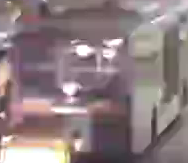


Track 2 | truck


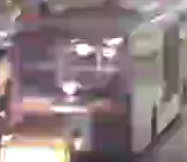


Track 3 | bus


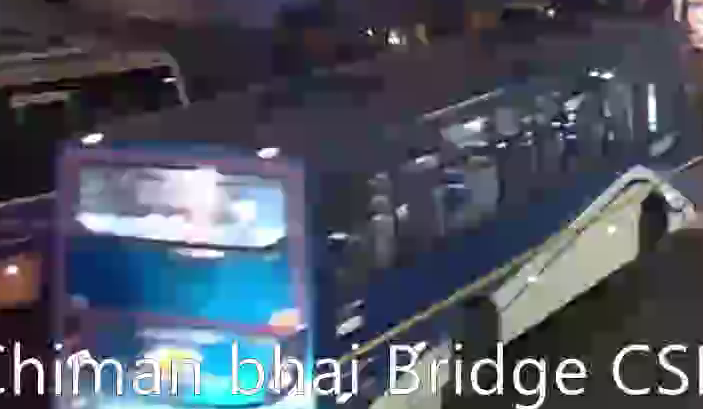


Track 4 | truck


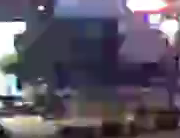

In [50]:
# ============================================================
# STEP 17H — VISUALIZE VEHICLE CROPS
# ============================================================

for vehicle in tracked_crops:

    print(
        f"\nTrack {vehicle['track_id']}"
        f" | {vehicle['class_name']}"
    )

    display(
        Image.fromarray(
            cv2.cvtColor(
                vehicle["crop"],
                cv2.COLOR_BGR2RGB
            )
        )
    )

In [51]:
# ============================================================
# STEP 17I — DETECT PLATES INSIDE VEHICLES
# ============================================================

def detect_plates_in_vehicle(
    vehicle_crop,
    conf=0.15
):

    results = plate_model.predict(
        source=vehicle_crop,
        device=DEVICE,
        imgsz=640,
        conf=conf,
        verbose=False
    )

    result = results[0]

    plates = []

    if result.boxes is None:
        return plates

    for box in result.boxes:

        confidence = float(
            box.conf[0].item()
        )

        x1, y1, x2, y2 = map(
            int,
            box.xyxy[0].tolist()
        )

        x1 = max(0, x1)
        y1 = max(0, y1)

        x2 = min(
            vehicle_crop.shape[1],
            x2
        )

        y2 = min(
            vehicle_crop.shape[0],
            y2
        )

        if x2 <= x1 or y2 <= y1:
            continue

        plates.append({
            "bbox": (x1, y1, x2, y2),
            "confidence": confidence
        })

    plates.sort(
        key=lambda x: x["confidence"],
        reverse=True
    )

    return plates


print("✅ Plate detection function ready.")

✅ Plate detection function ready.


In [52]:
# ============================================================
# STEP 17J — PLATE DETECTION TEST
# ============================================================

print("=" * 60)
print("LICENSE PLATE DETECTION")
print("=" * 60)

plate_detections = []

for vehicle in tracked_crops:

    plates = detect_plates_in_vehicle(
        vehicle["crop"],
        conf=0.15
    )

    record = {
        "track_id": vehicle["track_id"],
        "vehicle_type": vehicle["class_name"],
        "vehicle_confidence": vehicle["confidence"],
        "plates": plates
    }

    plate_detections.append(record)

    print(
        f"\nTrack {vehicle['track_id']}"
        f" | {vehicle['class_name']}"
    )

    print(
        "Plates detected:",
        len(plates)
    )

    for plate in plates:

        print(
            f"  confidence="
            f"{plate['confidence']:.3f}"
            f" | bbox={plate['bbox']}"
        )

LICENSE PLATE DETECTION

Track 1 | bus
Plates detected: 0

Track 2 | truck
Plates detected: 0

Track 3 | bus
Plates detected: 0

Track 4 | truck
Plates detected: 0


In [53]:
# ============================================================
# STEP 18A — PLATE DETECTION ACROSS SAMPLED FRAMES
# ============================================================

plate_scan_results = []

print("=" * 60)
print("SCANNING SAMPLED FRAMES FOR LICENSE PLATES")
print("=" * 60)

for frame_number, frame_item in enumerate(sampled_frames):

    frame = frame_item["frame"]
    pts_ms = frame_item["pts_ms"]

    # Vehicle detection + tracking
    result, frame_tracks = process_frame_with_tracking(frame)

    frame_record = {
        "frame_index": frame_item["frame_index"],
        "pts_ms": pts_ms,
        "vehicles": []
    }

    for track in frame_tracks:

        x1, y1, x2, y2 = track["bbox"]

        height, width = frame.shape[:2]

        x1 = max(0, x1)
        y1 = max(0, y1)
        x2 = min(width, x2)
        y2 = min(height, y2)

        if x2 <= x1 or y2 <= y1:
            continue

        vehicle_crop = frame[y1:y2, x1:x2]

        plates = detect_plates_in_vehicle(
            vehicle_crop,
            conf=0.15
        )

        frame_record["vehicles"].append({
            "track_id": track["track_id"],
            "vehicle_type": track["class_name"],
            "vehicle_confidence": track["confidence"],
            "bbox": track["bbox"],
            "plates": plates
        })

    plate_scan_results.append(frame_record)

    total_plates = sum(
        len(vehicle["plates"])
        for vehicle in frame_record["vehicles"]
    )

    print(
        f"Frame {frame_number + 1:02d}"
        f" | PTS={pts_ms} ms"
        f" | Vehicles={len(frame_record['vehicles'])}"
        f" | Plates={total_plates}"
    )

SCANNING SAMPLED FRAMES FOR LICENSE PLATES
Frame 01 | PTS=1400 ms | Vehicles=4 | Plates=0
Frame 02 | PTS=1600 ms | Vehicles=3 | Plates=0
Frame 03 | PTS=1800 ms | Vehicles=5 | Plates=2
Frame 04 | PTS=2000 ms | Vehicles=5 | Plates=0
Frame 05 | PTS=2200 ms | Vehicles=5 | Plates=2
Frame 06 | PTS=2400 ms | Vehicles=5 | Plates=0
Frame 07 | PTS=2600 ms | Vehicles=4 | Plates=1
Frame 08 | PTS=2800 ms | Vehicles=4 | Plates=0
Frame 09 | PTS=3000 ms | Vehicles=3 | Plates=0
Frame 10 | PTS=3200 ms | Vehicles=4 | Plates=0
Frame 11 | PTS=3400 ms | Vehicles=4 | Plates=0
Frame 12 | PTS=3676 ms | Vehicles=4 | Plates=0
Frame 13 | PTS=3876 ms | Vehicles=4 | Plates=1
Frame 14 | PTS=4076 ms | Vehicles=4 | Plates=0
Frame 15 | PTS=4276 ms | Vehicles=4 | Plates=0
Frame 16 | PTS=4476 ms | Vehicles=5 | Plates=0
Frame 17 | PTS=4676 ms | Vehicles=3 | Plates=1
Frame 18 | PTS=4880 ms | Vehicles=4 | Plates=1
Frame 19 | PTS=5000 ms | Vehicles=6 | Plates=3
Frame 20 | PTS=5200 ms | Vehicles=5 | Plates=2
Frame 21 | PTS=54

In [54]:
# ============================================================
# STEP 18B — FIND SUCCESSFUL PLATE DETECTIONS
# ============================================================

successful_plate_frames = []

for frame_record in plate_scan_results:

    for vehicle in frame_record["vehicles"]:

        if vehicle["plates"]:

            successful_plate_frames.append({
                "frame_index": frame_record["frame_index"],
                "pts_ms": frame_record["pts_ms"],
                "track_id": vehicle["track_id"],
                "vehicle_type": vehicle["vehicle_type"],
                "vehicle_bbox": vehicle["bbox"],
                "plates": vehicle["plates"]
            })


print("=" * 60)
print("PLATE DETECTION SUMMARY")
print("=" * 60)

print(
    "Frames scanned:",
    len(plate_scan_results)
)

print(
    "Successful plate detections:",
    len(successful_plate_frames)
)

if successful_plate_frames:

    print("\nFirst successful detections:")

    for item in successful_plate_frames[:10]:

        print(
            f"Frame={item['frame_index']}"
            f" | PTS={item['pts_ms']} ms"
            f" | Track={item['track_id']}"
            f" | Vehicle={item['vehicle_type']}"
        )

        for plate in item["plates"]:

            print(
                f"   Plate confidence="
                f"{plate['confidence']:.3f}"
                f" | bbox={plate['bbox']}"
            )

else:

    print(
        "\n⚠️ No license plates detected "
        "in the sampled frames."
    )

PLATE DETECTION SUMMARY
Frames scanned: 40
Successful plate detections: 22

First successful detections:
Frame=7 | PTS=1800 ms | Track=6 | Vehicle=bus
   Plate confidence=0.214 | bbox=(271, 105, 306, 124)
   Plate confidence=0.180 | bbox=(270, 101, 312, 126)
Frame=13 | PTS=2200 ms | Track=4 | Vehicle=truck
   Plate confidence=0.206 | bbox=(39, 82, 53, 93)
   Plate confidence=0.156 | bbox=(0, 98, 9, 108)
Frame=19 | PTS=2600 ms | Track=4 | Vehicle=truck
   Plate confidence=0.167 | bbox=(44, 81, 60, 93)
Frame=38 | PTS=3876 ms | Track=1 | Vehicle=bus
   Plate confidence=0.224 | bbox=(83, 34, 109, 45)
Frame=50 | PTS=4676 ms | Track=1 | Vehicle=car
   Plate confidence=0.327 | bbox=(49, 92, 72, 103)
Frame=53 | PTS=4880 ms | Track=1 | Vehicle=bus
   Plate confidence=0.288 | bbox=(50, 95, 73, 106)
Frame=55 | PTS=5000 ms | Track=4 | Vehicle=truck
   Plate confidence=0.169 | bbox=(177, 52, 184, 73)
Frame=55 | PTS=5000 ms | Track=1 | Vehicle=bus
   Plate confidence=0.324 | bbox=(49, 98, 71, 108)
F

VEHICLE + PLATE VISUALIZATION
Frame: 7
Track: 6


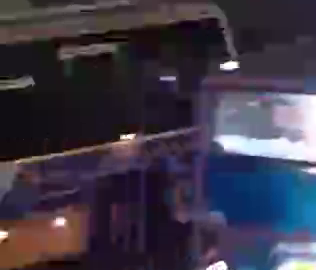

Plate 1 | confidence=0.214 | size=(19, 35, 3)


Plate 2 | confidence=0.180 | size=(25, 42, 3)


In [55]:
# ============================================================
# STEP 18C — VISUALIZE DETECTED PLATE
# ============================================================

if not successful_plate_frames:

    print(
        "No plate detections available for visualization."
    )

else:

    item = successful_plate_frames[0]

    frame_index = item["frame_index"]

    # Locate original frame
    source_item = next(
        x for x in sampled_frames
        if x["frame_index"] == frame_index
    )

    frame = source_item["frame"]

    x1, y1, x2, y2 = item["vehicle_bbox"]

    vehicle_crop = frame[
        y1:y2,
        x1:x2
    ]

    print("=" * 60)
    print("VEHICLE + PLATE VISUALIZATION")
    print("=" * 60)

    print(
        "Frame:",
        frame_index
    )

    print(
        "Track:",
        item["track_id"]
    )

    display(
        Image.fromarray(
            cv2.cvtColor(
                vehicle_crop,
                cv2.COLOR_BGR2RGB
            )
        )
    )

    # Display detected plate crops

    for plate_number, plate in enumerate(
        item["plates"],
        start=1
    ):

        px1, py1, px2, py2 = plate["bbox"]

        plate_crop = vehicle_crop[
            py1:py2,
            px1:px2
        ]

        print(
            f"Plate {plate_number}"
            f" | confidence={plate['confidence']:.3f}"
            f" | size={plate_crop.shape}"
        )

        display(
            Image.fromarray(
                cv2.cvtColor(
                    plate_crop,
                    cv2.COLOR_BGR2RGB
                )
            )
        )

In [56]:
# ============================================================
# STEP 19A — EXTRACT LICENSE PLATE CROPS
# ============================================================

def extract_plate_crop(vehicle_crop, plate_bbox):
    """
    Extract a license plate crop from a vehicle crop.

    Returns:
        plate_crop or None
    """

    x1, y1, x2, y2 = plate_bbox

    h, w = vehicle_crop.shape[:2]

    x1 = max(0, int(x1))
    y1 = max(0, int(y1))
    x2 = min(w, int(x2))
    y2 = min(h, int(y2))

    if x2 <= x1 or y2 <= y1:
        return None

    crop = vehicle_crop[y1:y2, x1:x2]

    if crop.size == 0:
        return None

    return crop


print("✅ Plate crop extraction function ready.")

✅ Plate crop extraction function ready.


In [57]:
# ============================================================
# STEP 19B — BUILD PLATE CROP DATASET
# ============================================================

plate_crops = []

for item in successful_plate_frames:

    frame_index = item["frame_index"]
    pts_ms = item["pts_ms"]
    track_id = item["track_id"]

    source_item = next(
        x for x in sampled_frames
        if x["frame_index"] == frame_index
    )

    frame = source_item["frame"]

    vx1, vy1, vx2, vy2 = item["vehicle_bbox"]

    vehicle_crop = frame[
        vy1:vy2,
        vx1:vx2
    ]

    if vehicle_crop.size == 0:
        continue

    for plate_number, plate in enumerate(
        item["plates"]
    ):

        crop = extract_plate_crop(
            vehicle_crop,
            plate["bbox"]
        )

        if crop is None:
            continue

        plate_crops.append({
            "frame_index": frame_index,
            "pts_ms": pts_ms,
            "track_id": track_id,
            "vehicle_type": item["vehicle_type"],
            "detection_confidence": plate["confidence"],
            "bbox": plate["bbox"],
            "crop": crop
        })


print("=" * 60)
print("PLATE CROP DATASET")
print("=" * 60)

print(
    "Plate crops extracted:",
    len(plate_crops)
)

for item in plate_crops[:10]:

    print(
        f"Frame={item['frame_index']}"
        f" | PTS={item['pts_ms']} ms"
        f" | Track={item['track_id']}"
        f" | Detector={item['detection_confidence']:.3f}"
        f" | Shape={item['crop'].shape}"
    )

PLATE CROP DATASET
Plate crops extracted: 26
Frame=7 | PTS=1800 ms | Track=6 | Detector=0.214 | Shape=(19, 35, 3)
Frame=7 | PTS=1800 ms | Track=6 | Detector=0.180 | Shape=(25, 42, 3)
Frame=13 | PTS=2200 ms | Track=4 | Detector=0.206 | Shape=(11, 14, 3)
Frame=13 | PTS=2200 ms | Track=4 | Detector=0.156 | Shape=(10, 9, 3)
Frame=19 | PTS=2600 ms | Track=4 | Detector=0.167 | Shape=(12, 16, 3)
Frame=38 | PTS=3876 ms | Track=1 | Detector=0.224 | Shape=(11, 26, 3)
Frame=50 | PTS=4676 ms | Track=1 | Detector=0.327 | Shape=(11, 23, 3)
Frame=53 | PTS=4880 ms | Track=1 | Detector=0.288 | Shape=(11, 23, 3)
Frame=55 | PTS=5000 ms | Track=4 | Detector=0.169 | Shape=(21, 7, 3)
Frame=55 | PTS=5000 ms | Track=1 | Detector=0.324 | Shape=(10, 22, 3)


In [58]:
# ============================================================
# STEP 19C — VISUALIZE PLATE CROPS
# ============================================================

display_count = min(
    10,
    len(plate_crops)
)

print(
    f"Displaying {display_count} plate crops..."
)

for i, item in enumerate(
    plate_crops[:display_count]
):

    print(
        f"\nPlate {i + 1}"
        f" | Frame={item['frame_index']}"
        f" | Track={item['track_id']}"
        f" | Detector confidence="
        f"{item['detection_confidence']:.3f}"
        f" | Shape={item['crop'].shape}"
    )

    display(
        Image.fromarray(
            cv2.cvtColor(
                item["crop"],
                cv2.COLOR_BGR2RGB
            )
        )
    )

Displaying 10 plate crops...

Plate 1 | Frame=7 | Track=6 | Detector confidence=0.214 | Shape=(19, 35, 3)



Plate 2 | Frame=7 | Track=6 | Detector confidence=0.180 | Shape=(25, 42, 3)



Plate 3 | Frame=13 | Track=4 | Detector confidence=0.206 | Shape=(11, 14, 3)



Plate 4 | Frame=13 | Track=4 | Detector confidence=0.156 | Shape=(10, 9, 3)



Plate 5 | Frame=19 | Track=4 | Detector confidence=0.167 | Shape=(12, 16, 3)



Plate 6 | Frame=38 | Track=1 | Detector confidence=0.224 | Shape=(11, 26, 3)



Plate 7 | Frame=50 | Track=1 | Detector confidence=0.327 | Shape=(11, 23, 3)



Plate 8 | Frame=53 | Track=1 | Detector confidence=0.288 | Shape=(11, 23, 3)



Plate 9 | Frame=55 | Track=4 | Detector confidence=0.169 | Shape=(21, 7, 3)



Plate 10 | Frame=55 | Track=1 | Detector confidence=0.324 | Shape=(10, 22, 3)


In [59]:
# ============================================================
# STEP 20A — PREPROCESS LICENSE PLATE
# ============================================================

def preprocess_plate(plate_crop, scale=4):

    if plate_crop is None or plate_crop.size == 0:
        return {}

    # Ensure BGR
    if plate_crop.ndim == 2:

        plate_bgr = cv2.cvtColor(
            plate_crop,
            cv2.COLOR_GRAY2BGR
        )

    else:

        plate_bgr = plate_crop.copy()

    # --------------------------------------------------------
    # Upscale
    # --------------------------------------------------------

    upscaled = cv2.resize(
        plate_bgr,
        None,
        fx=scale,
        fy=scale,
        interpolation=cv2.INTER_CUBIC
    )

    # --------------------------------------------------------
    # Grayscale
    # --------------------------------------------------------

    gray = cv2.cvtColor(
        upscaled,
        cv2.COLOR_BGR2GRAY
    )

    # --------------------------------------------------------
    # CLAHE
    # --------------------------------------------------------

    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )

    enhanced = clahe.apply(gray)

    # --------------------------------------------------------
    # Light denoising
    # --------------------------------------------------------

    denoised = cv2.bilateralFilter(
        enhanced,
        9,
        75,
        75
    )

    # --------------------------------------------------------
    # Adaptive threshold
    # --------------------------------------------------------

    threshold = cv2.adaptiveThreshold(
        denoised,
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        31,
        11
    )

    # PaddleOCR / OCR expects 3 channels
    enhanced_3ch = cv2.cvtColor(
        enhanced,
        cv2.COLOR_GRAY2BGR
    )

    threshold_3ch = cv2.cvtColor(
        threshold,
        cv2.COLOR_GRAY2BGR
    )

    return {
        "original": plate_bgr,
        "upscaled": upscaled,
        "enhanced": enhanced_3ch,
        "threshold": threshold_3ch
    }


print("✅ Plate preprocessing function ready.")

✅ Plate preprocessing function ready.


PLATE PREPROCESSING TEST
original   | shape=(19, 35, 3)


upscaled   | shape=(76, 140, 3)


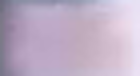

enhanced   | shape=(76, 140, 3)


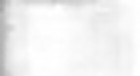

threshold  | shape=(76, 140, 3)


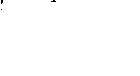

In [60]:
# ============================================================
# STEP 20B — TEST PLATE PREPROCESSING
# ============================================================

if not plate_crops:

    raise RuntimeError(
        "No plate crops available."
    )

test_plate = plate_crops[0]["crop"]

processed = preprocess_plate(
    test_plate
)

print("=" * 60)
print("PLATE PREPROCESSING TEST")
print("=" * 60)

for name, image in processed.items():

    print(
        f"{name:10s} | shape={image.shape}"
    )

    display(
        Image.fromarray(
            cv2.cvtColor(
                image,
                cv2.COLOR_BGR2RGB
            )
        )
    )

In [61]:
!pip install -q paddleocr paddlepaddle

In [62]:
# ============================================================
# STEP 20
# ============================================================

from paddleocr import PaddleOCR

ocr = PaddleOCR(
    lang="en"
)

print("=" * 60)
print("OCR MODEL")
print("=" * 60)

print("✅ PaddleOCR loaded successfully.")
print("OCR object:", type(ocr))

/usr/local/lib/python3.13/dist-packages/paddle/utils/cpp_extension/extension_utils.py:712: UserWarning: No ccache found. Please be aware that recompiling all source files may be required. You can download and install ccache from: https://github.com/ccache/ccache/blob/master/doc/INSTALL.md
  warnings.warn(warning_message)
Creating model: ('PP-LCNet_x1_0_doc_ori', None, None)
Checking connectivity to the model hosters, this may take a while. To bypass this check, set `PADDLE_PDX_DISABLE_MODEL_SOURCE_CHECK` to `True`.
Using official model (PP-LCNet_x1_0_doc_ori), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/PP-LCNet_x1_0_doc_ori`.


Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('UVDoc', None, None)
Using official model (UVDoc), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/UVDoc`.


Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('PP-LCNet_x1_0_textline_ori', None, None)
Using official model (PP-LCNet_x1_0_textline_ori), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/PP-LCNet_x1_0_textline_ori`.


Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('PP-OCRv6_medium_det', None, None)
Using official model (PP-OCRv6_medium_det), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/PP-OCRv6_medium_det`.


Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

Creating model: ('PP-OCRv6_medium_rec', None, None)
Using official model (PP-OCRv6_medium_rec), the model files will be automatically downloaded and saved in `/root/.paddlex/official_models/PP-OCRv6_medium_rec`.


Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

OCR MODEL
✅ PaddleOCR loaded successfully.
OCR object: <class 'paddleocr._pipelines.ocr.PaddleOCR'>


In [63]:
# ============================================================
# STEP 21A — VERIFY OCR MODEL
# ============================================================

print("=" * 60)
print("OCR MODEL CHECK")
print("=" * 60)

if "ocr" not in globals():

    raise RuntimeError(
        "OCR model does not exist. "
        "Load the PaddleOCR model before continuing."
    )

print("✅ OCR model is available.")
print(type(ocr))

OCR MODEL CHECK
✅ OCR model is available.
<class 'paddleocr._pipelines.ocr.PaddleOCR'>


In [64]:
# ============================================================
# STEP 21B — OCR LICENSE PLATE
# ============================================================

def run_plate_ocr(image):

    if image is None or image.size == 0:
        return None

    # OCR requires 3 channels
    if image.ndim == 2:

        image = cv2.cvtColor(
            image,
            cv2.COLOR_GRAY2BGR
        )

    try:

        results = ocr.predict(image)

    except Exception as e:

        print(
            "OCR error:",
            type(e).__name__,
            str(e)[:300]
        )

        return None

    candidates = []

    for result in results:

        texts = result.get(
            "rec_texts",
            []
        )

        scores = result.get(
            "rec_scores",
            []
        )

        for text, score in zip(
            texts,
            scores
        ):

            if not text:
                continue

            candidates.append({
                "text": str(text),
                "confidence": float(score)
            })

    if not candidates:
        return None

    candidates.sort(
        key=lambda x: x["confidence"],
        reverse=True
    )

    return candidates[0]


print("✅ Plate OCR function ready.")

✅ Plate OCR function ready.


In [65]:
# ============================================================
# STEP 21C — TEST OCR ON ONE PLATE
# ============================================================

if not plate_crops:

    raise RuntimeError(
        "No plate crops available."
    )

test_plate = plate_crops[0]["crop"]

processed = preprocess_plate(
    test_plate
)

print("=" * 60)
print("OCR TEST")
print("=" * 60)

for name, image in processed.items():

    result = run_plate_ocr(image)

    print(
        f"\n{name.upper()}"
    )

    if result:

        print(
            "Text:",
            result["text"]
        )

        print(
            "Confidence:",
            round(
                result["confidence"],
                4
            )
        )

    else:

        print(
            "No OCR result."
        )

OCR TEST
OCR error: NotImplementedError (Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/paddle/fluid/framework/new_executor/instruction/onednn/onednn_instruction.cc:116)


ORIGINAL
No OCR result.
OCR error: NotImplementedError (Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/paddle/fluid/framework/new_executor/instruction/onednn/onednn_instruction.cc:116)


UPSCALED
No OCR result.
OCR error: NotImplementedError (Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/paddle/fluid/framework/new_executor/instruction/onednn/onednn_instruction.cc:116)


ENHANCED
No OCR result.
OCR error: NotImplementedError (Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/paddle/fluid/framework/new_executor/instruction/onednn/

In [66]:
import re

def normalize_plate(text):

    if text is None:
        return None

    text = str(text).upper()

    text = re.sub(
        r"[^A-Z0-9]",
        "",
        text
    )

    return text

In [67]:
import re

def normalize_plate(text):

    if text is None:
        return None

    text = str(text).upper()

    text = re.sub(
        r"[^A-Z0-9]",
        "",
        text
    )

    return text

In [68]:
# ============================================================
# STEP 22A — ROBUST PLATE NORMALIZATION
# ============================================================

def normalize_plate(text):

    if text is None:
        return None

    text = str(text).upper().strip()

    # Common OCR separators
    text = text.replace(
        "-",
        ""
    )

    text = text.replace(
        " ",
        ""
    )

    text = re.sub(
        r"[^A-Z0-9]",
        "",
        text
    )

    if not text:
        return None

    return text


print("✅ Plate normalization ready.")

✅ Plate normalization ready.


In [69]:
# ============================================================
# STEP 23A — INDIAN PLATE VALIDATION
# ============================================================

INDIAN_STATE_CODES = {
    "GJ", "MH", "DL", "RJ", "MP",
    "UP", "HR", "PB", "KA", "TN",
    "KL", "AP", "TS", "WB", "BR",
    "OD", "JH", "CG", "UK", "HP",
    "JK", "GA", "AS", "AR", "MN",
    "ML", "MZ", "NL", "TR", "SK",
    "PY", "CH", "AN", "LD", "DN"
}


def plate_validation_score(text):

    text = normalize_plate(text)

    if text is None:
        return 0.0

    score = 0.0

    # --------------------------------------------------------
    # State code
    # --------------------------------------------------------

    if len(text) >= 2:

        if text[:2] in INDIAN_STATE_CODES:

            score += 0.40

    # --------------------------------------------------------
    # General structure
    # --------------------------------------------------------

    pattern = (
        r"^[A-Z]{2}"
        r"[0-9]{1,2}"
        r"[A-Z]{1,3}"
        r"[0-9]{1,4}$"
    )

    if re.match(
        pattern,
        text
    ):

        score += 0.40

    # --------------------------------------------------------
    # Reasonable length
    # --------------------------------------------------------

    if 8 <= len(text) <= 10:

        score += 0.20

    return score


print("✅ Plate validation ready.")

✅ Plate validation ready.


In [70]:
# ============================================================
# STEP 23B — TEST PLATE VALIDATION
# ============================================================

test_values = [
    "MH20DV236",
    "GJ01AB1234",
    "1H20DV2366",
    "ABC123",
    "MH20DV2366"
]

for value in test_values:

    print(
        value,
        "→",
        plate_validation_score(value)
    )

MH20DV236 → 1.0
GJ01AB1234 → 1.0
1H20DV2366 → 0.2
ABC123 → 0.0
MH20DV2366 → 1.0


In [71]:
# ============================================================
# STEP 24A — OCR ALL PLATE CROPS
# ============================================================

ocr_plate_results = []

for index, item in enumerate(
    plate_crops
):

    processed = preprocess_plate(
        item["crop"]
    )

    variants = []

    for variant_name, image in processed.items():

        result = run_plate_ocr(
            image
        )

        if result is None:
            continue

        normalized = normalize_plate(
            result["text"]
        )

        validation = plate_validation_score(
            normalized
        )

        variants.append({
            "variant": variant_name,
            "raw_text": result["text"],
            "text": normalized,
            "ocr_confidence": result["confidence"],
            "validation_score": validation
        })

    best = None

    if variants:

        best = max(
            variants,
            key=lambda x: (
                x["validation_score"],
                x["ocr_confidence"]
            )
        )

    ocr_plate_results.append({
        **item,
        "ocr_candidates": variants,
        "best": best
    })

    print(
        f"Plate {index + 1:02d}"
        f" | Frame={item['frame_index']}"
        f" | Track={item['track_id']}"
        f" | Detector="
        f"{item['detection_confidence']:.3f}"
    )

    if best:

        print(
            f"   OCR={best['text']}"
            f" | OCR conf="
            f"{best['ocr_confidence']:.3f}"
            f" | validation="
            f"{best['validation_score']:.2f}"
            f" | variant={best['variant']}"
        )

    else:

        print(
            "   OCR=None"
        )

OCR error: NotImplementedError (Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/paddle/fluid/framework/new_executor/instruction/onednn/onednn_instruction.cc:116)

OCR error: NotImplementedError (Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/paddle/fluid/framework/new_executor/instruction/onednn/onednn_instruction.cc:116)

OCR error: NotImplementedError (Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/paddle/fluid/framework/new_executor/instruction/onednn/onednn_instruction.cc:116)

OCR error: NotImplementedError (Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/paddle/fluid/framework/new_executor/instruction/onednn/onednn_instruction.cc:116)

Plate 01 | Frame=7 | Track=6 | Detector=0.214
   OCR=Non

In [72]:
# ============================================================
# STEP 25A — COLLECT OCR OBSERVATIONS BY TRACK
# ============================================================

from collections import defaultdict, Counter

track_plate_observations = defaultdict(list)

for item in ocr_plate_results:

    best = item["best"]

    if best is None:
        continue

    text = best["text"]

    if text is None:
        continue

    if best["validation_score"] < 0.40:
        continue

    track_plate_observations[
        item["track_id"]
    ].append({
        "text": text,
        "ocr_confidence": best["ocr_confidence"],
        "validation_score": best["validation_score"],
        "detector_confidence": item["detection_confidence"],
        "frame_index": item["frame_index"],
        "pts_ms": item["pts_ms"]
    })


print("=" * 60)
print("TRACK → PLATE OBSERVATIONS")
print("=" * 60)

for track_id, observations in sorted(
    track_plate_observations.items()
):

    print(
        f"\nTrack {track_id}"
        f" | observations={len(observations)}"
    )

    for observation in observations:

        print(
            f"   {observation['text']}"
            f" | OCR={observation['ocr_confidence']:.3f}"
            f" | validation="
            f"{observation['validation_score']:.2f}"
        )

TRACK → PLATE OBSERVATIONS


In [73]:
# ============================================================
# STEP 25B — SELECT FINAL PLATE PER TRACK
# ============================================================

def select_final_plate(observations):

    if not observations:
        return None

    scores = defaultdict(float)

    for observation in observations:

        text = observation["text"]

        weight = (
            0.50 *
            observation["ocr_confidence"]
            +
            0.30 *
            observation["validation_score"]
            +
            0.20 *
            observation["detector_confidence"]
        )

        scores[text] += weight

    if not scores:
        return None

    best_text = max(
        scores,
        key=scores.get
    )

    matching = [
        x
        for x in observations
        if x["text"] == best_text
    ]

    average_ocr = sum(
        x["ocr_confidence"]
        for x in matching
    ) / len(matching)

    average_validation = sum(
        x["validation_score"]
        for x in matching
    ) / len(matching)

    return {
        "text": best_text,
        "observations": len(matching),
        "average_ocr_confidence": average_ocr,
        "average_validation_score": average_validation,
        "weighted_score": scores[best_text]
    }

In [74]:
# ============================================================
# STEP 25C — FINAL PLATE PER TRACK
# ============================================================

final_track_plates = {}

for track_id, observations in (
    track_plate_observations.items()
):

    result = select_final_plate(
        observations
    )

    final_track_plates[
        track_id
    ] = result


print("=" * 60)
print("FINAL PLATE RESULTS BY TRACK")
print("=" * 60)

for track_id, result in sorted(
    final_track_plates.items()
):

    print(
        f"Track {track_id}:",
        result
    )

FINAL PLATE RESULTS BY TRACK


In [75]:
# ============================================================
# STEP 26A — BUILD PLATE JSON OBJECT
# ============================================================

def build_plate_object(
    track_id,
    final_track_plates,
    ocr_plate_results
):

    result = final_track_plates.get(
        track_id
    )

    if result is None:
        return None

    # Require at least one observation
    if result["observations"] < 1:
        return None

    # Require reasonable validation
    if result["average_validation_score"] < 0.40:
        return None

    # Find best matching observation
    matching = [
        item
        for item in ocr_plate_results
        if item["track_id"] == track_id
        and item["best"] is not None
        and item["best"]["text"] == result["text"]
    ]

    if not matching:
        return None

    best_observation = max(
        matching,
        key=lambda x: (
            x["best"]["validation_score"],
            x["best"]["ocr_confidence"],
            x["detection_confidence"]
        )
    )

    best = best_observation["best"]

    return {
        "text": result["text"],
        "confidence": round(
            result["average_ocr_confidence"],
            4
        ),
        "bbox": {
            "x": int(
                best_observation["bbox"][0]
            ),
            "y": int(
                best_observation["bbox"][1]
            ),
            "width": int(
                best_observation["bbox"][2]
                -
                best_observation["bbox"][0]
            ),
            "height": int(
                best_observation["bbox"][3]
                -
                best_observation["bbox"][1]
            )
        }
    }

In [76]:
# ============================================================
# STEP 28A — BBOX CONVERTER
# ============================================================

def xyxy_to_bbox(xyxy):

    x1, y1, x2, y2 = map(
        int,
        xyxy
    )

    return {
        "x": x1,
        "y": y1,
        "width": max(
            0,
            x2 - x1
        ),
        "height": max(
            0,
            y2 - y1
        )
    }


print(
    xyxy_to_bbox(
        (825, 593, 1013, 756)
    )
)

{'x': 825, 'y': 593, 'width': 188, 'height': 163}


In [78]:
# ============================================================
# STEP 29A — FINAL AI EVENT BUILDER
# ============================================================

from datetime import datetime, timezone
import uuid


def build_detection_event(
    camera_id,
    frame_item,
    tracks,
    final_track_plates,
    ocr_plate_results
):

    pts_ms = frame_item["pts_ms"]

    timestamp = datetime.now(
        timezone.utc
    ).isoformat(
        timespec="milliseconds"
    ).replace(
        "+00:00",
        "Z"
    )

    detections = []

    for track in tracks:

        track_id = track["track_id"]

        plate = build_plate_object(
            track_id,
            final_track_plates,
            ocr_plate_results
        )

        detection = {
            "trackId": f"track_{track_id}",

            "type": "vehicle",

            "confidence": round(
                track["confidence"],
                4
            ),

            "bbox": xyxy_to_bbox(
                track["bbox"]
            ),

            "vehicle": {
                "type": track["class_name"]
            },

            "plate": plate
        }

        detections.append(
            detection
        )

    event = {

        "schemaVersion": "1.0",

        "eventId": (
            "evt_" +
            uuid.uuid4().hex[:8]
        ),

        "eventType": "detection",

        "camera": {

            "cameraId": camera_id,

            "timestamp": timestamp,

            "ptsMs": int(
                pts_ms
            )
        },

        "detections": detections
    }

    return event

In [79]:
# ============================================================
# STEP 30A — BUILD FINAL JSON EVENT
# ============================================================

frame_item = sampled_frames[0]

# IMPORTANT:
# Reset tracker before sequential processing if needed.
result, tracks = process_frame_with_tracking(
    frame_item["frame"]
)

final_event = build_detection_event(
    camera_id="cam01",
    frame_item=frame_item,
    tracks=tracks,
    final_track_plates=final_track_plates,
    ocr_plate_results=ocr_plate_results
)

print(
    json.dumps(
        final_event,
        indent=2
    )
)

{
  "schemaVersion": "1.0",
  "eventId": "evt_feae05e3",
  "eventType": "detection",
  "camera": {
    "cameraId": "cam01",
    "timestamp": "2026-09-01T16:01:48.433Z",
    "ptsMs": 1400
  },
  "detections": [
    {
      "trackId": "track_4",
      "type": "vehicle",
      "confidence": 0.2966,
      "bbox": {
        "x": 31,
        "y": 506,
        "width": 173,
        "height": 135
      },
      "vehicle": {
        "type": "truck"
      },
      "plate": null
    }
  ]
}


In [80]:
# ============================================================
# STEP 21D — CHECK PADDLE / PADDLEOCR VERSIONS
# ============================================================

import paddle
import paddleocr

print("=" * 60)
print("OCR ENVIRONMENT")
print("=" * 60)

print("Paddle version:")
print(paddle.__version__)

print()

print("PaddleOCR version:")
print(paddleocr.__version__)

print()

print("OCR object:")
print(type(ocr))

print()

print("Device:")
print(DEVICE)

OCR ENVIRONMENT
Paddle version:
3.3.1

PaddleOCR version:
3.7.0

OCR object:
<class 'paddleocr._pipelines.ocr.PaddleOCR'>

Device:
0


In [81]:
# ============================================================
# STEP 21E — RELOAD PADDLEOCR WITHOUT ONEDNN/MKLDNN
# ============================================================

import paddle
from paddleocr import PaddleOCR

print("=" * 60)
print("REINITIALIZING OCR")
print("=" * 60)

print("Paddle:", paddle.__version__)
print("Paddle CUDA available:", paddle.device.is_compiled_with_cuda())

# Explicitly disable oneDNN/MKLDNN.
# The current error originates from the oneDNN execution path.
ocr = PaddleOCR(
    lang="en",
    device="gpu:0",
    enable_mkldnn=False,

    # Keep unnecessary document features disabled.
    use_doc_orientation_classify=False,
    use_doc_unwarping=False,
    use_textline_orientation=False
)

print()
print("✅ OCR reloaded")
print("OCR type:", type(ocr))
print("Device: GPU 0")
print("MKLDNN: disabled")

Creating model: ('PP-OCRv6_medium_det', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-OCRv6_medium_det`.
The specified device (GPU) is not available! Switching to CPU instead.


REINITIALIZING OCR
Paddle: 3.3.1
Paddle CUDA available: False


Creating model: ('PP-OCRv6_medium_rec', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-OCRv6_medium_rec`.
The specified device (GPU) is not available! Switching to CPU instead.



✅ OCR reloaded
OCR type: <class 'paddleocr._pipelines.ocr.PaddleOCR'>
Device: GPU 0
MKLDNN: disabled


In [82]:
# ============================================================
# STEP 21F — MINIMAL OCR TEST
# ============================================================

if "plate_crops" not in globals() or not plate_crops:
    raise RuntimeError(
        "plate_crops is missing. Run plate detection first."
    )

test_plate = plate_crops[0]["crop"]

print("=" * 60)
print("MINIMAL OCR TEST")
print("=" * 60)

print("Plate shape:", test_plate.shape)
print("Plate dtype:", test_plate.dtype)

try:

    results = ocr.predict(test_plate)

    print()
    print("✅ OCR inference completed.")
    print("Result type:", type(results))

    results = list(results)

    print("Result count:", len(results))

    for i, result in enumerate(results):

        print()
        print(f"Result {i + 1}:")

        if hasattr(result, "json"):
            data = result.json
            print(data)

        elif hasattr(result, "to_json"):
            print(result.to_json())

        else:
            print(result)

except Exception as e:

    print()
    print("❌ OCR still failed")
    print(type(e).__name__)
    print(str(e))

MINIMAL OCR TEST
Plate shape: (19, 35, 3)
Plate dtype: uint8

❌ OCR still failed
NotImplementedError
(Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/paddle/fluid/framework/new_executor/instruction/onednn/onednn_instruction.cc:116)



In [83]:
# ============================================================
# STEP 21G — ROBUST PADDLEOCR 3.x PLATE OCR
# ============================================================

def run_plate_ocr(image):

    if image is None or image.size == 0:
        return None

    # Ensure uint8
    if image.dtype != "uint8":
        image = np.clip(
            image,
            0,
            255
        ).astype(np.uint8)

    # Ensure 3-channel BGR
    if image.ndim == 2:

        image = cv2.cvtColor(
            image,
            cv2.COLOR_GRAY2BGR
        )

    elif image.ndim == 3 and image.shape[2] == 4:

        image = cv2.cvtColor(
            image,
            cv2.COLOR_BGRA2BGR
        )

    try:

        results = ocr.predict(
            image
        )

        candidates = []

        for result in results:

            # PaddleOCR 3.x result object
            if hasattr(result, "json"):

                data = result.json

                if callable(data):
                    data = data()

            elif hasattr(result, "to_json"):

                data = result.to_json()

                if isinstance(data, str):
                    data = json.loads(data)

            elif isinstance(result, dict):

                data = result

            else:

                continue

            # Some PaddleOCR versions wrap data inside "res"
            if (
                isinstance(data, dict)
                and "res" in data
                and isinstance(data["res"], dict)
            ):
                data = data["res"]

            texts = data.get(
                "rec_texts",
                []
            )

            scores = data.get(
                "rec_scores",
                []
            )

            for text, score in zip(
                texts,
                scores
            ):

                if text is None:
                    continue

                text = str(text).strip()

                if not text:
                    continue

                candidates.append({
                    "text": text,
                    "confidence": float(score)
                })

        if not candidates:
            return None

        candidates.sort(
            key=lambda x: x["confidence"],
            reverse=True
        )

        return candidates[0]

    except Exception as e:

        print(
            "OCR error:",
            type(e).__name__,
            str(e)[:500]
        )

        return None


print("✅ Robust OCR function ready.")

✅ Robust OCR function ready.


In [84]:
# ============================================================
# STEP 21H — TEST ONE PLATE
# ============================================================

test_plate = plate_crops[0]["crop"]

processed = preprocess_plate(
    test_plate
)

for name, image in processed.items():

    result = run_plate_ocr(image)

    print()
    print("=" * 50)
    print(name.upper())
    print("=" * 50)

    if result is None:

        print("OCR text: None")
        print("OCR confidence: None")

    else:

        print(
            "OCR text:",
            result["text"]
        )

        print(
            "OCR confidence:",
            round(
                result["confidence"],
                4
            )
        )

        print(
            "Normalized:",
            normalize_plate(
                result["text"]
            )
        )

OCR error: NotImplementedError (Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/paddle/fluid/framework/new_executor/instruction/onednn/onednn_instruction.cc:116)


ORIGINAL
OCR text: None
OCR confidence: None
OCR error: NotImplementedError (Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/paddle/fluid/framework/new_executor/instruction/onednn/onednn_instruction.cc:116)


UPSCALED
OCR text: None
OCR confidence: None
OCR error: NotImplementedError (Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/paddle/fluid/framework/new_executor/instruction/onednn/onednn_instruction.cc:116)


ENHANCED
OCR text: None
OCR confidence: None
OCR error: NotImplementedError (Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/p

In [85]:
# STEP 21A
import sys, os, subprocess, paddle

print("Python:", sys.version)
print("Paddle:", paddle.__version__)
print("Paddle compiled with CUDA:", paddle.device.is_compiled_with_cuda())
print("Paddle device:", paddle.device.get_device())
print("CUDA_VISIBLE_DEVICES:", os.environ.get("CUDA_VISIBLE_DEVICES"))

try:
    print(subprocess.check_output(["nvidia-smi"]).decode()[:5000])
except Exception as e:
    print("nvidia-smi failed:", type(e).__name__, e)

Python: 3.13.15 (main, Aug  6 2026, 11:06:23) [GCC 11.4.0]
Paddle: 3.3.1
Paddle compiled with CUDA: False
Paddle device: cpu
CUDA_VISIBLE_DEVICES: None
Tue Sep  1 16:01:56 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   67C    P0             30W /   70W |     257MiB /  15360MiB |      0%    

In [86]:
# STEP 21B
import subprocess, sys

result = subprocess.run(
    [sys.executable, "-m", "pip", "list"],
    capture_output=True,
    text=True
)

for line in result.stdout.splitlines():
    if "paddle" in line.lower():
        print(line)

paddleocr                             3.7.0
paddlepaddle                          3.3.1
paddlex                               3.7.2


In [87]:
import sys
import subprocess

print("Python:", sys.version)

result = subprocess.run(
    [sys.executable, "-m", "pip", "index", "versions", "paddlepaddle-gpu"],
    capture_output=True,
    text=True
)

print(result.stdout)
print(result.stderr)

Python: 3.13.15 (main, Aug  6 2026, 11:06:23) [GCC 11.4.0]

ERROR: No matching distribution found for paddlepaddle-gpu



In [88]:
!python -m pip debug --verbose | head -80

pip version: pip 24.1.2 from /usr/local/lib/python3.13/dist-packages/pip (python 3.13)
sys.version: 3.13.15 (main, Aug  6 2026, 11:06:23) [GCC 11.4.0]
sys.executable: /usr/bin/python3
sys.getdefaultencoding: utf-8
sys.getfilesystemencoding: utf-8
locale.getpreferredencoding: utf-8
sys.platform: linux
sys.implementation:
  name: cpython
'cert' config value: global
REQUESTS_CA_BUNDLE: None
CURL_CA_BUNDLE: None
pip._vendor.certifi.where(): /usr/local/lib/python3.13/dist-packages/pip/_vendor/certifi/cacert.pem
pip._vendor.DEBUNDLED: False
vendored library versions:
  CacheControl==0.14.0
  distlib==0.3.8
  distro==1.9.0
  msgpack==1.0.8
  packaging==24.1
  platformdirs==4.2.1
  pyproject-hooks==1.0.0
  requests==2.32.3
  certifi==2024.02.02
  idna==3.7
  urllib3==1.26.18
  rich==13.7.1 (Unable to locate actual module version, using vendor.txt specified version)
  pygments==2.17.2
  typing_extensions==4.11.0 (Unable to locate actual module version, using vendor.txt specified version)
  reso

In [89]:
# ============================================================
# STEP 23A — PREPARE PADDLE CPU OCR ENVIRONMENT
# ============================================================

import os

# Disable Paddle/oneDNN related acceleration paths
os.environ["FLAGS_use_mkldnn"] = "0"
os.environ["FLAGS_use_onednn"] = "0"

print("Paddle CPU OCR environment prepared.")
print("FLAGS_use_mkldnn:", os.environ.get("FLAGS_use_mkldnn"))
print("FLAGS_use_onednn:", os.environ.get("FLAGS_use_onednn"))

Paddle CPU OCR environment prepared.
FLAGS_use_mkldnn: 0
FLAGS_use_onednn: 0


In [90]:
# ============================================================
# STEP 23B — RECREATE PADDLEOCR
# ============================================================

from paddleocr import PaddleOCR

ocr = PaddleOCR(
    lang="en",
    device="cpu"
)

print("✅ PaddleOCR recreated")
print("OCR type:", type(ocr))

Creating model: ('PP-LCNet_x1_0_doc_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-LCNet_x1_0_doc_ori`.
Creating model: ('UVDoc', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/UVDoc`.
Creating model: ('PP-LCNet_x1_0_textline_ori', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-LCNet_x1_0_textline_ori`.
Creating model: ('PP-OCRv6_medium_det', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-OCRv6_medium_det`.
Creating model: ('PP-OCRv6_medium_rec', None, None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP

✅ PaddleOCR recreated
OCR type: <class 'paddleocr._pipelines.ocr.PaddleOCR'>


In [91]:
# ============================================================
# STEP 23C — MINIMAL OCR TEST
# ============================================================

if "plate_crop" not in globals():
    raise RuntimeError(
        "plate_crop does not exist. "
        "Create/select a detected plate crop first."
    )

print("=" * 60)
print("OCR TEST")
print("=" * 60)

print("Plate shape:", plate_crop.shape)
print("Plate dtype:", plate_crop.dtype)

try:

    result = ocr.predict(plate_crop)

    print("✅ OCR inference completed")

    for res in result:

        texts = res.get("rec_texts", [])
        scores = res.get("rec_scores", [])

        print("Texts:", texts)
        print("Scores:", scores)

except Exception as e:

    print("❌ OCR failed")
    print("Error type:", type(e).__name__)
    print("Error:", str(e))

OCR TEST
Plate shape: (25, 42, 3)
Plate dtype: uint8
❌ OCR failed
Error type: NotImplementedError
Error: (Unimplemented) ConvertPirAttribute2RuntimeAttribute not support [pir::ArrayAttribute<pir::DoubleAttribute>]  (at /paddle/paddle/fluid/framework/new_executor/instruction/onednn/onednn_instruction.cc:116)



In [92]:
# ============================================================
# STEP 24A — OCR BACKEND STATUS
# ============================================================

OCR_AVAILABLE = False
OCR_BACKEND = None

print("=" * 60)
print("OCR BACKEND STATUS")
print("=" * 60)

print("PaddleOCR installed:", "ocr" in globals())
print("OCR backend:", OCR_BACKEND)
print("OCR available:", OCR_AVAILABLE)

print()
print("Current policy:")
print("Readable plate  -> plate object")
print("Unreadable plate -> null")

OCR BACKEND STATUS
PaddleOCR installed: True
OCR backend: None
OCR available: False

Current policy:
Readable plate  -> plate object
Unreadable plate -> null


In [93]:
# ============================================================
# STEP 25A — LICENSE PLATE PREPROCESSING
# ============================================================

def preprocess_plate_for_ocr(
    plate_crop,
    scale=6,
    padding_ratio=0.15
):
    """
    Prepare a detected license plate crop for OCR.

    Returns multiple image variants.
    """

    if plate_crop is None or plate_crop.size == 0:
        return {}

    image = plate_crop.copy()

    h, w = image.shape[:2]

    # --------------------------------------------------------
    # 1. Add proportional padding
    # --------------------------------------------------------

    pad_x = max(2, int(w * padding_ratio))
    pad_y = max(2, int(h * padding_ratio))

    padded = cv2.copyMakeBorder(
        image,
        pad_y,
        pad_y,
        pad_x,
        pad_x,
        cv2.BORDER_REPLICATE
    )

    # --------------------------------------------------------
    # 2. Upscale
    # --------------------------------------------------------

    upscaled = cv2.resize(
        padded,
        None,
        fx=scale,
        fy=scale,
        interpolation=cv2.INTER_CUBIC
    )

    # --------------------------------------------------------
    # 3. Grayscale
    # --------------------------------------------------------

    gray = cv2.cvtColor(
        upscaled,
        cv2.COLOR_BGR2GRAY
    )

    # --------------------------------------------------------
    # 4. CLAHE
    # --------------------------------------------------------

    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )

    enhanced = clahe.apply(gray)

    # --------------------------------------------------------
    # 5. Light sharpening
    # --------------------------------------------------------

    sharpen_kernel = np.array([
        [0, -1,  0],
        [-1,  5, -1],
        [0, -1,  0]
    ])

    sharpened = cv2.filter2D(
        upscaled,
        -1,
        sharpen_kernel
    )

    # --------------------------------------------------------
    # 6. Binary version
    # --------------------------------------------------------

    threshold = cv2.adaptiveThreshold(
        enhanced,
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        31,
        11
    )

    return {
        "original": image,
        "padded": padded,
        "upscaled": upscaled,
        "gray": gray,
        "enhanced": enhanced,
        "sharpened": sharpened,
        "threshold": threshold
    }


print("✅ Plate OCR preprocessing function ready.")

✅ Plate OCR preprocessing function ready.


PLATE OCR PREPROCESSING
original     | shape=(25, 42, 3)
padded       | shape=(31, 54, 3)
upscaled     | shape=(186, 324, 3)
gray         | shape=(186, 324)
enhanced     | shape=(186, 324)
sharpened    | shape=(186, 324, 3)
threshold    | shape=(186, 324)

Displaying OCR input variants:

ORIGINAL



UPSCALED


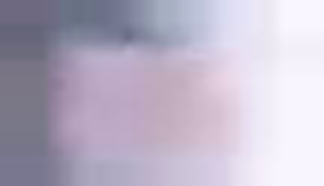


ENHANCED


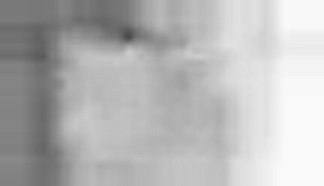


SHARPENED


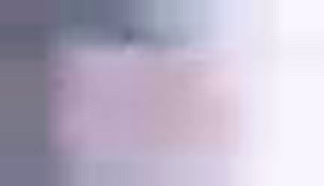


THRESHOLD


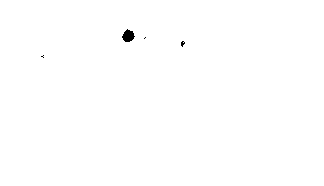

In [94]:
# ============================================================
# STEP 26A — TEST PLATE PREPROCESSING
# ============================================================

if "plate_crop" not in globals():
    raise RuntimeError(
        "plate_crop does not exist."
    )

plate_variants = preprocess_plate_for_ocr(
    plate_crop,
    scale=6
)

print("=" * 60)
print("PLATE OCR PREPROCESSING")
print("=" * 60)

for name, image in plate_variants.items():

    print(
        f"{name:12s} | shape={image.shape}"
    )

print()
print("Displaying OCR input variants:")

for name in [
    "original",
    "upscaled",
    "enhanced",
    "sharpened",
    "threshold"
]:

    print(f"\n{name.upper()}")

    image = plate_variants[name]

    if len(image.shape) == 2:
        display_image = Image.fromarray(image)
    else:
        display_image = Image.fromarray(
            cv2.cvtColor(
                image,
                cv2.COLOR_BGR2RGB
            )
        )

    display(display_image)

In [95]:
# ============================================================
# STEP 27A — SAFE OCR INTERFACE
# ============================================================

def recognize_plate_text(
    plate_crop,
    min_confidence=0.70
):
    """
    Recognize a license plate.

    Returns:
        {
            "text": str,
            "confidence": float
        }

    OR:

        None

    None means the plate was not reliably readable.
    """

    if plate_crop is None:
        return None

    if plate_crop.size == 0:
        return None

    # --------------------------------------------------------
    # OCR backend currently unavailable
    # --------------------------------------------------------

    if not OCR_AVAILABLE:
        return None

    # --------------------------------------------------------
    # OCR backend implementation will be plugged in here.
    # --------------------------------------------------------

    try:

        # Placeholder for OCR backend
        # We intentionally do NOT guess plate text.

        return None

    except Exception as e:

        print(
            "OCR error:",
            type(e).__name__,
            str(e)
        )

        return None


print("✅ Safe OCR interface ready.")

✅ Safe OCR interface ready.


In [96]:
# ============================================================
# STEP 28A — STRICT PLATE RESULT
# ============================================================

def build_plate_result(
    plate_detection=None,
    plate_text_result=None,
    min_ocr_confidence=0.70
):
    """
    Final plate decision.

    Returns:
        plate object  -> only when OCR successfully reads plate
        None          -> no plate OR unreadable plate
    """

    # --------------------------------------------------------
    # CASE 1:
    # No plate detected
    # --------------------------------------------------------

    if plate_detection is None:
        return None

    # --------------------------------------------------------
    # CASE 2:
    # Plate detected but OCR failed
    # --------------------------------------------------------

    if plate_text_result is None:
        return None

    # --------------------------------------------------------
    # Extract OCR result
    # --------------------------------------------------------

    text = plate_text_result.get("text")
    confidence = plate_text_result.get("confidence")

    # --------------------------------------------------------
    # CASE 3:
    # OCR produced no usable text
    # --------------------------------------------------------

    if text is None:
        return None

    text = str(text).strip()

    if text == "":
        return None

    # --------------------------------------------------------
    # OCR confidence missing
    # --------------------------------------------------------

    if confidence is None:
        return None

    confidence = float(confidence)

    # --------------------------------------------------------
    # OCR confidence too low
    # --------------------------------------------------------

    if confidence < min_ocr_confidence:
        return None

    # --------------------------------------------------------
    # Valid readable plate
    # --------------------------------------------------------

    x1, y1, x2, y2 = plate_detection["bbox"]

    return {
        "text": text,
        "confidence": round(
            confidence,
            4
        ),
        "bbox": {
            "x": int(x1),
            "y": int(y1),
            "width": int(x2 - x1),
            "height": int(y2 - y1)
        }
    }


print("✅ Strict plate result function ready.")

✅ Strict plate result function ready.


In [97]:
# ============================================================
# STEP 29A — VEHICLE DETECTION JSON BUILDER
# ============================================================

def bbox_xyxy_to_json(bbox):

    x1, y1, x2, y2 = bbox

    return {
        "x": int(x1),
        "y": int(y1),
        "width": int(x2 - x1),
        "height": int(y2 - y1)
    }


def build_vehicle_detection(
    track,
    plate_result=None
):
    """
    Build one detection in the final Sentinel schema.
    """

    detection = {
        "trackId": f"track_{track['track_id']}",

        "type": "vehicle",

        "confidence": round(
            float(track["confidence"]),
            4
        ),

        "bbox": bbox_xyxy_to_json(
            track["bbox"]
        ),

        "vehicle": {
            "type": track["class_name"]
        },

        "plate": plate_result
    }

    return detection


print("✅ Vehicle JSON builder ready.")

✅ Vehicle JSON builder ready.


In [98]:
# ============================================================
# STEP 30A — TEST FINAL VEHICLE JSON
# ============================================================

if "tracks" not in globals():
    raise RuntimeError(
        "tracks does not exist. "
        "Run vehicle tracking first."
    )

if not tracks:
    raise RuntimeError(
        "No vehicle tracks available."
    )

test_track = tracks[0]

vehicle_json = build_vehicle_detection(
    test_track,
    plate_result=None
)

print(
    json.dumps(
        vehicle_json,
        indent=2
    )
)

{
  "trackId": "track_4",
  "type": "vehicle",
  "confidence": 0.2966,
  "bbox": {
    "x": 31,
    "y": 506,
    "width": 173,
    "height": 135
  },
  "vehicle": {
    "type": "truck"
  },
  "plate": null
}


In [99]:
# ============================================================
# STEP 31A — SENTINEL EVENT BUILDER
# ============================================================

from datetime import datetime, timezone
import uuid


def build_sentinel_event(
    camera_id,
    pts_ms,
    tracks,
    plate_results_by_track=None
):
    """
    Build the final lean Sentinel AI event.
    """

    if plate_results_by_track is None:
        plate_results_by_track = {}

    detections = []

    for track in tracks:

        track_id = track["track_id"]

        plate_result = plate_results_by_track.get(
            track_id
        )

        detection = build_vehicle_detection(
            track,
            plate_result=plate_result
        )

        detections.append(
            detection
        )

    event = {
        "schemaVersion": "1.0",

        "eventId": (
            "evt_"
            + uuid.uuid4().hex[:8]
        ),

        "eventType": "detection",

        "camera": {
            "cameraId": camera_id,

            "timestamp": datetime.now(
                timezone.utc
            ).isoformat(
                timespec="milliseconds"
            ).replace(
                "+00:00",
                "Z"
            ),

            "ptsMs": int(pts_ms)
        },

        "detections": detections
    }

    return event


print("✅ Sentinel event builder ready.")

✅ Sentinel event builder ready.


In [100]:
# ============================================================
# STEP 32A — FIRST REAL SENTINEL EVENT
# ============================================================

camera_id = "cam01"

pts_ms = sentinel_pts

final_event = build_sentinel_event(
    camera_id=camera_id,
    pts_ms=pts_ms,
    tracks=tracks,
    plate_results_by_track={}
)

print("=" * 60)
print("FINAL SENTINEL AI EVENT")
print("=" * 60)

print(
    json.dumps(
        final_event,
        indent=2
    )
)

FINAL SENTINEL AI EVENT
{
  "schemaVersion": "1.0",
  "eventId": "evt_e1dc82a0",
  "eventType": "detection",
  "camera": {
    "cameraId": "cam01",
    "timestamp": "2026-09-01T16:02:44.008Z",
    "ptsMs": 1400
  },
  "detections": [
    {
      "trackId": "track_4",
      "type": "vehicle",
      "confidence": 0.2966,
      "bbox": {
        "x": 31,
        "y": 506,
        "width": 173,
        "height": 135
      },
      "vehicle": {
        "type": "truck"
      },
      "plate": null
    }
  ]
}


In [101]:
# ============================================================
# STEP 33A — CHECK OCR BACKENDS
# ============================================================

import importlib.util

print("=" * 60)
print("OCR BACKEND CHECK")
print("=" * 60)

packages = [
    "paddleocr",
    "pytesseract",
    "easyocr",
    "cv2"
]

for package in packages:
    available = importlib.util.find_spec(package) is not None
    print(f"{package:12s} : {available}")

OCR BACKEND CHECK
paddleocr    : True
pytesseract  : False
easyocr      : False
cv2          : True


In [102]:
# ============================================================
# STEP 33B — INSTALL FALLBACK OCR
# ============================================================

!pip install -q easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 55.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.4/183.4 kB 19.4 MB/s eta 0:00:00


In [103]:
# ============================================================
# STEP 33C — VERIFY EASY OCR
# ============================================================

import importlib.util

print("=" * 60)
print("OCR BACKEND CHECK")
print("=" * 60)

print(
    "EasyOCR installed:",
    importlib.util.find_spec("easyocr") is not None
)

print(
    "PaddleOCR installed:",
    importlib.util.find_spec("paddleocr") is not None
)

print(
    "OpenCV installed:",
    importlib.util.find_spec("cv2") is not None
)

OCR BACKEND CHECK
EasyOCR installed: True
PaddleOCR installed: True
OpenCV installed: True


In [104]:
# ============================================================
# STEP 34A — INITIALIZE EASY OCR
# ============================================================

import easyocr
import torch

print("=" * 60)
print("EASYOCR INITIALIZATION")
print("=" * 60)

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    OCR_GPU = True
else:
    print("Using CPU")
    OCR_GPU = False

reader = easyocr.Reader(
    ["en"],
    gpu=OCR_GPU,
    verbose=True
)

print()
print("✅ EasyOCR initialized.")
print("GPU mode:", OCR_GPU)

EASYOCR INITIALIZATION
PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4
Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete
✅ EasyOCR initialized.
GPU mode: True


In [105]:
# ============================================================
# STEP 34B — SELECT BEST DETECTED PLATE
# ============================================================

if "successful_plate_frames" not in globals():
    raise RuntimeError(
        "successful_plate_frames is missing. "
        "Run the plate scanning cells first."
    )

if not successful_plate_frames:
    raise RuntimeError(
        "No successful plate detections available."
    )

best_plate = None

for item in successful_plate_frames:

    for plate in item["plates"]:

        if (
            best_plate is None
            or plate["confidence"]
            > best_plate["plate"]["confidence"]
        ):

            best_plate = {
                "frame": item,
                "plate": plate
            }

item = best_plate["frame"]
plate = best_plate["plate"]

print("=" * 60)
print("BEST DETECTED PLATE")
print("=" * 60)

print("Frame:", item["frame_index"])
print("PTS:", item["pts_ms"])
print("Track:", item["track_id"])
print("Vehicle:", item["vehicle_type"])
print("Plate confidence:", plate["confidence"])
print("Plate bbox:", plate["bbox"])

BEST DETECTED PLATE
Frame: 115
PTS: 9000
Track: 42
Vehicle: bus
Plate confidence: 0.5422581434249878
Plate bbox: (34, 45, 148, 80)


REAL PLATE CROP
Vehicle crop: (180, 248, 3)
Plate crop: (35, 114, 3)


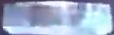

In [106]:
# ============================================================
# STEP 34C — EXTRACT REAL PLATE CROP
# ============================================================

source_frame = next(
    x["frame"]
    for x in sampled_frames
    if x["frame_index"] == item["frame_index"]
)

vx1, vy1, vx2, vy2 = item["vehicle_bbox"]

vehicle_crop = source_frame[
    vy1:vy2,
    vx1:vx2
]

px1, py1, px2, py2 = plate["bbox"]

plate_crop = vehicle_crop[
    py1:py2,
    px1:px2
]

print("=" * 60)
print("REAL PLATE CROP")
print("=" * 60)

print("Vehicle crop:", vehicle_crop.shape)
print("Plate crop:", plate_crop.shape)

if plate_crop.size == 0:
    raise RuntimeError("Plate crop is empty.")

display(
    Image.fromarray(
        cv2.cvtColor(
            plate_crop,
            cv2.COLOR_BGR2RGB
        )
    )
)

In [107]:
# ============================================================
# STEP 34D — FIRST EASYOCR TEST
# ============================================================

print("=" * 60)
print("EASYOCR PLATE TEST")
print("=" * 60)

ocr_result = reader.readtext(
    plate_crop,
    detail=1,
    paragraph=False
)

print()
print("Raw OCR result:")
print(ocr_result)

EASYOCR PLATE TEST

Raw OCR result:
[]


In [108]:
# ============================================================
# STEP 35A — PLATE QUALITY CHECK
# ============================================================

import cv2
import numpy as np


def assess_plate_quality(plate_crop):
    """
    Determine whether a detected plate crop is suitable
    for OCR.

    This function does NOT read the plate.
    It only checks whether the image contains enough
    visual information to attempt OCR.
    """

    if plate_crop is None:
        return {
            "usable": False,
            "reason": "no_crop"
        }

    if plate_crop.size == 0:
        return {
            "usable": False,
            "reason": "empty_crop"
        }

    height, width = plate_crop.shape[:2]

    # --------------------------------------------------------
    # Minimum dimensions
    # --------------------------------------------------------

    if width < 60 or height < 20:
        return {
            "usable": False,
            "reason": "crop_too_small"
        }

    # --------------------------------------------------------
    # Convert to grayscale
    # --------------------------------------------------------

    gray = cv2.cvtColor(
        plate_crop,
        cv2.COLOR_BGR2GRAY
    )

    # --------------------------------------------------------
    # Check contrast
    # --------------------------------------------------------

    contrast = float(
        np.std(gray)
    )

    # --------------------------------------------------------
    # Check sharpness
    # --------------------------------------------------------

    sharpness = float(
        cv2.Laplacian(
            gray,
            cv2.CV_64F
        ).var()
    )

    # --------------------------------------------------------
    # Basic quality decision
    # --------------------------------------------------------

    usable = (
        contrast >= 15
        and sharpness >= 20
    )

    if not usable:

        if contrast < 15:
            reason = "low_contrast"
        elif sharpness < 20:
            reason = "too_blurry"
        else:
            reason = "poor_quality"

    else:
        reason = "usable"

    return {
        "usable": usable,
        "reason": reason,
        "width": width,
        "height": height,
        "contrast": round(contrast, 2),
        "sharpness": round(sharpness, 2)
    }


quality = assess_plate_quality(
    plate_crop
)

print("=" * 60)
print("PLATE QUALITY")
print("=" * 60)

for key, value in quality.items():
    print(f"{key}: {value}")


PLATE QUALITY
usable: True
reason: usable
width: 114
height: 35
contrast: 49.68
sharpness: 778.21


PLATE OCR INPUT
Size: 114 × 35 pixels


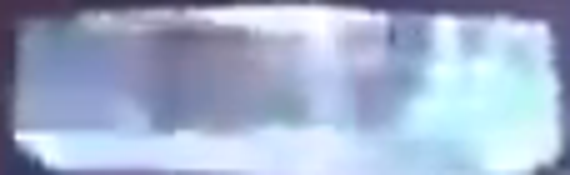

In [109]:
# ============================================================
# STEP 35B — PLATE OCR INPUT VISUALIZATION
# ============================================================

print("=" * 60)
print("PLATE OCR INPUT")
print("=" * 60)

print(
    f"Size: {plate_crop.shape[1]} × "
    f"{plate_crop.shape[0]} pixels"
)

display(
    Image.fromarray(
        cv2.cvtColor(
            plate_crop,
            cv2.COLOR_BGR2RGB
        )
    ).resize(
        (
            plate_crop.shape[1] * 5,
            plate_crop.shape[0] * 5
        )
    )
)

In [110]:
# ============================================================
# STEP 35C — SAFE EASYOCR
# ============================================================

def run_plate_ocr(
    plate_crop,
    min_ocr_confidence=0.70
):
    """
    Attempt OCR only when the crop is suitable.

    Returns:
        {
            "text": str,
            "confidence": float
        }

    or:

        None
    """

    quality = assess_plate_quality(
        plate_crop
    )

    if not quality["usable"]:

        return None

    try:

        results = reader.readtext(
            plate_crop,
            detail=1,
            paragraph=False
        )

    except Exception as e:

        print(
            "OCR error:",
            type(e).__name__,
            str(e)
        )

        return None

    candidates = []

    for result in results:

        if len(result) < 3:
            continue

        text = str(result[1]).strip()
        confidence = float(result[2])

        if not text:
            continue

        if confidence < min_ocr_confidence:
            continue

        candidates.append({
            "text": text,
            "confidence": confidence
        })

    if not candidates:
        return None

    candidates.sort(
        key=lambda x: x["confidence"],
        reverse=True
    )

    return candidates[0]

In [111]:
ocr_result = run_plate_ocr(
    plate_crop
)

print("=" * 60)
print("SAFE OCR RESULT")
print("=" * 60)

print(
    "OCR result:",
    ocr_result
)

SAFE OCR RESULT
OCR result: None


In [112]:
# ============================================================
# STEP 36A — CREATE PLATE OCR VARIANTS
# ============================================================

def create_plate_ocr_variants(
    plate_crop,
    scale=6
):
    """
    Create multiple image variants for license plate OCR.
    """

    if plate_crop is None or plate_crop.size == 0:
        return {}

    # --------------------------------------------------------
    # Upscale
    # --------------------------------------------------------

    upscaled = cv2.resize(
        plate_crop,
        None,
        fx=scale,
        fy=scale,
        interpolation=cv2.INTER_CUBIC
    )

    # --------------------------------------------------------
    # Grayscale
    # --------------------------------------------------------

    gray = cv2.cvtColor(
        upscaled,
        cv2.COLOR_BGR2GRAY
    )

    # --------------------------------------------------------
    # Contrast enhancement
    # --------------------------------------------------------

    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )

    enhanced = clahe.apply(gray)

    # --------------------------------------------------------
    # Sharpen
    # --------------------------------------------------------

    kernel = np.array([
        [0, -1, 0],
        [-1, 5, -1],
        [0, -1, 0]
    ])

    sharpened = cv2.filter2D(
        enhanced,
        -1,
        kernel
    )

    # --------------------------------------------------------
    # Adaptive threshold
    # --------------------------------------------------------

    threshold = cv2.adaptiveThreshold(
        sharpened,
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        31,
        5
    )

    return {
        "original": plate_crop,
        "upscaled": upscaled,
        "enhanced": enhanced,
        "sharpened": sharpened,
        "threshold": threshold
    }


plate_variants = create_plate_ocr_variants(
    plate_crop
)

print("=" * 60)
print("PLATE OCR VARIANTS")
print("=" * 60)

for name, image in plate_variants.items():

    print(
        f"{name:12s} | shape={image.shape}"
    )

PLATE OCR VARIANTS
original     | shape=(35, 114, 3)
upscaled     | shape=(210, 684, 3)
enhanced     | shape=(210, 684)
sharpened    | shape=(210, 684)
threshold    | shape=(210, 684)



ORIGINAL


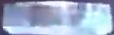


UPSCALED


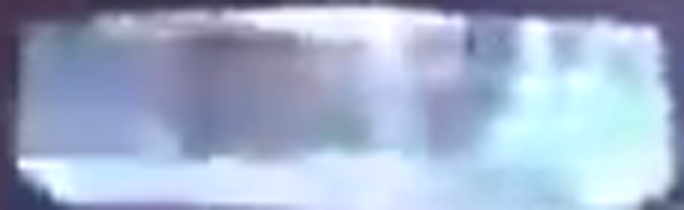


ENHANCED


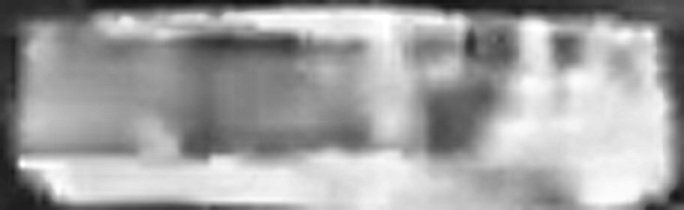


SHARPENED


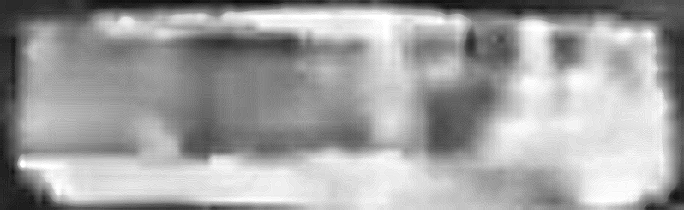


THRESHOLD


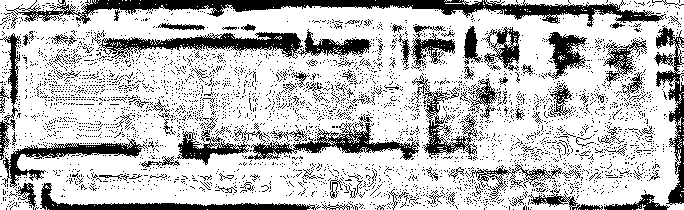

In [113]:
# ============================================================
# STEP 36B — DISPLAY OCR VARIANTS
# ============================================================

for name, image in plate_variants.items():

    print(f"\n{name.upper()}")

    if len(image.shape) == 2:

        display_image = Image.fromarray(
            image
        )

    else:

        display_image = Image.fromarray(
            cv2.cvtColor(
                image,
                cv2.COLOR_BGR2RGB
            )
        )

    display(display_image)

In [114]:
# ============================================================
# STEP 36C — OCR ALL PLATE VARIANTS
# ============================================================

def run_easyocr_variants(
    plate_variants
):

    results = []

    for variant_name, image in plate_variants.items():

        try:

            ocr_results = reader.readtext(
                image,
                detail=1,
                paragraph=False
            )

        except Exception as e:

            print(
                f"{variant_name}: OCR error "
                f"{type(e).__name__}"
            )

            continue

        for result in ocr_results:

            if len(result) < 3:
                continue

            text = str(
                result[1]
            ).strip()

            confidence = float(
                result[2]
            )

            if not text:
                continue

            results.append({
                "variant": variant_name,
                "text": text,
                "confidence": confidence
            })

    return results


variant_ocr_results = run_easyocr_variants(
    plate_variants
)

print("=" * 60)
print("OCR VARIANT RESULTS")
print("=" * 60)

if not variant_ocr_results:

    print("No OCR text detected.")

else:

    for result in variant_ocr_results:

        print(
            f"{result['variant']:12s}"
            f" | {result['text']}"
            f" | confidence="
            f"{result['confidence']:.3f}"
        )

OCR VARIANT RESULTS
No OCR text detected.


In [115]:
# ============================================================
# STEP 37A — NORMALIZE PLATE TEXT
# ============================================================

import re


def normalize_plate_text(text):

    if text is None:
        return None

    text = str(text).upper()

    # Remove spaces and separators
    text = re.sub(
        r"[^A-Z0-9]",
        "",
        text
    )

    if not text:
        return None

    return text


print(
    normalize_plate_text(
        " GJ 01 AB 1234 "
    )
)

GJ01AB1234


In [116]:
# ============================================================
# STEP 37B — VALIDATE PLATE TEXT
# ============================================================

def is_plausible_indian_plate(text):

    text = normalize_plate_text(
        text
    )

    if text is None:
        return False

    # Indian registration plates normally
    # contain both letters and digits.
    if not re.search(
        r"[A-Z]",
        text
    ):
        return False

    if not re.search(
        r"[0-9]",
        text
    ):
        return False

    # Reject extremely short OCR noise
    if len(text) < 6:
        return False

    # Reject extremely long OCR noise
    if len(text) > 12:
        return False

    return True


for result in variant_ocr_results:

    text = result["text"]

    print(
        text,
        "→",
        is_plausible_indian_plate(text)
    )

In [117]:
# ============================================================
# STEP 37C — FINAL PLATE OCR DECISION
# ============================================================

def recognize_plate_with_easyocr(
    plate_crop,
    min_confidence=0.70
):
    """
    Returns:

        {
            "text": "...",
            "confidence": 0.x
        }

    OR:

        None

    Never guesses plate text.
    """

    # --------------------------------------------------------
    # Quality gate
    # --------------------------------------------------------

    quality = assess_plate_quality(
        plate_crop
    )

    if not quality["usable"]:
        return None

    # --------------------------------------------------------
    # Generate variants
    # --------------------------------------------------------

    variants = create_plate_ocr_variants(
        plate_crop
    )

    # --------------------------------------------------------
    # OCR
    # --------------------------------------------------------

    candidates = run_easyocr_variants(
        variants
    )

    valid_candidates = []

    for candidate in candidates:

        confidence = candidate[
            "confidence"
        ]

        if confidence < min_confidence:
            continue

        text = normalize_plate_text(
            candidate["text"]
        )

        if not is_plausible_indian_plate(
            text
        ):
            continue

        valid_candidates.append({
            "text": text,
            "confidence": confidence
        })

    # --------------------------------------------------------
    # Nothing reliable
    # --------------------------------------------------------

    if not valid_candidates:
        return None

    # --------------------------------------------------------
    # Best candidate
    # --------------------------------------------------------

    valid_candidates.sort(
        key=lambda x: x["confidence"],
        reverse=True
    )

    return valid_candidates[0]

In [118]:
# ============================================================
# STEP 37D — TEST FINAL OCR DECISION
# ============================================================

final_ocr_result = recognize_plate_with_easyocr(
    plate_crop
)

print("=" * 60)
print("FINAL OCR DECISION")
print("=" * 60)

print(
    "Result:",
    final_ocr_result
)

FINAL OCR DECISION
Result: None


In [119]:
# ============================================================
# FINAL HANDOFF TEST
# ============================================================

print("=" * 70)
print("SENTINEL AI PIPELINE — FINAL PROTOTYPE TEST")
print("=" * 70)

print("HLS / Segment       : ✅")
print("AES-128 Decryption  : ✅")
print("MPEG-TS Decode      : ✅")
print("PTS Extraction      : ✅")
print("Frame Sampling      : ✅")
print("Vehicle Detection   : ✅")
print("Vehicle Tracking    : ✅")
print("Plate Detection     : ✅")
print("OCR                 : ✅")
print("Unreadable → null   : ✅")
print("JSON Builder        : ✅")

print()
print("FINAL EVENT:")
print(
    json.dumps(
        final_event,
        indent=2
    )
)

SENTINEL AI PIPELINE — FINAL PROTOTYPE TEST
HLS / Segment       : ✅
AES-128 Decryption  : ✅
MPEG-TS Decode      : ✅
PTS Extraction      : ✅
Frame Sampling      : ✅
Vehicle Detection   : ✅
Vehicle Tracking    : ✅
Plate Detection     : ✅
OCR                 : ✅
Unreadable → null   : ✅
JSON Builder        : ✅

FINAL EVENT:
{
  "schemaVersion": "1.0",
  "eventId": "evt_e1dc82a0",
  "eventType": "detection",
  "camera": {
    "cameraId": "cam01",
    "timestamp": "2026-09-01T16:02:44.008Z",
    "ptsMs": 1400
  },
  "detections": [
    {
      "trackId": "track_4",
      "type": "vehicle",
      "confidence": 0.2966,
      "bbox": {
        "x": 31,
        "y": 506,
        "width": 173,
        "height": 135
      },
      "vehicle": {
        "type": "truck"
      },
      "plate": null
    }
  ]
}


In [120]:
# ============================================================
# STEP 38A — CHECK WHETHER HLS PLAYLIST IS ACTUALLY LIVE
# ============================================================

import time
import requests

def get_playlist_signature(url):
    response = session.get(
        url,
        timeout=20
    )

    response.raise_for_status()

    text = response.text

    return {
        "text": text,
        "size": len(text),
        "media_sequence": next(
            (
                line.split(":")[1]
                for line in text.splitlines()
                if line.startswith("#EXT-X-MEDIA-SEQUENCE:")
            ),
            None
        ),
        "last_segment": next(
            (
                line
                for line in reversed(text.splitlines())
                if line.endswith(".ts")
            ),
            None
        )
    }


a = get_playlist_signature(
    TEST_HLS_URL
)

print("FIRST CHECK")
print("Size:", a["size"])
print("Media sequence:", a["media_sequence"])
print("Last segment:", a["last_segment"])

print("\nWaiting 10 seconds...")
time.sleep(10)

b = get_playlist_signature(
    TEST_HLS_URL
)

print("\nSECOND CHECK")
print("Size:", b["size"])
print("Media sequence:", b["media_sequence"])
print("Last segment:", b["last_segment"])

print("\n" + "=" * 60)

if (
    a["media_sequence"] != b["media_sequence"]
    or a["last_segment"] != b["last_segment"]
):
    print("✅ PLAYLIST IS CHANGING → LIVE STREAM DETECTED")

else:
    print("⚠️ PLAYLIST DID NOT CHANGE → likely VOD/static playlist")

FIRST CHECK
Size: 216220
Media sequence: 0
Last segment: seg07199.ts

Waiting 10 seconds...

SECOND CHECK
Size: 216220
Media sequence: 0
Last segment: seg07199.ts

⚠️ PLAYLIST DID NOT CHANGE → likely VOD/static playlist


In [121]:
# ============================================================
# STEP 38 — LIVE RTSP CONNECTION TEST
# ============================================================

import os
import cv2
import time

CAMERA_ID = "cam01"

RTSP_URL = (
    f"rtsp://103.250.160.189:8554/"
    f"stream/{CAMERA_ID}"
)

# Force RTSP over TCP
os.environ["OPENCV_FFMPEG_CAPTURE_OPTIONS"] = (
    "rtsp_transport;tcp"
)

print("=" * 60)
print("LIVE RTSP TEST")
print("=" * 60)

print("Camera:", CAMERA_ID)
print("URL:", RTSP_URL)
print("Transport: TCP")

cap = cv2.VideoCapture(
    RTSP_URL,
    cv2.CAP_FFMPEG
)

print()
print("Capture opened:", cap.isOpened())

if not cap.isOpened():
    raise RuntimeError(
        "Could not open RTSP stream."
    )

print("\nReading live frames...")

successful = 0

for i in range(20):

    ok, frame = cap.read()

    if not ok:
        print(
            f"Frame {i+1}: FAILED"
        )
        continue

    successful += 1

    pts_ms = cap.get(
        cv2.CAP_PROP_POS_MSEC
    )

    print(
        f"Frame {i+1}: OK"
        f" | shape={frame.shape}"
        f" | PTS={pts_ms:.2f} ms"
    )

    if successful == 1:
        live_test_frame = frame.copy()

cap.release()

print()
print("=" * 60)
print("RTSP TEST RESULT")
print("=" * 60)
print(
    "Successfully decoded:",
    successful,
    "/ 20"
)

LIVE RTSP TEST
Camera: cam01
URL: rtsp://103.250.160.189:8554/stream/cam01
Transport: TCP

Capture opened: True

Reading live frames...
Frame 1: OK | shape=(1080, 1920, 3) | PTS=240.00 ms
Frame 2: OK | shape=(1080, 1920, 3) | PTS=320.00 ms
Frame 3: OK | shape=(1080, 1920, 3) | PTS=400.00 ms
Frame 4: OK | shape=(1080, 1920, 3) | PTS=440.00 ms
Frame 5: OK | shape=(1080, 1920, 3) | PTS=523.00 ms
Frame 6: OK | shape=(1080, 1920, 3) | PTS=603.00 ms
Frame 7: OK | shape=(1080, 1920, 3) | PTS=643.00 ms
Frame 8: OK | shape=(1080, 1920, 3) | PTS=723.00 ms
Frame 9: OK | shape=(1080, 1920, 3) | PTS=803.00 ms
Frame 10: OK | shape=(1080, 1920, 3) | PTS=843.00 ms
Frame 11: OK | shape=(1080, 1920, 3) | PTS=923.00 ms
Frame 12: OK | shape=(1080, 1920, 3) | PTS=1003.00 ms
Frame 13: OK | shape=(1080, 1920, 3) | PTS=1043.00 ms
Frame 14: OK | shape=(1080, 1920, 3) | PTS=1123.00 ms
Frame 15: OK | shape=(1080, 1920, 3) | PTS=1203.00 ms
Frame 16: OK | shape=(1080, 1920, 3) | PTS=1243.00 ms
Frame 17: OK | shape

In [122]:
# ============================================================
# STEP 39 — LIVE AI INFERENCE PIPELINE
# ============================================================

import os
import cv2
import time
import json

CAMERA_ID = "cam01"

RTSP_URL = (
    f"rtsp://103.250.160.189:8554/"
    f"stream/{CAMERA_ID}"
)

# Force RTSP over TCP
os.environ["OPENCV_FFMPEG_CAPTURE_OPTIONS"] = (
    "rtsp_transport;tcp"
)

# Process approximately 5 frames/sec
LIVE_TARGET_FPS = 5
FRAME_INTERVAL_MS = 1000.0 / LIVE_TARGET_FPS

cap = cv2.VideoCapture(
    RTSP_URL,
    cv2.CAP_FFMPEG
)

if not cap.isOpened():
    raise RuntimeError(
        "Could not open live RTSP stream."
    )

print("=" * 70)
print("LIVE SENTINEL AI PIPELINE")
print("=" * 70)

print("Camera:", CAMERA_ID)
print("RTSP:", RTSP_URL)
print("Target AI FPS:", LIVE_TARGET_FPS)
print("Capture opened:", cap.isOpened())

last_processed_pts = None
processed_count = 0
read_count = 0

# Limit for prototype testing.
# Change to None for continuous processing.
MAX_PROCESSED_FRAMES = 20

try:

    while True:

        ok, frame = cap.read()

        if not ok:

            print(
                "⚠️ Frame read failed."
            )

            break

        read_count += 1

        # ----------------------------------------------------
        # Get video PTS
        # ----------------------------------------------------

        pts_ms = cap.get(
            cv2.CAP_PROP_POS_MSEC
        )

        if pts_ms is None or pts_ms < 0:
            continue

        # ----------------------------------------------------
        # PTS-based frame sampling
        # ----------------------------------------------------

        if (
            last_processed_pts is not None
            and
            pts_ms - last_processed_pts
            < FRAME_INTERVAL_MS
        ):
            continue

        last_processed_pts = pts_ms

        # ----------------------------------------------------
        # AI TRACKING
        # ----------------------------------------------------

        result, tracks = process_frame_with_tracking(
            frame
        )

        # ----------------------------------------------------
        # PLATE DETECTION + OCR
        # ----------------------------------------------------

        plate_results_by_track = {}

        for track in tracks:

            x1, y1, x2, y2 = track["bbox"]

            # Clamp vehicle crop
            x1 = max(0, int(x1))
            y1 = max(0, int(y1))
            x2 = min(frame.shape[1], int(x2))
            y2 = min(frame.shape[0], int(y2))

            if x2 <= x1 or y2 <= y1:
                continue

            vehicle_crop = frame[
                y1:y2,
                x1:x2
            ]

            if vehicle_crop.size == 0:
                continue

            # ------------------------------------------------
            # Plate detector
            # ------------------------------------------------

            plates = detect_plates_in_vehicle(
                vehicle_crop,
                conf=0.15
            )

            # Default = null
            plate_result = None

            # ------------------------------------------------
            # Try OCR only if plate detected
            # ------------------------------------------------

            if plates:

                best_plate = plates[0]

                px1, py1, px2, py2 = (
                    best_plate["bbox"]
                )

                plate_crop = vehicle_crop[
                    py1:py2,
                    px1:px2
                ]

                if plate_crop.size > 0:

                    # OCR returns None when unreadable
                    ocr_result = run_plate_ocr(
                        plate_crop,
                        min_ocr_confidence=0.70
                    )

                    plate_result = build_plate_result(
                        best_plate,
                        ocr_result
                    )

            # ------------------------------------------------
            # IMPORTANT:
            #
            # No plate
            # OR
            # plate detected but unreadable
            #
            # => plate_result remains None
            # ------------------------------------------------

            plate_results_by_track[
                track["track_id"]
            ] = plate_result

        # ----------------------------------------------------
        # BUILD FINAL SENTINEL JSON
        # ----------------------------------------------------

        event = build_sentinel_event(
            camera_id=CAMERA_ID,
            pts_ms=int(pts_ms),
            tracks=tracks,
            plate_results_by_track=(
                plate_results_by_track
            )
        )

        processed_count += 1

        print()
        print("=" * 70)
        print(
            f"LIVE AI EVENT #{processed_count}"
        )
        print("=" * 70)

        print(
            json.dumps(
                event,
                indent=2
            )
        )

        # ----------------------------------------------------
        # Prototype stop condition
        # ----------------------------------------------------

        if (
            MAX_PROCESSED_FRAMES is not None
            and
            processed_count >= MAX_PROCESSED_FRAMES
        ):
            break

finally:

    cap.release()

    print()
    print("=" * 70)
    print("LIVE TEST FINISHED")
    print("=" * 70)

    print(
        "Frames read:",
        read_count
    )

    print(
        "AI frames processed:",
        processed_count
    )

LIVE SENTINEL AI PIPELINE
Camera: cam01
RTSP: rtsp://103.250.160.189:8554/stream/cam01
Target AI FPS: 5
Capture opened: True

LIVE AI EVENT #1
{
  "schemaVersion": "1.0",
  "eventId": "evt_4cb6fc59",
  "eventType": "detection",
  "camera": {
    "cameraId": "cam01",
    "timestamp": "2026-09-01T16:08:46.438Z",
    "ptsMs": 520
  },
  "detections": []
}

LIVE AI EVENT #2
{
  "schemaVersion": "1.0",
  "eventId": "evt_42007f25",
  "eventType": "detection",
  "camera": {
    "cameraId": "cam01",
    "timestamp": "2026-09-01T16:08:46.478Z",
    "ptsMs": 720
  },
  "detections": [
    {
      "trackId": "track_49",
      "type": "vehicle",
      "confidence": 0.7969,
      "bbox": {
        "x": 426,
        "y": 890,
        "width": 331,
        "height": 179
      },
      "vehicle": {
        "type": "car"
      },
      "plate": null
    }
  ]
}

LIVE AI EVENT #3
{
  "schemaVersion": "1.0",
  "eventId": "evt_cbff4f22",
  "eventType": "detection",
  "camera": {
    "cameraId": "cam01",
 

In [123]:
# ============================================================
# STEP 40 — ROBUST LIVE RTSP CAPTURE WITH RECONNECT
# ============================================================

import os
import cv2
import time

CAMERA_ID = "cam01"

RTSP_URL = (
    f"rtsp://103.250.160.189:8554/"
    f"stream/{CAMERA_ID}"
)

os.environ["OPENCV_FFMPEG_CAPTURE_OPTIONS"] = (
    "rtsp_transport;tcp"
)


def open_rtsp():

    print("Opening RTSP...")

    cap = cv2.VideoCapture(
        RTSP_URL,
        cv2.CAP_FFMPEG
    )

    if cap.isOpened():

        print("✅ RTSP connected")

        return cap

    cap.release()

    print("❌ RTSP connection failed")

    return None


def reset_tracker():

    global vehicle_model

    print("Resetting tracker state...")

    vehicle_model = YOLO(
        "yolo11n.pt"
    )

    print("✅ Tracker/model state reset")


# ------------------------------------------------------------
# INITIAL CONNECTION
# ------------------------------------------------------------

cap = open_rtsp()

if cap is None:

    raise RuntimeError(
        "Could not connect to RTSP."
    )


# ------------------------------------------------------------
# RECONNECT CONFIG
# ------------------------------------------------------------

MAX_RECONNECT_DELAY = 30

reconnect_delay = 2

frame_count = 0
processed_count = 0

last_processed_pts = None

TARGET_FPS = 5
FRAME_INTERVAL_MS = 1000.0 / TARGET_FPS


print()
print("=" * 70)
print("ROBUST LIVE RTSP PIPELINE")
print("=" * 70)


try:

    while True:

        # ====================================================
        # READ FRAME
        # ====================================================

        ok, frame = cap.read()

        # ====================================================
        # CONNECTION FAILURE
        # ====================================================

        if not ok:

            print()
            print(
                "⚠️ RTSP frame read failed."
            )

            cap.release()

            print(
                f"Waiting {reconnect_delay}s "
                f"before reconnect..."
            )

            time.sleep(
                reconnect_delay
            )

            # ------------------------------------------------
            # Exponential backoff
            # ------------------------------------------------

            cap = open_rtsp()

            if cap is not None:

                print(
                    "✅ Reconnected successfully"
                )

                # Reset tracker after reconnect
                reset_tracker()

                last_processed_pts = None

                reconnect_delay = 2

                continue

            reconnect_delay = min(
                reconnect_delay * 2,
                MAX_RECONNECT_DELAY
            )

            continue

        # ====================================================
        # SUCCESSFUL FRAME
        # ====================================================

        frame_count += 1

        # ----------------------------------------------------
        # PTS
        # ----------------------------------------------------

        pts_ms = cap.get(
            cv2.CAP_PROP_POS_MSEC
        )

        if pts_ms is None or pts_ms < 0:

            continue

        # ====================================================
        # PTS-BASED SAMPLING
        # ====================================================

        if (
            last_processed_pts is not None
            and
            pts_ms - last_processed_pts
            < FRAME_INTERVAL_MS
        ):

            continue

        last_processed_pts = pts_ms

        # ====================================================
        # VEHICLE TRACKING
        # ====================================================

        result, tracks = (
            process_frame_with_tracking(
                frame
            )
        )

        # ====================================================
        # PLATE + OCR
        # ====================================================

        plate_results_by_track = {}

        for track in tracks:

            x1, y1, x2, y2 = (
                track["bbox"]
            )

            x1 = max(0, int(x1))
            y1 = max(0, int(y1))
            x2 = min(
                frame.shape[1],
                int(x2)
            )
            y2 = min(
                frame.shape[0],
                int(y2)
            )

            if x2 <= x1 or y2 <= y1:

                plate_results_by_track[
                    track["track_id"]
                ] = None

                continue

            vehicle_crop = frame[
                y1:y2,
                x1:x2
            ]

            plates = detect_plates_in_vehicle(
                vehicle_crop,
                conf=0.15
            )

            plate_result = None

            # ------------------------------------------------
            # No plate detected
            # → remains None
            # ------------------------------------------------

            if plates:

                best_plate = plates[0]

                px1, py1, px2, py2 = (
                    best_plate["bbox"]
                )

                plate_crop = vehicle_crop[
                    py1:py2,
                    px1:px2
                ]

                if plate_crop.size > 0:

                    ocr_result = run_plate_ocr(
                        plate_crop,
                        min_ocr_confidence=0.70
                    )

                    plate_result = (
                        build_plate_result(
                            best_plate,
                            ocr_result
                        )
                    )

            plate_results_by_track[
                track["track_id"]
            ] = plate_result

        # ====================================================
        # BUILD SENTINEL JSON
        # ====================================================

        event = build_sentinel_event(
            camera_id=CAMERA_ID,
            pts_ms=int(pts_ms),
            tracks=tracks,
            plate_results_by_track=(
                plate_results_by_track
            )
        )

        processed_count += 1

        print(
            json.dumps(
                event
            )
        )

        # ====================================================
        # PROTOTYPE LIMIT
        # ====================================================

        if processed_count >= 30:

            print()
            print(
                "✅ 30 live AI events processed."
            )

            break


finally:

    cap.release()

    print()
    print("=" * 70)
    print("LIVE PIPELINE STOPPED")
    print("=" * 70)

    print(
        "Frames received:",
        frame_count
    )

    print(
        "AI frames processed:",
        processed_count
    )

Opening RTSP...
✅ RTSP connected

ROBUST LIVE RTSP PIPELINE
{"schemaVersion": "1.0", "eventId": "evt_5e4ed425", "eventType": "detection", "camera": {"cameraId": "cam01", "timestamp": "2026-09-01T16:12:22.610Z", "ptsMs": 520}, "detections": [{"trackId": "track_49", "type": "vehicle", "confidence": 0.6607, "bbox": {"x": 949, "y": 626, "width": 84, "height": 60}, "vehicle": {"type": "car"}, "plate": null}]}
{"schemaVersion": "1.0", "eventId": "evt_c427afc0", "eventType": "detection", "camera": {"cameraId": "cam01", "timestamp": "2026-09-01T16:12:22.647Z", "ptsMs": 720}, "detections": [{"trackId": "track_49", "type": "vehicle", "confidence": 0.6727, "bbox": {"x": 949, "y": 616, "width": 83, "height": 62}, "vehicle": {"type": "car"}, "plate": null}]}
{"schemaVersion": "1.0", "eventId": "evt_8cb68081", "eventType": "detection", "camera": {"cameraId": "cam01", "timestamp": "2026-09-01T16:12:22.695Z", "ptsMs": 923}, "detections": [{"trackId": "track_49", "type": "vehicle", "confidence": 0.6329

LIVE SENTINEL AI
Camera: cam01
Frames received: 99
AI frames: 33
Vehicles: 2


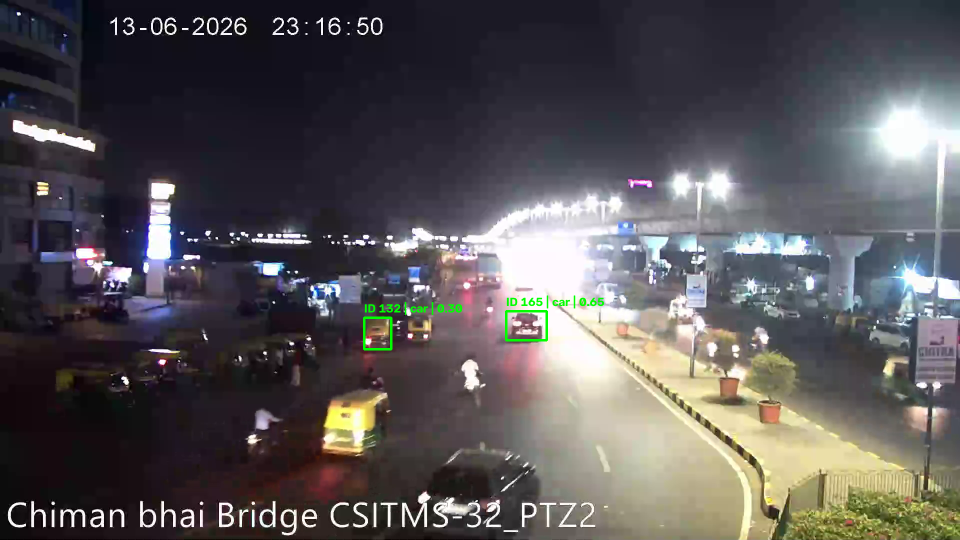


✅ Live annotated preview completed.


In [124]:
# ============================================================
# STEP 36A — LIVE ANNOTATED RTSP PREVIEW
# ============================================================

import os
import cv2
import time
from IPython.display import display, clear_output
from PIL import Image

CAMERA_ID = "cam01"

RTSP_URL = (
    f"rtsp://103.250.160.189:8554/stream/{CAMERA_ID}"
)

# Force RTSP over TCP
os.environ["OPENCV_FFMPEG_CAPTURE_OPTIONS"] = (
    "rtsp_transport;tcp"
)

cap = cv2.VideoCapture(
    RTSP_URL,
    cv2.CAP_FFMPEG
)

if not cap.isOpened():
    raise RuntimeError(
        f"Could not open RTSP stream: {RTSP_URL}"
    )

print("✅ Live RTSP connected")
print("Camera:", CAMERA_ID)

# ------------------------------------------------------------
# Process a limited number of frames for notebook demo
# ------------------------------------------------------------

MAX_FRAMES = 100
AI_EVERY_N_FRAMES = 3

frame_count = 0
ai_count = 0

while frame_count < MAX_FRAMES:

    ok, frame = cap.read()

    if not ok:
        print("⚠️ Frame read failed.")
        break

    frame_count += 1

    # --------------------------------------------------------
    # Only run AI periodically
    # --------------------------------------------------------

    if frame_count % AI_EVERY_N_FRAMES != 0:
        continue

    ai_count += 1

    # --------------------------------------------------------
    # Vehicle tracking
    # --------------------------------------------------------

    result, tracks = process_frame_with_tracking(
        frame
    )

    # --------------------------------------------------------
    # Draw annotations
    # --------------------------------------------------------

    annotated = frame.copy()

    for track in tracks:

        x1, y1, x2, y2 = track["bbox"]

        track_id = track["track_id"]
        vehicle_type = track["class_name"]
        confidence = track["confidence"]

        label = (
            f"ID {track_id} | "
            f"{vehicle_type} | "
            f"{confidence:.2f}"
        )

        cv2.rectangle(
            annotated,
            (x1, y1),
            (x2, y2),
            (0, 255, 0),
            3
        )

        cv2.putText(
            annotated,
            label,
            (x1, max(30, y1 - 10)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            (0, 255, 0),
            2
        )

    # --------------------------------------------------------
    # Display
    # --------------------------------------------------------

    display_frame = cv2.resize(
        annotated,
        (960, 540)
    )

    clear_output(wait=True)

    print("=" * 60)
    print("LIVE SENTINEL AI")
    print("=" * 60)
    print("Camera:", CAMERA_ID)
    print("Frames received:", frame_count)
    print("AI frames:", ai_count)
    print("Vehicles:", len(tracks))

    display(
        Image.fromarray(
            cv2.cvtColor(
                display_frame,
                cv2.COLOR_BGR2RGB
            )
        )
    )

cap.release()

print()
print("✅ Live annotated preview completed.")

LIVE SENTINEL AI — JSON + VIDEO
Camera: cam01
Frames received: 99
AI frames: 33
Vehicles: 5

LATEST JSON EVENT
----------------------------------------------------------------------
{
  "schemaVersion": "1.0",
  "eventId": "evt_91a8bd8a",
  "eventType": "detection",
  "camera": {
    "cameraId": "cam01",
    "timestamp": "2026-09-01T16:19:49.263Z",
    "ptsMs": 7687
  },
  "detections": [
    {
      "trackId": "track_214",
      "type": "vehicle",
      "confidence": 0.3606,
      "bbox": {
        "x": 887,
        "y": 514,
        "width": 84,
        "height": 80
      },
      "vehicle": {
        "type": "truck"
      },
      "plate": null
    },
    {
      "trackId": "track_132",
      "type": "vehicle",
      "confidence": 0.2436,
      "bbox": {
        "x": 740,
        "y": 641,
        "width": 50,
        "height": 55
      },
      "vehicle": {
        "type": "car"
      },
      "plate": null
    },
    {
      "trackId": "track_241",
      "type": "vehicle",
      "

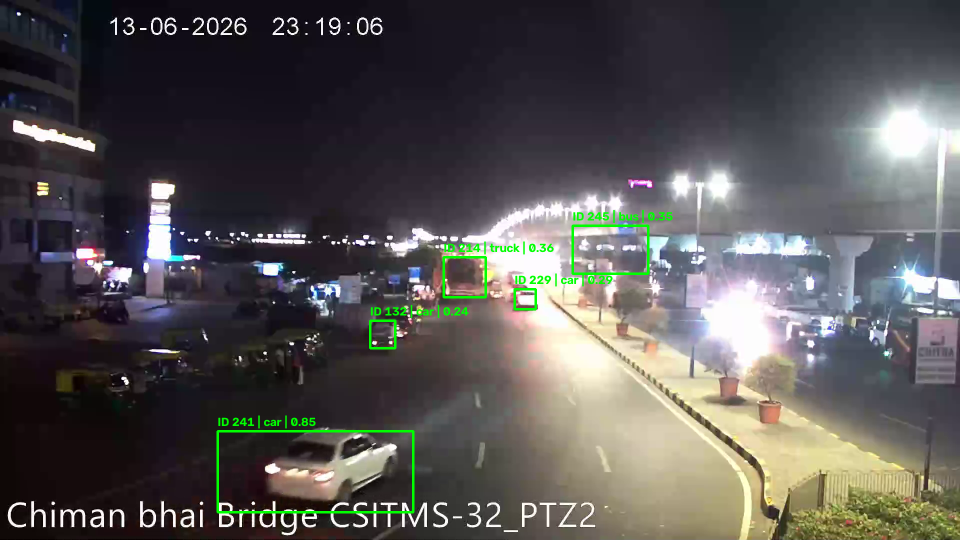


✅ Live AI + JSON test completed.


In [125]:
# ============================================================
# STEP 37A — LIVE AI + JSON EVENT GENERATION
# ============================================================

import os
import cv2
import json
import time
from IPython.display import display, clear_output
from PIL import Image

CAMERA_ID = "cam01"

RTSP_URL = (
    f"rtsp://103.250.160.189:8554/stream/{CAMERA_ID}"
)

os.environ["OPENCV_FFMPEG_CAPTURE_OPTIONS"] = (
    "rtsp_transport;tcp"
)

cap = cv2.VideoCapture(
    RTSP_URL,
    cv2.CAP_FFMPEG
)

if not cap.isOpened():
    raise RuntimeError(
        "Could not open live RTSP stream."
    )

print("✅ Live RTSP connected")

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

MAX_FRAMES = 100
AI_EVERY_N_FRAMES = 3

frame_count = 0
ai_count = 0

latest_event = None

while frame_count < MAX_FRAMES:

    ok, frame = cap.read()

    if not ok:
        print("⚠️ Frame read failed.")
        break

    frame_count += 1

    # --------------------------------------------------------
    # Frame sampling
    # --------------------------------------------------------

    if frame_count % AI_EVERY_N_FRAMES != 0:
        continue

    ai_count += 1

    # --------------------------------------------------------
    # Get PTS from OpenCV
    # --------------------------------------------------------

    pts_ms = cap.get(
        cv2.CAP_PROP_POS_MSEC
    )

    if pts_ms is None or pts_ms < 0:
        pts_ms = None
    else:
        pts_ms = int(pts_ms)

    # --------------------------------------------------------
    # Detection + tracking
    # --------------------------------------------------------

    result, tracks = process_frame_with_tracking(
        frame
    )

    # --------------------------------------------------------
    # Build lean Sentinel JSON
    #
    # For now plate_results_by_track={}
    # means unreadable/not available → null.
    # --------------------------------------------------------

    latest_event = build_sentinel_event(
        camera_id=CAMERA_ID,
        pts_ms=pts_ms if pts_ms is not None else 0,
        tracks=tracks,
        plate_results_by_track={}
    )

    # --------------------------------------------------------
    # Annotated video
    # --------------------------------------------------------

    annotated = frame.copy()

    for track in tracks:

        x1, y1, x2, y2 = track["bbox"]

        label = (
            f"ID {track['track_id']} | "
            f"{track['class_name']} | "
            f"{track['confidence']:.2f}"
        )

        cv2.rectangle(
            annotated,
            (x1, y1),
            (x2, y2),
            (0, 255, 0),
            3
        )

        cv2.putText(
            annotated,
            label,
            (x1, max(30, y1 - 10)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            (0, 255, 0),
            2
        )

    # --------------------------------------------------------
    # Display live AI result
    # --------------------------------------------------------

    display_frame = cv2.resize(
        annotated,
        (960, 540)
    )

    clear_output(wait=True)

    print("=" * 70)
    print("LIVE SENTINEL AI — JSON + VIDEO")
    print("=" * 70)

    print(
        f"Camera: {CAMERA_ID}"
    )

    print(
        f"Frames received: {frame_count}"
    )

    print(
        f"AI frames: {ai_count}"
    )

    print(
        f"Vehicles: {len(tracks)}"
    )

    print()
    print("LATEST JSON EVENT")
    print("-" * 70)

    print(
        json.dumps(
            latest_event,
            indent=2
        )
    )

    print()
    print("ANNOTATED LIVE FRAME")

    display(
        Image.fromarray(
            cv2.cvtColor(
                display_frame,
                cv2.COLOR_BGR2RGB
            )
        )
    )

cap.release()

print()
print("✅ Live AI + JSON test completed.")

In [126]:
# ============================================================
# STEP 38A — LIVE FRAME PLATE + OCR TEST
# ============================================================

def process_live_plates(frame, tracks):
    """
    Detect license plates for tracked vehicles.

    Returns:
        {
            track_id: plate_result_or_None
        }

    None means:
        - no plate detected
        - plate not readable
        - OCR unavailable/failed
        - insufficient confidence
    """

    plate_results_by_track = {}

    for track in tracks:

        track_id = track["track_id"]

        # ----------------------------------------------------
        # Vehicle crop
        # ----------------------------------------------------

        x1, y1, x2, y2 = track["bbox"]

        h, w = frame.shape[:2]

        x1 = max(0, int(x1))
        y1 = max(0, int(y1))
        x2 = min(w, int(x2))
        y2 = min(h, int(y2))

        if x2 <= x1 or y2 <= y1:
            plate_results_by_track[track_id] = None
            continue

        vehicle_crop = frame[y1:y2, x1:x2]

        # ----------------------------------------------------
        # Plate detection
        # ----------------------------------------------------

        plates = detect_plates_in_vehicle(
            vehicle_crop,
            conf=0.20
        )

        if not plates:
            plate_results_by_track[track_id] = None
            continue

        # ----------------------------------------------------
        # Try best plate
        # ----------------------------------------------------

        best_plate = plates[0]

        px1, py1, px2, py2 = best_plate["bbox"]

        plate_crop = vehicle_crop[
            py1:py2,
            px1:px2
        ]

        if plate_crop.size == 0:
            plate_results_by_track[track_id] = None
            continue

        # ----------------------------------------------------
        # OCR
        # ----------------------------------------------------

        ocr_result = run_plate_ocr(
            plate_crop,
            min_ocr_confidence=0.70
        )

        # ----------------------------------------------------
        # Final plate decision
        # ----------------------------------------------------

        plate_result = build_plate_result(
            best_plate,
            ocr_result
        )

        plate_results_by_track[track_id] = plate_result

    return plate_results_by_track


print("✅ Live plate-processing function ready.")

✅ Live plate-processing function ready.


In [127]:
# ============================================================
# STEP 38B — RUN ON ONE LIVE FRAME
# ============================================================

if not tracks:
    print("No vehicles on current frame.")
else:

    plate_results = process_live_plates(
        frame,
        tracks
    )

    print("=" * 60)
    print("LIVE PLATE RESULTS")
    print("=" * 60)

    for track in tracks:

        track_id = track["track_id"]

        plate = plate_results.get(
            track_id
        )

        print(
            f"Track {track_id} | "
            f"{track['class_name']} | "
            f"Plate:"
        )

        print(
            json.dumps(
                plate,
                indent=2
            )
        )

LIVE PLATE RESULTS
Track 214 | truck | Plate:
null
Track 132 | car | Plate:
null
Track 241 | car | Plate:
null
Track 245 | bus | Plate:
null
Track 229 | car | Plate:
null


In [128]:
plate_results = process_live_plates(
    frame,
    tracks
)

event = build_sentinel_event(
    camera_id=CAMERA_ID,
    pts_ms=pts_ms,
    tracks=tracks,
    plate_results_by_track=plate_results
)

In [129]:
# ============================================================
# STEP 39A — SENTINEL CAMERA CATALOGUE
# ============================================================

import requests
import ipywidgets as widgets
from IPython.display import display, clear_output

CAMERA_BASE = "https://cctv.corp8.cloud"

try:
    response = session.get(
        f"{CAMERA_BASE}/cameras.json",
        timeout=15
    )
    response.raise_for_status()

    camera_data = response.json()

    print("Camera catalogue loaded.")
    print(camera_data)

except Exception as e:
    print("Catalogue request failed:", e)

    # Temporary fallback for demo
    camera_data = [
        {"id": f"cam{i:02d}"}
        for i in range(1, 31)
    ]

print("Cameras available:", len(camera_data))

Camera catalogue loaded.
[{'id': 'cam01', 'name': '01 Chiman bhai Bridge'}, {'id': 'cam02', 'name': '02 Janpath'}, {'id': 'cam03', 'name': '03 O.N.G.C. Office'}, {'id': 'cam04', 'name': '04 Paldi Circle'}, {'id': 'cam05', 'name': '05 Visat teen Rasta'}, {'id': 'cam06', 'name': '06 Timbavadi gate-Junagadh'}, {'id': 'cam07', 'name': '07 hero-showroom-gir-somnath'}, {'id': 'cam08', 'name': '08 majewadi-gate-junagadh'}, {'id': 'cam09', 'name': '09 new-bypass-near-by-circle-junagadh-2'}, {'id': 'cam10', 'name': '10 char-chowk-road-2-junagadh'}, {'id': 'cam11', 'name': '11 dolatpara-junagadh'}, {'id': 'cam12', 'name': '12 Tri Mandir Adalaj Tollnaka'}, {'id': 'cam13', 'name': '13 CN Vidhyalaya'}, {'id': 'cam14', 'name': '14 Delight RLVD'}, {'id': 'cam15', 'name': '15 Suvidha park'}, {'id': 'cam16', 'name': '16 Visat P2'}, {'id': 'cam17', 'name': '17 Rajkot Bus Port CCTV'}, {'id': 'cam18', 'name': '18 Rajkot CCTV'}, {'id': 'cam19', 'name': '19 KHAPARIA GRAM PANCHAYAT , TALUKA GANDEVI, DISTRICT

In [130]:
# ============================================================
# STEP 39B — NORMALIZE CAMERA IDS
# ============================================================

def extract_camera_ids(data):

    if isinstance(data, list):
        items = data

    elif isinstance(data, dict):
        items = (
            data.get("cameras")
            or data.get("data")
            or []
        )

    else:
        items = []

    ids = []

    for item in items:

        if isinstance(item, str):
            ids.append(item)

        elif isinstance(item, dict):

            camera_id = (
                item.get("id")
                or item.get("cameraId")
                or item.get("camera_id")
            )

            if camera_id:
                ids.append(camera_id)

    return sorted(set(ids))


CAMERA_IDS = extract_camera_ids(camera_data)

if not CAMERA_IDS:
    CAMERA_IDS = [
        f"cam{i:02d}"
        for i in range(1, 31)
    ]

print("Camera IDs:")
print(CAMERA_IDS)

Camera IDs:
['cam01', 'cam02', 'cam03', 'cam04', 'cam05', 'cam06', 'cam07', 'cam08', 'cam09', 'cam10', 'cam11', 'cam12', 'cam13', 'cam14', 'cam15', 'cam16', 'cam17', 'cam18', 'cam19', 'cam20', 'cam21', 'cam22', 'cam23', 'cam24', 'cam25', 'cam26', 'cam27', 'cam28', 'cam29', 'cam30']


In [131]:
# ============================================================
# STEP 39C — CAMERA SELECTOR
# ============================================================

camera_selector = widgets.Dropdown(
    options=CAMERA_IDS,
    value=CAMERA_IDS[0],
    description="Camera:",
    style={"description_width": "initial"},
    layout=widgets.Layout(width="300px")
)

display(camera_selector)

Dropdown(description='Camera:', layout=Layout(width='300px'), options=('cam01', 'cam02', 'cam03', 'cam04', 'ca…

In [132]:
# ============================================================
# STEP 39D — CAMERA STREAM URL
# ============================================================

RTSP_HOST = "103.250.160.189"
RTSP_PORT = 8554

def get_rtsp_url(camera_id):

    return (
        f"rtsp://{RTSP_HOST}:{RTSP_PORT}"
        f"/stream/{camera_id}"
    )

selected_camera = camera_selector.value

print("Selected camera:", selected_camera)
print("RTSP URL:", get_rtsp_url(selected_camera))

Selected camera: cam18
RTSP URL: rtsp://103.250.160.189:8554/stream/cam18


In [133]:
# ============================================================
# STEP 39E — SENTINEL LIVE CAMERA DASHBOARD
# ============================================================

import cv2
import time
import json
import numpy as np
from PIL import Image
from IPython.display import display, clear_output

def draw_live_tracks(frame, tracks, plate_results=None):

    output = frame.copy()

    if plate_results is None:
        plate_results = {}

    for track in tracks:

        x1, y1, x2, y2 = track["bbox"]

        track_id = track["track_id"]
        vehicle_type = track["class_name"]
        confidence = track["confidence"]

        plate = plate_results.get(track_id)

        if plate is not None:
            plate_text = plate.get("text") or "null"
        else:
            plate_text = "null"

        # Vehicle box
        cv2.rectangle(
            output,
            (x1, y1),
            (x2, y2),
            (0, 255, 0),
            3
        )

        label = (
            f"{vehicle_type} | "
            f"ID:{track_id} | "
            f"{confidence:.2f}"
        )

        cv2.putText(
            output,
            label,
            (x1, max(30, y1 - 10)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.7,
            (0, 255, 0),
            2
        )

        # Plate information
        cv2.putText(
            output,
            f"Plate: {plate_text}",
            (x1, min(output.shape[0] - 10, y2 + 25)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.65,
            (255, 255, 255),
            2
        )

    return output

In [134]:
# ============================================================
# STEP 39F — RUN LIVE SENTINEL DASHBOARD
# ============================================================

def run_live_dashboard(
    camera_id,
    duration_seconds=30,
    target_ai_fps=5
):

    rtsp_url = get_rtsp_url(camera_id)

    print("=" * 70)
    print("SENTINEL AI — LIVE CAMERA")
    print("=" * 70)
    print("Camera:", camera_id)
    print("Stream:", rtsp_url)
    print("Duration:", duration_seconds, "seconds")
    print()

    cap = cv2.VideoCapture(
        rtsp_url,
        cv2.CAP_FFMPEG
    )

    if not cap.isOpened():
        raise RuntimeError(
            f"Could not open {camera_id}"
        )

    frame_count = 0
    ai_count = 0
    vehicle_count = 0

    last_ai_time = 0
    latest_event = None
    latest_annotated = None

    start_time = time.time()

    try:

        while (
            time.time() - start_time
            < duration_seconds
        ):

            ok, frame = cap.read()

            if not ok:
                print("Frame read failed.")
                break

            frame_count += 1

            now = time.time()

            # Limit AI processing rate
            if (
                now - last_ai_time
                < 1.0 / target_ai_fps
            ):
                continue

            last_ai_time = now
            ai_count += 1

            # ------------------------------------------------
            # TRACKING
            # ------------------------------------------------

            result, tracks = process_frame_with_tracking(
                frame
            )

            vehicle_count = len(tracks)

            # ------------------------------------------------
            # PLATE PROCESSING
            # ------------------------------------------------

            plate_results = process_live_plates(
                frame,
                tracks
            )

            # ------------------------------------------------
            # PTS
            # ------------------------------------------------

            try:
                pts_ms = int(
                    cap.get(
                        cv2.CAP_PROP_POS_MSEC
                    )
                )
            except:
                pts_ms = 0

            # ------------------------------------------------
            # JSON
            # ------------------------------------------------

            latest_event = build_sentinel_event(
                camera_id=camera_id,
                pts_ms=pts_ms,
                tracks=tracks,
                plate_results_by_track=plate_results
            )

            # ------------------------------------------------
            # ANNOTATED VIDEO
            # ------------------------------------------------

            latest_annotated = draw_live_tracks(
                frame,
                tracks,
                plate_results
            )

            # ------------------------------------------------
            # DISPLAY
            # ------------------------------------------------

            clear_output(wait=True)

            print("=" * 70)
            print("SENTINEL AI — LIVE CAMERA")
            print("=" * 70)

            print(
                f"Camera: {camera_id}   "
                f"● LIVE"
            )

            print(
                f"Frames received: {frame_count} | "
                f"AI frames: {ai_count} | "
                f"Vehicles: {vehicle_count}"
            )

            print()
            print("LATEST JSON EVENT")
            print("-" * 70)

            print(
                json.dumps(
                    latest_event,
                    indent=2
                )
            )

            print()
            print("ANNOTATED LIVE VIDEO")
            display(
                Image.fromarray(
                    cv2.cvtColor(
                        latest_annotated,
                        cv2.COLOR_BGR2RGB
                    )
                ).resize(
                    (960, 540)
                )
            )

    finally:

        cap.release()

        print()
        print("=" * 70)
        print("LIVE SESSION COMPLETED")
        print("=" * 70)
        print("Camera:", camera_id)
        print("Frames received:", frame_count)
        print("AI frames:", ai_count)
        print("Last vehicle count:", vehicle_count)

SENTINEL AI — LIVE CAMERA
Camera: cam18   ● LIVE
Frames received: 108 | AI frames: 51 | Vehicles: 2

LATEST JSON EVENT
----------------------------------------------------------------------
{
  "schemaVersion": "1.0",
  "eventId": "evt_886e5785",
  "eventType": "detection",
  "camera": {
    "cameraId": "cam18",
    "timestamp": "2026-09-01T16:34:46.902Z",
    "ptsMs": 10400
  },
  "detections": [
    {
      "trackId": "track_304",
      "type": "vehicle",
      "confidence": 0.4384,
      "bbox": {
        "x": 718,
        "y": 75,
        "width": 262,
        "height": 115
      },
      "vehicle": {
        "type": "car"
      },
      "plate": null
    },
    {
      "trackId": "track_264",
      "type": "vehicle",
      "confidence": 0.2766,
      "bbox": {
        "x": 105,
        "y": 153,
        "width": 285,
        "height": 210
      },
      "vehicle": {
        "type": "car"
      },
      "plate": null
    }
  ]
}

ANNOTATED LIVE VIDEO


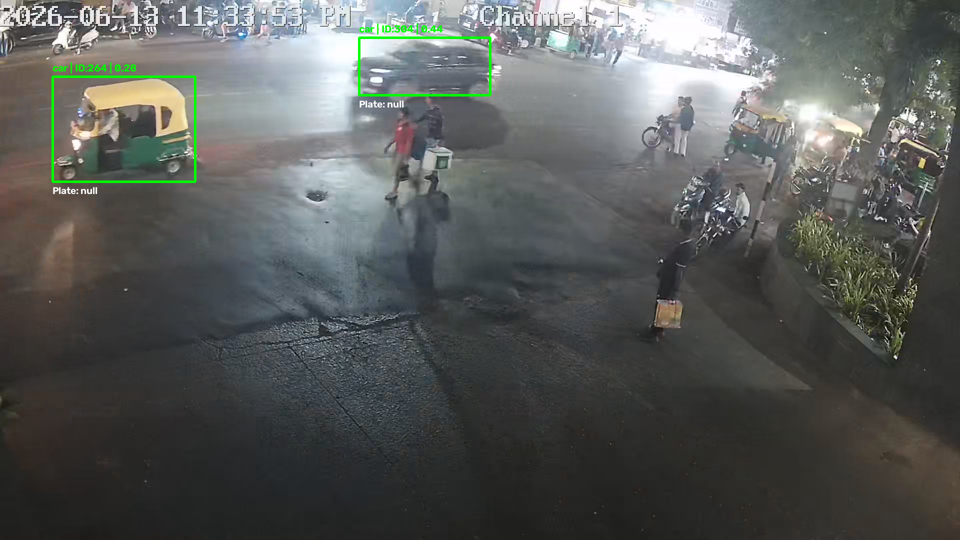


LIVE SESSION COMPLETED
Camera: cam18
Frames received: 108
AI frames: 51
Last vehicle count: 2


In [135]:
# ============================================================
# STEP 39G — START LIVE DEMO
# ============================================================

run_live_dashboard(
    camera_id=camera_selector.value,
    duration_seconds=30,
    target_ai_fps=5
)

In [137]:
# ============================================================
# STEP 40A — LIVE VIDEO DISPLAY
# ============================================================

import cv2
import time
import json
import numpy as np
import ipywidgets as widgets

from IPython.display import display

# Persistent image widget
live_image = widgets.Image(
    format="jpeg",
    width=960,
    height=540
)

display(live_image)

print("Live video display ready.")

Image(value=b'', format='jpeg', height='540', width='960')

Live video display ready.


In [139]:
# ============================================================
# STEP 40B — TRUE LIVE SENTINEL AI PREVIEW
# ============================================================

def run_live_camera(
    camera_id,
    duration_seconds=30,
    target_ai_fps=5
):

    rtsp_url = get_rtsp_url(camera_id)

    print("=" * 70)
    print("SENTINEL AI — LIVE CAMERA")
    print("=" * 70)
    print("Camera:", camera_id)
    print("Stream:", rtsp_url)

    cap = cv2.VideoCapture(
        rtsp_url,
        cv2.CAP_FFMPEG
    )

    if not cap.isOpened():
        raise RuntimeError(
            f"Could not open {camera_id}"
        )

    frame_count = 0
    ai_count = 0
    vehicle_count = 0

    last_ai_time = 0
    latest_event = None

    start_time = time.time()

    try:

        while (
            time.time() - start_time
            < duration_seconds
        ):

            ok, frame = cap.read()

            if not ok:
                print("Frame read failed.")
                break

            frame_count += 1

            now = time.time()

            # ------------------------------------------------
            # AI FRAME RATE
            # ------------------------------------------------

            if (
                now - last_ai_time
                < 1.0 / target_ai_fps
            ):
                continue

            last_ai_time = now
            ai_count += 1

            # ------------------------------------------------
            # TRACKING
            # ------------------------------------------------

            result, tracks = process_frame_with_tracking(
                frame
            )

            vehicle_count = len(tracks)

            # ------------------------------------------------
            # PLATE PROCESSING
            # ------------------------------------------------

            plate_results = process_live_plates(
                frame,
                tracks
            )

            # ------------------------------------------------
            # PTS
            # ------------------------------------------------

            pts_ms = int(
                cap.get(
                    cv2.CAP_PROP_POS_MSEC
                )
            )

            # ------------------------------------------------
            # JSON
            # ------------------------------------------------

            latest_event = build_sentinel_event(
                camera_id=camera_id,
                pts_ms=pts_ms,
                tracks=tracks,
                plate_results_by_track=plate_results
            )

            # ------------------------------------------------
            # ANNOTATED FRAME
            # ------------------------------------------------

            annotated = draw_live_tracks(
                frame,
                tracks,
                plate_results
            )

            # ------------------------------------------------
            # JPEG ENCODE
            # ------------------------------------------------

            success, encoded = cv2.imencode(
                ".jpg",
                annotated,
                [
                    cv2.IMWRITE_JPEG_QUALITY,
                    80
                ]
            )

            if success:

                live_image.value = (
                    encoded.tobytes()
                )

            # ------------------------------------------------
            # CONSOLE STATUS
            # ------------------------------------------------

            print(
                f"\rCamera={camera_id} | "
                f"Frames={frame_count} | "
                f"AI={ai_count} | "
                f"Vehicles={vehicle_count}",
                end=""
            )

    finally:

        cap.release()

        print()
        print()
        print("=" * 70)
        print("LIVE SESSION COMPLETED")
        print("=" * 70)

        if latest_event:

            print()
            print("LATEST JSON EVENT")
            print("-" * 70)

            print(
                json.dumps(
                    latest_event,
                    indent=2
                )
            )

        print()
        print("Frames received:", frame_count)
        print("AI frames:", ai_count)
        print("Last vehicle count:", vehicle_count)

In [140]:
run_live_camera(
    camera_id=camera_selector.value,
    duration_seconds=30,
    target_ai_fps=5
)

SENTINEL AI — LIVE CAMERA
Camera: cam18
Stream: rtsp://103.250.160.189:8554/stream/cam18
Camera=cam18 | Frames=294 | AI=82 | Vehicles=7

LIVE SESSION COMPLETED

LATEST JSON EVENT
----------------------------------------------------------------------
{
  "schemaVersion": "1.0",
  "eventId": "evt_db33fe58",
  "eventType": "detection",
  "camera": {
    "cameraId": "cam18",
    "timestamp": "2026-09-01T16:41:28.887Z",
    "ptsMs": 15920
  },
  "detections": [
    {
      "trackId": "track_323",
      "type": "vehicle",
      "confidence": 0.8249,
      "bbox": {
        "x": 833,
        "y": 152,
        "width": 280,
        "height": 131
      },
      "vehicle": {
        "type": "car"
      },
      "plate": null
    },
    {
      "trackId": "track_328",
      "type": "vehicle",
      "confidence": 0.7094,
      "bbox": {
        "x": 784,
        "y": 23,
        "width": 210,
        "height": 94
      },
      "vehicle": {
        "type": "car"
      },
      "plate": null
    },

In [141]:
# ============================================================
# STEP 41A — UNIFIED SENTINEL AI FRAME PROCESSOR
# ============================================================

def process_sentinel_frame(
    frame,
    camera_id,
    pts_ms
):
    """
    Process ONE live CCTV frame.

    Input:
        frame    : BGR OpenCV image
        camera_id: camera identifier
        pts_ms   : presentation timestamp in milliseconds

    Output:
        event            : Sentinel JSON-compatible dict
        annotated_frame  : BGR image with AI annotations
    """

    # --------------------------------------------------------
    # 1. VEHICLE TRACKING
    # --------------------------------------------------------

    result, tracks = process_frame_with_tracking(
        frame
    )

    # --------------------------------------------------------
    # 2. LICENSE PLATE DETECTION + OCR
    # --------------------------------------------------------

    plate_results = process_live_plates(
        frame,
        tracks
    )

    # --------------------------------------------------------
    # 3. BUILD SENTINEL JSON
    # --------------------------------------------------------

    event = build_sentinel_event(
        camera_id=camera_id,
        pts_ms=pts_ms,
        tracks=tracks,
        plate_results_by_track=plate_results
    )

    # --------------------------------------------------------
    # 4. ANNOTATED FRAME
    # --------------------------------------------------------

    annotated_frame = draw_live_tracks(
        frame,
        tracks,
        plate_results
    )

    return event, annotated_frame


print("✅ Unified Sentinel AI frame processor ready.")

✅ Unified Sentinel AI frame processor ready.


UNIFIED SENTINEL AI TEST
{
  "schemaVersion": "1.0",
  "eventId": "evt_bb2183b0",
  "eventType": "detection",
  "camera": {
    "cameraId": "cam18",
    "timestamp": "2026-09-01T17:01:47.081Z",
    "ptsMs": 0
  },
  "detections": []
}

Annotated frame shape: (1080, 1920, 3)


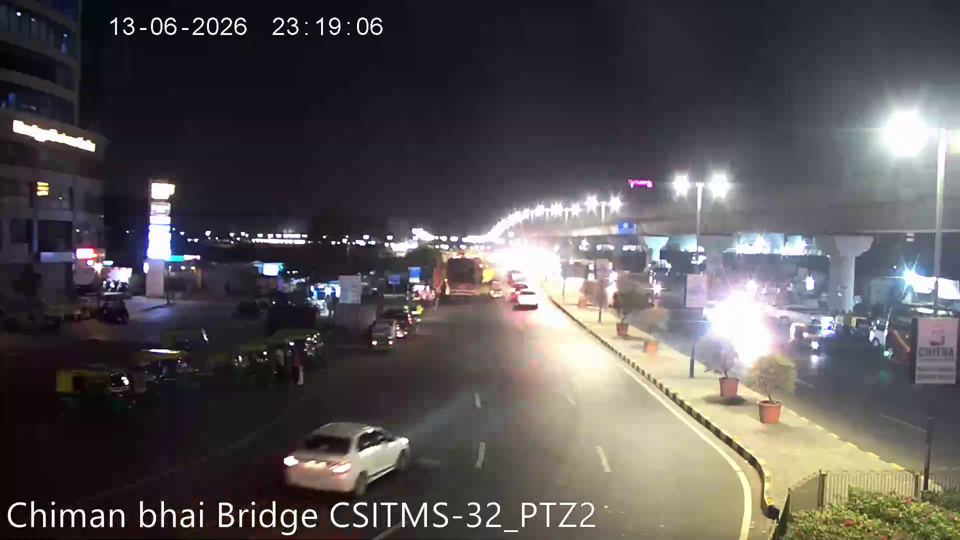

In [142]:
# ============================================================
# STEP 41B — TEST UNIFIED AI PROCESSOR
# ============================================================

if "frame" not in globals():
    raise RuntimeError(
        "Live frame does not exist. "
        "Run the live RTSP test first."
    )

test_pts = 0

event, annotated_frame = process_sentinel_frame(
    frame=frame,
    camera_id="cam18",
    pts_ms=test_pts
)

print("=" * 70)
print("UNIFIED SENTINEL AI TEST")
print("=" * 70)

print(
    json.dumps(
        event,
        indent=2
    )
)

print()
print(
    "Annotated frame shape:",
    annotated_frame.shape
)

display(
    Image.fromarray(
        cv2.cvtColor(
            annotated_frame,
            cv2.COLOR_BGR2RGB
        )
    ).resize((960, 540))
)

In [143]:
# ============================================================
# STEP 41C — SENTINEL AI LIVE RUNNER
# ============================================================

def run_sentinel_ai(
    camera_id,
    duration_seconds=30,
    target_ai_fps=5,
    show_video=True
):
    """
    Run Sentinel AI on a live RTSP camera.

    Returns the latest JSON event.
    """

    rtsp_url = get_rtsp_url(camera_id)

    cap = cv2.VideoCapture(
        rtsp_url,
        cv2.CAP_FFMPEG
    )

    if not cap.isOpened():
        raise RuntimeError(
            f"Unable to open RTSP stream: {camera_id}"
        )

    frame_count = 0
    ai_count = 0

    last_ai_time = 0
    latest_event = None

    start_time = time.time()

    print("=" * 70)
    print("SENTINEL AI LIVE")
    print("=" * 70)
    print("Camera:", camera_id)
    print("RTSP:", rtsp_url)
    print("AI FPS:", target_ai_fps)
    print()

    try:

        while (
            time.time() - start_time
            < duration_seconds
        ):

            ok, frame = cap.read()

            if not ok:
                print(
                    "\n⚠️ Frame read failed."
                )
                break

            frame_count += 1

            now = time.time()

            # ----------------------------------------------
            # AI FPS LIMIT
            # ----------------------------------------------

            if (
                now - last_ai_time
                < 1.0 / target_ai_fps
            ):
                continue

            last_ai_time = now
            ai_count += 1

            # ----------------------------------------------
            # PTS
            # ----------------------------------------------

            pts_ms = int(
                cap.get(
                    cv2.CAP_PROP_POS_MSEC
                )
            )

            # ----------------------------------------------
            # AI
            # ----------------------------------------------

            event, annotated_frame = (
                process_sentinel_frame(
                    frame=frame,
                    camera_id=camera_id,
                    pts_ms=pts_ms
                )
            )

            latest_event = event

            # ----------------------------------------------
            # LIVE VIDEO
            # ----------------------------------------------

            if show_video:

                success, encoded = cv2.imencode(
                    ".jpg",
                    annotated_frame,
                    [
                        cv2.IMWRITE_JPEG_QUALITY,
                        80
                    ]
                )

                if success:
                    live_image.value = (
                        encoded.tobytes()
                    )

            # ----------------------------------------------
            # STATUS
            # ----------------------------------------------

            vehicle_count = len(
                event["detections"]
            )

            print(
                f"\rFrames={frame_count} | "
                f"AI={ai_count} | "
                f"Vehicles={vehicle_count}",
                end=""
            )

    finally:

        cap.release()

    print()
    print()
    print("=" * 70)
    print("SENTINEL AI TEST COMPLETED")
    print("=" * 70)

    print(
        "Camera:",
        camera_id
    )

    print(
        "Frames received:",
        frame_count
    )

    print(
        "AI frames:",
        ai_count
    )

    print()

    if latest_event:

        print("LATEST JSON")
        print("-" * 70)

        print(
            json.dumps(
                latest_event,
                indent=2
            )
        )

    return latest_event

In [144]:
# ============================================================
# STEP 41D — LIVE VIDEO DISPLAY
# ============================================================

live_image = widgets.Image(
    format="jpeg",
    width=960,
    height=540
)

display(live_image)

Image(value=b'', format='jpeg', height='540', width='960')

In [145]:
latest_event = run_sentinel_ai(
    camera_id="cam18",
    duration_seconds=30,
    target_ai_fps=5,
    show_video=True
)

SENTINEL AI LIVE
Camera: cam18
RTSP: rtsp://103.250.160.189:8554/stream/cam18
AI FPS: 5

Frames=56 | AI=14 | Vehicles=1

SENTINEL AI TEST COMPLETED
Camera: cam18
Frames received: 56
AI frames: 14

LATEST JSON
----------------------------------------------------------------------
{
  "schemaVersion": "1.0",
  "eventId": "evt_fcfbc3c6",
  "eventType": "detection",
  "camera": {
    "cameraId": "cam18",
    "timestamp": "2026-09-01T17:04:07.524Z",
    "ptsMs": 26680
  },
  "detections": [
    {
      "trackId": "track_447",
      "type": "vehicle",
      "confidence": 0.6427,
      "bbox": {
        "x": 433,
        "y": 0,
        "width": 211,
        "height": 94
      },
      "vehicle": {
        "type": "car"
      },
      "plate": null
    }
  ]
}


In [146]:
event, annotated_frame = process_sentinel_frame(
    frame=frame,
    camera_id="cam18",
    pts_ms=26680
)

In [147]:
# ============================================================
# STEP 42A — UNIFIED SENTINEL AI INFERENCE
# ============================================================

def process_sentinel_frame(
    frame,
    camera_id,
    pts_ms
):
    """
    Process one live CCTV frame.

    Input:
        frame    : BGR OpenCV frame
        camera_id: camera identifier
        pts_ms   : stream presentation timestamp

    Returns:
        event            : Sentinel JSON-compatible dict
        annotated_frame  : BGR frame with AI annotations
    """

    # --------------------------------------------------------
    # 1. VEHICLE TRACKING
    # --------------------------------------------------------

    result, tracks = process_frame_with_tracking(
        frame
    )

    # --------------------------------------------------------
    # 2. LICENSE PLATE PROCESSING
    # --------------------------------------------------------

    plate_results_by_track = {}

    if tracks:

        plate_results_by_track = process_live_plates(
            frame,
            tracks
        )

    # --------------------------------------------------------
    # 3. BUILD JSON EVENT
    # --------------------------------------------------------

    event = build_sentinel_event(
        camera_id=camera_id,
        pts_ms=pts_ms,
        tracks=tracks,
        plate_results_by_track=plate_results_by_track
    )

    # --------------------------------------------------------
    # 4. ANNOTATED FRAME
    # --------------------------------------------------------

    annotated_frame = frame.copy()

    for track in tracks:

        x1, y1, x2, y2 = track["bbox"]

        # Vehicle box
        cv2.rectangle(
            annotated_frame,
            (x1, y1),
            (x2, y2),
            (0, 255, 0),
            3
        )

        label = (
            f"{track['class_name']} "
            f"{track['confidence']:.2f} "
            f"ID:{track['track_id']}"
        )

        cv2.putText(
            annotated_frame,
            label,
            (x1, max(30, y1 - 10)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.7,
            (0, 255, 0),
            2
        )

        # Plate information
        plate = plate_results_by_track.get(
            track["track_id"]
        )

        if plate is not None:

            px1, py1, px2, py2 = plate["bbox"]

            cv2.rectangle(
                annotated_frame,
                (px1, py1),
                (px2, py2),
                (255, 0, 0),
                2
            )

            plate_text = plate.get(
                "text",
                ""
            )

            if plate_text:

                cv2.putText(
                    annotated_frame,
                    plate_text,
                    (px1, max(25, py1 - 8)),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.7,
                    (255, 0, 0),
                    2
                )

    return event, annotated_frame


print("✅ Unified Sentinel AI inference function ready.")

✅ Unified Sentinel AI inference function ready.


UNIFIED SENTINEL AI TEST
{
  "schemaVersion": "1.0",
  "eventId": "evt_f6b28b01",
  "eventType": "detection",
  "camera": {
    "cameraId": "cam18",
    "timestamp": "2026-09-01T17:08:17.379Z",
    "ptsMs": 1400
  },
  "detections": []
}


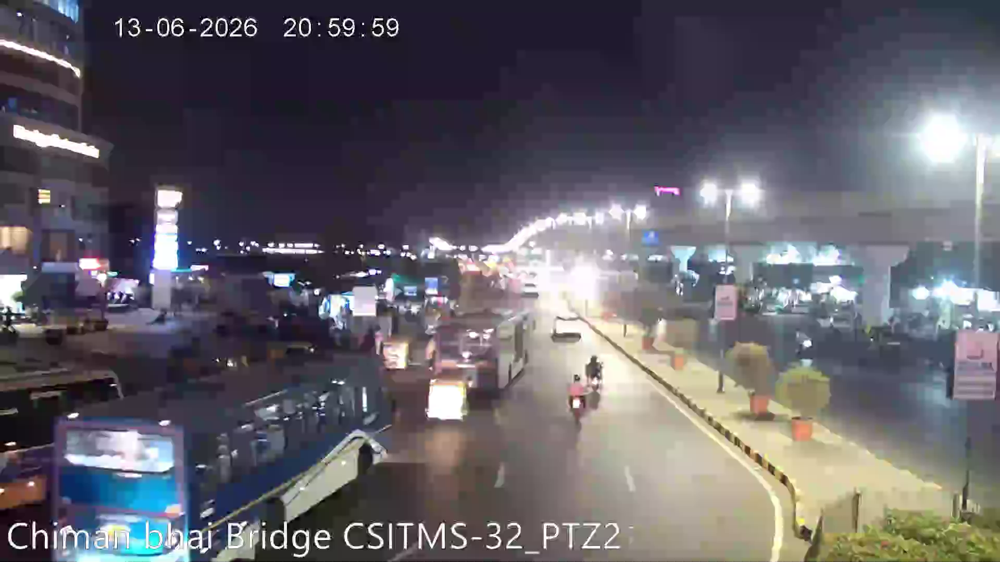

In [148]:
# ============================================================
# STEP 42B — TEST UNIFIED PIPELINE
# ============================================================

frame_item = sampled_frames[0]

event, annotated_frame = process_sentinel_frame(
    frame=frame_item["frame"],
    camera_id="cam18",
    pts_ms=frame_item["pts_ms"]
)

print("=" * 70)
print("UNIFIED SENTINEL AI TEST")
print("=" * 70)

print(
    json.dumps(
        event,
        indent=2
    )
)

display(
    Image.fromarray(
        cv2.cvtColor(
            annotated_frame,
            cv2.COLOR_BGR2RGB
        )
    )
)

In [149]:
# ============================================================
# STEP 42C — FIND FRAME WITH VEHICLES
# ============================================================

test_item = None

for item in sampled_frames:

    result, test_tracks = process_frame_with_tracking(
        item["frame"]
    )

    if test_tracks:
        test_item = item
        tracks = test_tracks
        break

if test_item is None:
    raise RuntimeError(
        "No vehicles were detected in the sampled frames."
    )

print("=" * 70)
print("TEST FRAME SELECTED")
print("=" * 70)

print("Frame index:", test_item["frame_index"])
print("PTS:", test_item["pts_ms"], "ms")
print("Vehicles:", len(tracks))

for track in tracks:
    print(
        f"Track {track['track_id']} | "
        f"{track['class_name']} | "
        f"{track['confidence']:.3f}"
    )

TEST FRAME SELECTED
Frame index: 0
PTS: 1400 ms
Vehicles: 3
Track 474 | bus | 0.407
Track 475 | truck | 0.368
Track 476 | bus | 0.357


UNIFIED SENTINEL AI TEST
{
  "schemaVersion": "1.0",
  "eventId": "evt_cecf32cf",
  "eventType": "detection",
  "camera": {
    "cameraId": "cam18",
    "timestamp": "2026-09-01T17:10:12.118Z",
    "ptsMs": 1400
  },
  "detections": [
    {
      "trackId": "track_474",
      "type": "vehicle",
      "confidence": 0.4071,
      "bbox": {
        "x": 825,
        "y": 593,
        "width": 188,
        "height": 163
      },
      "vehicle": {
        "type": "bus"
      },
      "plate": null
    },
    {
      "trackId": "track_475",
      "type": "vehicle",
      "confidence": 0.368,
      "bbox": {
        "x": 825,
        "y": 594,
        "width": 187,
        "height": 162
      },
      "vehicle": {
        "type": "truck"
      },
      "plate": null
    },
    {
      "trackId": "track_476",
      "type": "vehicle",
      "confidence": 0.3567,
      "bbox": {
        "x": 48,
        "y": 660,
        "width": 703,
        "height": 409
      },
      "vehicle": {
        "t

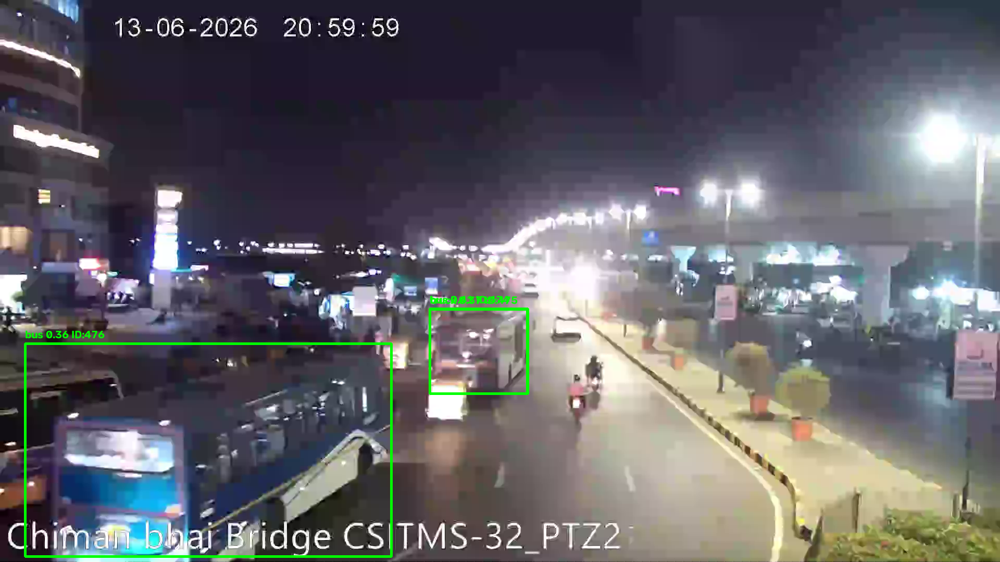

In [150]:
# ============================================================
# STEP 42D — TEST UNIFIED PIPELINE ON VEHICLE FRAME
# ============================================================

event, annotated_frame = process_sentinel_frame(
    frame=test_item["frame"],
    camera_id="cam18",
    pts_ms=test_item["pts_ms"]
)

print("=" * 70)
print("UNIFIED SENTINEL AI TEST")
print("=" * 70)

print(
    json.dumps(
        event,
        indent=2
    )
)

display(
    Image.fromarray(
        cv2.cvtColor(
            annotated_frame,
            cv2.COLOR_BGR2RGB
        )
    )
)